# Active Experimental Design under Noise and Budget Constraints

In many experiments we aim to discover how a property depends on composition or processing conditions. This is often a case for characterization by XRD, SPM, Raman etc. of spread combinatorial libraries, where a continuous range of compositions is explored on a single substrate.

A mainstream approach for automating such experiments is Bayesian optimization (BO), where a surrogate model (e.g. Gaussian process) is used to predict the property and guide the selection of the next measurement in an active, closed-loop manner.

However, classical BO typically assumes idealized conditions and does not explicitly account for key experimental constraints, such as:

- measurement noise that depends on acquisition time,
- limited experimental budget,
- and cost of moving between measurement locations.

In this challenge, the goal is to design a strategy that, using a surrogate model, decides:

- **where to measure**,
- **in what order**,
- and **for how long**,

in order to efficiently explore and recover the underlying functional dependence under these realistic conditions.

###gif_Classical BO with GP surrogate model



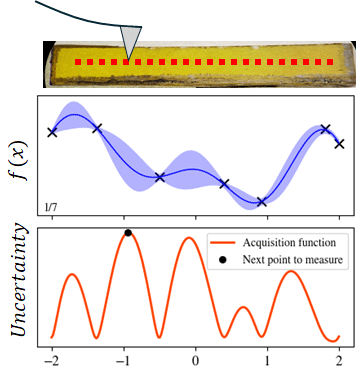

## Functions

In [ ]:
!pip install gpytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 291.2/291.2 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.8/174.8 kB 8.3 MB/s eta 0:00:00


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import gpytorch

In [ ]:
#@title target function

# F1 — Smooth unimodal
def unimodal(x):
    x = np.asarray(x)
    res = 0.15 * (x + 2)**2 + 0.03 * (x - 1)**4
    return res/res.max()


# F2 — Double-well
def double_well(x):
    x = np.asarray(x)
    res = 0.08 * (x**2 - 4)**2 + 0.15 * x

    return res


# F3 — Multimodal (Rastrigin-like, 1D)
def multimodal(x):
    x = np.asarray(x)
    res = 10 + x**2 - 7 * np.cos(2 * np.pi * x) + 9 * np.sin(1.4 * np.pi * x)
    return res


# F4 — Broad + narrow minima
def broad_narrow(x):
    x = np.asarray(x)

    res = (
        1
        - 1.0 * np.exp(-((x + 1.5)**2) / (2 * 0.9**2))
        - 1.6 * np.exp(-((x - 1.0)**2) / (2 * 0.18**2))
    )
    return res

In [ ]:
#@title simple noise models

def noise_constant(x = None, t = None, sigma0=0.1):
    t = np.asarray(t)
    return sigma0 * np.ones_like(t, dtype=float)

def noise_decay_floor(x = None, t = None, sigma_min=1, A=2, tau=1):
    t = np.asarray(t)
    return sigma_min + A * np.exp(-t / tau)

In [ ]:
#@title heteroskedastic_noise_model

def make_heteroskedastic_noise_model(f, xlim, n_grid=200, smooth_window=3):
    """
    Build heteroskedastic noise model on a fixed domain.

    Parameters
    ----------
    f : callable
        Ground truth function
    xlim : tuple (xmin, xmax)
        Domain of interest
    """

    xmin, xmax = xlim
    x_grid = np.linspace(xmin, xmax, n_grid)
    y_grid = f(x_grid)

    # gradient
    grad = np.abs(np.gradient(y_grid, x_grid, edge_order=2))

    # smoothing
    if smooth_window > 1:
        kernel = np.ones(smooth_window) / smooth_window
        half = smooth_window // 2
        grad_s = np.pad(grad, pad_width=half, mode="reflect")
        grad = np.convolve(grad_s, kernel, mode="valid")

    # normalization
    scale = np.percentile(grad, 95) + 1e-12
    grad_norm_grid = grad / scale

    def noise_model(x, t, sigma_min=0.05, sigma_max=0.5, tau=1.5):
        x = np.asarray(x, dtype=float)
        t = np.asarray(t, dtype=float)

        g = np.interp(x, x_grid, grad_norm_grid)
        sigma0_x = sigma_min + (sigma_max - sigma_min) * g

        return sigma_min + (sigma0_x - sigma_min) * np.exp(-t / tau)

    return noise_model

In [ ]:
#@title measurement simulator

class MeasurementSimulator:
    def __init__(self, ground_truth_model, noise_model, rng=None, **noise_kwargs):
        """
        Parameters
        ----------
        ground_truth_model : callable
            Function f(x)
        noise_model : callable
            Function sigma(x, t, **noise_kwargs)
        rng : None, int, or np.random.Generator
            Random generator or seed
        **noise_kwargs
            Default parameters for noise_model
        """
        self.f = ground_truth_model
        self.noise_model = noise_model
        self.noise_kwargs = noise_kwargs

        if rng is None:
            self.rng = np.random.default_rng()
        elif isinstance(rng, (int, np.integer)):
            self.rng = np.random.default_rng(rng)
        else:
            self.rng = rng

    def measure(self, coords, **noise_kwargs):
        """
        coords : array of shape (N, 2)
            Columns are (x, t)

        Returns
        -------
        y_meas : array of shape (N,)
            Noisy measurements
        """
        coords = np.asarray(coords, dtype=float)

        if coords.ndim != 2 or coords.shape[1] != 2:
            raise ValueError("coords must have shape (N, 2)")

        x = coords[:, 0]
        t = coords[:, 1]

        kwargs = {**self.noise_kwargs, **noise_kwargs}
        sigma = np.asarray(self.noise_model(x, t, **kwargs), dtype=float)
        noise = self.rng.normal(0.0, sigma, size=len(x))

        return self.f(x) + noise

    __call__ = measure

In [ ]:
#@title gp functions

import torch
import gpytorch


def gp_predict(x_train, y_train, x_test, training_iter=100, lr=0.1):
    """
    Fit GP on (x_train, y_train) and predict on x_test.

    Parameters
    ----------
    x_train : array-like (N,)
    y_train : array-like (N,)
    x_test  : array-like (M,)

    Returns
    -------
    mean : (M,)
    std  : (M,)
    """

    # convert to torch
    x_train = torch.as_tensor(x_train, dtype=torch.float32)
    y_train = torch.as_tensor(y_train, dtype=torch.float32)
    x_test  = torch.as_tensor(x_test, dtype=torch.float32)

    # ensure 2D inputs
    if x_train.ndim == 1:
        x_train = x_train.unsqueeze(-1)
    if x_test.ndim == 1:
        x_test = x_test.unsqueeze(-1)

    # define model
    likelihood = gpytorch.likelihoods.GaussianLikelihood()

    class GPModel(gpytorch.models.ExactGP):
        def __init__(self, train_x, train_y, likelihood):
            super().__init__(train_x, train_y, likelihood)
            self.mean_module = gpytorch.means.ConstantMean()
            self.covar_module = gpytorch.kernels.ScaleKernel(
                gpytorch.kernels.RBFKernel()
            )

        def forward(self, x):
            mean = self.mean_module(x)
            covar = self.covar_module(x)
            return gpytorch.distributions.MultivariateNormal(mean, covar)

    model = GPModel(x_train, y_train, likelihood)

    # train
    model.train()
    likelihood.train()

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)

    for _ in range(training_iter):
        optimizer.zero_grad()
        output = model(x_train)
        loss = -mll(output, y_train)
        loss.backward()
        optimizer.step()

    # predict
    model.eval()
    likelihood.eval()

    with torch.no_grad():
        pred = likelihood(model(x_test))
        mean = pred.mean.cpu().numpy()
        std = pred.stddev.cpu().numpy()

    return mean, std

In [ ]:
# =========================================================
# GPytorch-based functions
# =========================================================
import numpy as np
import torch
import gpytorch


# =========================================================
# 1. Fit simple noise model sigma(tau) from repeated data
# =========================================================
def fit_noise_model(tau_data, y_data, x_data=None, min_repeats=2):
    """
    Learn a simple noise model:
        sigma(tau) = a / sqrt(tau) + b

    Repeats are identified by the same (x, tau) if x_data is provided,
    otherwise only by tau.

    Returns
    -------
    sigma_fn : callable
        Predicted noise std as a function of tau.
    tau_rep : np.ndarray
        Tau values where empirical std was estimated.
    sigma_rep : np.ndarray
        Empirical std values.
    """
    tau_data = np.asarray(tau_data, dtype=float)
    y_data = np.asarray(y_data, dtype=float)

    if x_data is None:
        x_data = np.zeros_like(tau_data)
    else:
        x_data = np.asarray(x_data, dtype=float)

    tau_rep = []
    sigma_rep = []

    pairs = np.column_stack([x_data, tau_data])
    unique_pairs = np.unique(pairs, axis=0)

    for x0, tau0 in unique_pairs:
        mask = np.isclose(x_data, x0) & np.isclose(tau_data, tau0)
        yy = y_data[mask]

        if len(yy) >= min_repeats:
            tau_rep.append(tau0)
            sigma_rep.append(np.std(yy, ddof=1))

    tau_rep = np.asarray(tau_rep, dtype=float)
    sigma_rep = np.asarray(sigma_rep, dtype=float)

    # fallback if not enough repeated measurements
    if len(tau_rep) < 2:
        def sigma_fn(tau):
            tau = np.asarray(tau, dtype=float)
            return 0.2 / np.sqrt(np.maximum(tau, 1e-8)) + 0.05
        return sigma_fn, tau_rep, sigma_rep

    # fit sigma(tau) = a / sqrt(tau) + b
    A = np.column_stack([
        1 / np.sqrt(np.maximum(tau_rep, 1e-8)),
        np.ones_like(tau_rep)
    ])
    coeff, _, _, _ = np.linalg.lstsq(A, sigma_rep, rcond=None)
    a, b = coeff

    a = max(a, 0.0)
    b = max(b, 1e-6)

    def sigma_fn(tau):
        tau = np.asarray(tau, dtype=float)
        return a / np.sqrt(np.maximum(tau, 1e-8)) + b

    return sigma_fn, tau_rep, sigma_rep


# =========================================================
# 2. Exact GP model with fixed heteroskedastic noise
# =========================================================
class ExactGPFixedNoiseModel(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood):
        super().__init__(train_x, train_y, likelihood)
        self.mean_module = gpytorch.means.ConstantMean()
        self.covar_module = gpytorch.kernels.ScaleKernel(
            gpytorch.kernels.RBFKernel()
        )

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)


# =========================================================
# 3. Fit functional / compositional GP using learned noise
# =========================================================
def fit_function_gp(
    x_data,
    y_data,
    tau_data,
    sigma_fn,
    training_iter=100,
    lr=0.1
):
    """
    Fit GP for y(x), using learned per-point noise variance:
        noise_i = sigma_fn(tau_i)^2
    """
    x_data = np.asarray(x_data, dtype=float)
    y_data = np.asarray(y_data, dtype=float)
    tau_data = np.asarray(tau_data, dtype=float)

    train_x = torch.as_tensor(x_data, dtype=torch.float32).unsqueeze(-1)
    train_y = torch.as_tensor(y_data, dtype=torch.float32)

    noise_var = sigma_fn(tau_data) ** 2
    noise_var = np.maximum(noise_var, 1e-6)
    train_noise = torch.as_tensor(noise_var, dtype=torch.float32)

    likelihood = gpytorch.likelihoods.FixedNoiseGaussianLikelihood(
        noise=train_noise,
        learn_additional_noise=True
    )

    model = ExactGPFixedNoiseModel(train_x, train_y, likelihood)

    model.train()
    likelihood.train()

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)

    for _ in range(training_iter):
        optimizer.zero_grad()
        output = model(train_x)
        loss = -mll(output, train_y)
        loss.backward()
        optimizer.step()

    return model, likelihood




In [ ]:
#@title cost models

def travel_cost(dx, speed=0.5) -> float:
  return abs(dx) / speed


## Introduction

In [ ]:
x = np.linspace(-4,4,100) #spatial coordinate (compositional/parameter space)
t = np.linspace(0,10,100) #acquisition time

We suggest selecting one of the following four “ground truth” functions to represent the underlying functionality.

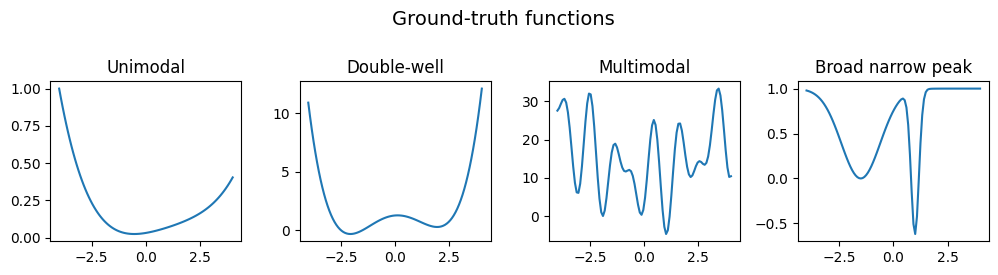

In [ ]:
#ground truth functions
fig, ax = plt.subplots(1,4, figsize=(10, 2.7))

ax[0].plot(x, unimodal(x))
ax[1].plot(x, double_well(x))
ax[2].plot(x, multimodal(x))
ax[3].plot(x, broad_narrow(x))

ax[0].set_title('Unimodal')
ax[1].set_title('Double-well')
ax[2].set_title('Multimodal')
ax[3].set_title('Broad narrow peak')

fig.suptitle('Ground-truth functions', y=1, fontsize=14)

plt.tight_layout()

To emulate noisy measurements, we consider two homoscedastic noise models. The first is a **constant noise** model (trivial case), where the measurement precision is independent of acquisition time. The second is a **decaying noise** model, where the noise decreases exponentially with acquisition time and approaches a maximum achievable precision.

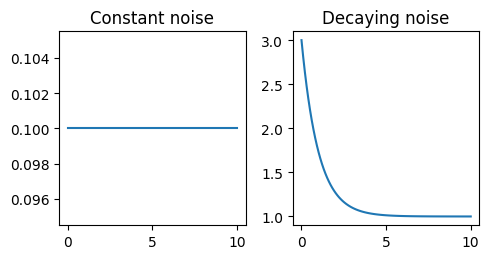

In [ ]:
#homoskedastic noise model

fig, ax = plt.subplots(1,2, figsize=(5, 2.7))

ax[0].plot(t, noise_constant(x, t))
ax[0].set_title('Constant noise')
ax[1].plot(t, noise_decay_floor(x, t))
ax[1].set_title('Decaying noise')

plt.tight_layout()

For those seeking more hardcore challenge, we also suggest a **heteroscedastic noise model**, where the measurement noise depends on the location. In our specific case, the noise level is proportional to the local gradient of the underlying function, while still decaying with acquisition time toward a limiting precision.

Text(0.5, 0.98, 'Heteroskedastic noise model')

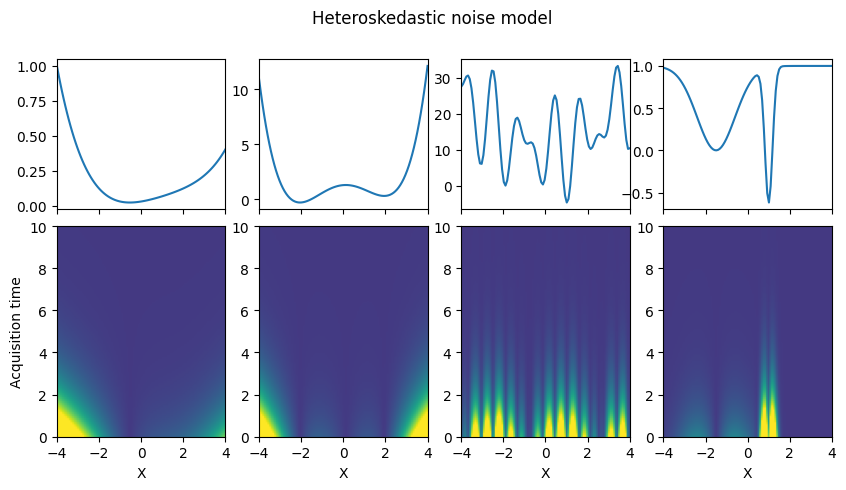

In [ ]:
#@title heteroskedastic noise model

funcs = [unimodal, double_well, multimodal, broad_narrow]

fig, ax = plt.subplots(2, 4, figsize=(10, 5),
                       height_ratios=(1,1.5),
                       sharex=True,
                       #sharey='row',
                       gridspec_kw={'hspace': 0.05})

for i,ax0_ in enumerate(ax[0]):
  ax0_.plot(x, funcs[i](x))

for i,ax1_ in enumerate(ax[1]):
  noise_model = make_heteroskedastic_noise_model(funcs[i], (-4, 4))
  ax1_.imshow(noise_model(x, t.reshape(-1,1)),
              origin='lower',
              extent=[x.min(), x.max(), t.min(), t.max()],
              vmax=.3, vmin=0)
  ax1_.set_xlabel('X')

ax[1,0].set_ylabel('Acquisition time')

fig.suptitle('Heteroskedastic noise model')


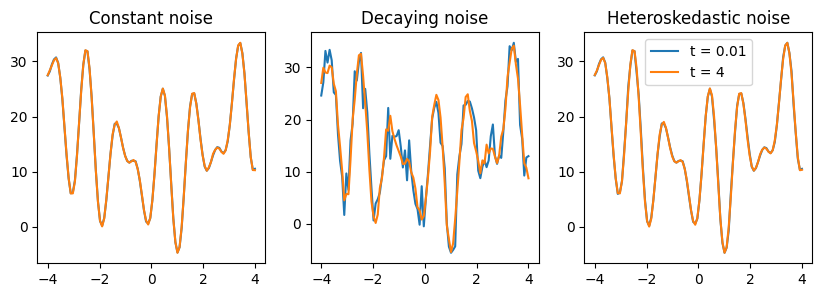

In [ ]:
#@title example: grid measurements with different acqusition time

x = np.linspace(-4,4, 100) #x grid

durations = [0.01, 4] #select durations
model = multimodal #select model [unimodal, double_well, multimodal, broad_narrow]

noise_heter_model = make_heteroskedastic_noise_model(model, (-4, 4))

sim_const = MeasurementSimulator(
    ground_truth_model=model,
    noise_model=noise_constant,
    rng=123,
)

sim_decay = MeasurementSimulator(
    ground_truth_model=model,
    noise_model=noise_decay_floor,
    rng=123,
)

sim_heterosk = MeasurementSimulator(
    ground_truth_model=model,
    noise_model=noise_heter_model,
    rng=123,
)

fig, ax = plt.subplots(1, 3, figsize=(10,3))

for d in durations:
  d_ar = np.ones(len(x))*d
  coords = np.vstack([x, d_ar]).T

  ax[0].plot(coords[:,0], sim_const.measure(coords), label = f't = {d}')
  ax[1].plot(coords[:,0], sim_decay.measure(coords), label = f't = {d}')
  ax[2].plot(coords[:,0], sim_heterosk.measure(coords), label = f't = {d}')

ax[0].set_title('Constant noise')
ax[1].set_title('Decaying noise')
ax[2].set_title('Heteroskedastic noise')
ax[2].legend()

In [ ]:
#@title example: surrogate modeling

#homoskedatic noise model: [noise_constant, noise_decay_floor]
#ground truth models: [unimodal, double_well, multimodal, broad_narrow]


#If we select the heteroskedastic noise model, we first need to construct it. For the homoskedastic cases, the models are already defined.
noise_heter_model = make_heteroskedastic_noise_model(double_well, xlim=(-4, 4)) #please define the x range

meas_sim = MeasurementSimulator(
    ground_truth_model=double_well,
    noise_model=noise_heter_model,
    rng=123,
)

In [ ]:

#define x_grid on the explored interval

x_grid = np.linspace(-4, 4, 500)

# For this example, select 4 random locations in the range (-4, 4)
x = np.random.random(7) * 8 - 4

# Set acquisition time (t = 3) for all locations
t = np.ones(len(x)) * 1

# Form the coordinate array: [[x1, t1], [x2, t2], ...]
coords = np.column_stack([x, t])

#make "measurements"
y = meas_sim.measure(coords)

#surrogate modeling
mean, std = gp_predict(x, y, x_grid, training_iter=100, lr=0.1)

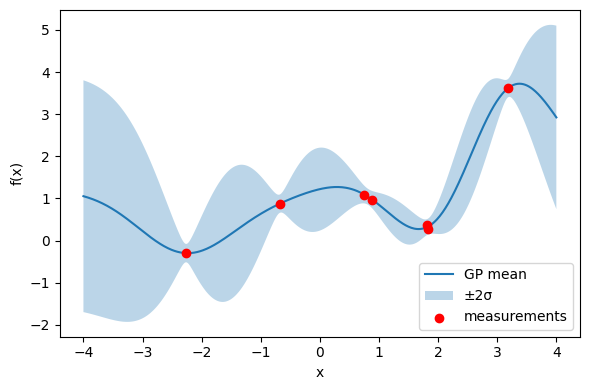

In [ ]:
plt.figure(figsize=(6, 4))

# GP mean
plt.plot(x_grid, mean, label="GP mean")

# uncertainty band
plt.fill_between(
  x_grid,
  mean - 2 * std,
  mean + 2 * std,
  alpha=0.3,
  label="±2σ"
)

# training points
plt.scatter(x, y, color="red", zorder=3, label="measurements")

plt.xlabel("x")
plt.ylabel("f(x)")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# =========================================================
# helper plotting function
# =========================================================
def plot_models(gp, sigma_fn, x_data, y_data, tau_data,
                x_min, x_max, tau_min, tau_max, step_id):

    fig, ax = plt.subplots(1, 2, figsize=(10, 3.5))

    # -----------------------------------------------------
    # 1. Functional dependence: GP mean and uncertainty
    # -----------------------------------------------------
    x_plot = np.linspace(x_min, x_max, 300)
    mean, std = gp.predict(x_plot.reshape(-1, 1), return_std=True)

    ax[0].plot(x_plot, mean, label='GP mean')
    ax[0].fill_between(x_plot, mean - std, mean + std, alpha=0.25, label='GP std')
    ax[0].scatter(x_data, y_data, s=30, zorder=3, label='measurements')
    ax[0].set_xlabel('x')
    ax[0].set_ylabel('y')
    ax[0].set_title(f'Functional dependence, step {step_id}')
    ax[0].legend()

    # -----------------------------------------------------
    # 2. Noise model sigma(tau)
    # -----------------------------------------------------
    tau_plot = np.linspace(tau_min, tau_max, 300)
    sigma_plot = sigma_fn(tau_plot)

    ax[1].plot(tau_plot, sigma_plot, label=r'$\sigma(\tau)$')

    # empirical noise estimates from repeated measurements
    tau_unique = np.unique(tau_data)
    tau_rep = []
    sigma_rep = []

    for tau in tau_unique:
        yy = y_data[tau_data == tau]
        if len(yy) >= 2:
            tau_rep.append(tau)
            sigma_rep.append(np.std(yy, ddof=1))

    if len(tau_rep) > 0:
        ax[1].scatter(tau_rep, sigma_rep, s=40, zorder=3, label='empirical std')

    ax[1].set_xlabel(r'Acquisition time $\tau$')
    ax[1].set_ylabel(r'Noise level $\sigma$')
    ax[1].set_title(f'Noise model, step {step_id}')
    ax[1].legend()

    plt.tight_layout()
    plt.show()

For simplicity, we treat time as the cost function. The cost of a single measurement is therefore equal to its acquisition time. In addition, we introduce a travel cost, which accounts for moving between measurement locations and is assumed to be proportional to the distance between them.

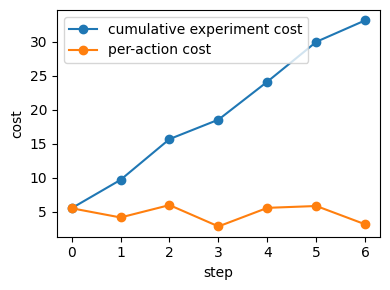

In [ ]:
#@title total experiment cost

# initial position
x0 = 0

# displacement between consecutive points (including first move from x0)
dx = x - np.append(x0, x[:-1])

# cost of each action = travel cost + acquisition time
action_costs = travel_cost(dx) + t

# visualize costs
fig = plt.figure(figsize=(4,3))
plt.plot(np.cumsum(action_costs), 'o-', label='cumulative experiment cost')
plt.plot(action_costs, 'o-', label='per-action cost')

plt.xlabel('step')
plt.ylabel('cost')
plt.legend()
plt.tight_layout()


In [ ]:
def action_cost(x_current, x_next, tau):
    travel = abs(x_next - x_current)
    return travel_cost(travel) + tau

In [ ]:
import numpy as np

import numpy as np

def fit_noise_surrogate(tau_data, y_data, x_data, tau_tol=0.2, min_repeats=2):
    """
    Fit a simple noise model sigma(tau) = a/sqrt(tau) + b
    from measurements with similar tau values.

    Parameters
    ----------
    tau_data : array
        Acquisition times.
    y_data : array
        Measured values.
    x_data : array
        Spatial positions (kept for compatibility, not used here).
    tau_tol : float
        Tau values within +/- tau_tol are grouped together.
    min_repeats : int
        Minimum number of points in a tau neighborhood to estimate std.

    Returns
    -------
    sigma_fn : callable
        Predicted noise std as a function of tau.
    tau_rep : array
        Representative tau values.
    sigma_rep : array
        Empirical std values.
    """
    tau_data = np.asarray(tau_data, dtype=float)
    y_data = np.asarray(y_data, dtype=float)

    tau_rep = []
    sigma_rep = []

    # use each unique tau as a center, then merge nearby values
    tau_centers = np.unique(tau_data)

    for tau0 in tau_centers:
        mask = np.abs(tau_data - tau0) <= tau_tol
        yy = y_data[mask]
        tt = tau_data[mask]

        if len(yy) >= min_repeats:
            tau_rep.append(np.mean(tt))
            sigma_rep.append(np.std(yy, ddof=1))

    tau_rep = np.asarray(tau_rep, dtype=float)
    sigma_rep = np.asarray(sigma_rep, dtype=float)

    # remove near-duplicate tau_rep entries
    if len(tau_rep) > 1:
        order = np.argsort(tau_rep)
        tau_rep = tau_rep[order]
        sigma_rep = sigma_rep[order]

        tau_rep_clean = [tau_rep[0]]
        sigma_rep_clean = [sigma_rep[0]]

        for i in range(1, len(tau_rep)):
            if np.abs(tau_rep[i] - tau_rep_clean[-1]) > tau_tol:
                tau_rep_clean.append(tau_rep[i])
                sigma_rep_clean.append(sigma_rep[i])

        tau_rep = np.array(tau_rep_clean)
        sigma_rep = np.array(sigma_rep_clean)

    # fallback if not enough information
    if len(tau_rep) < 2:
        def sigma_fn(tau):
            tau = np.asarray(tau, dtype=float)
            return 0.2 / np.sqrt(np.maximum(tau, 1e-8)) + 0.05
        return sigma_fn, tau_rep, sigma_rep

    # fit sigma(tau) = a / sqrt(tau) + b
    A = np.column_stack([
        1 / np.sqrt(np.maximum(tau_rep, 1e-8)),
        np.ones_like(tau_rep)
    ])
    coeff, _, _, _ = np.linalg.lstsq(A, sigma_rep, rcond=None)
    a, b = coeff

    a = max(a, 0.0)
    b = max(b, 1e-6)

    def sigma_fn(tau):
        tau = np.asarray(tau, dtype=float)
        return a / np.sqrt(np.maximum(tau, 1e-8)) + b

    return sigma_fn, tau_rep, sigma_rep


In [ ]:
import numpy as np

def sample_candidate_states(
    x_current,
    B_remain,
    x_min, x_max,
    tau_min, tau_max,
    n_mc=200
):
    """
    Monte Carlo sample of feasible next states/actions.

    Returns
    -------
    states : dict of arrays
        x_next        : sampled next positions
        tau_next      : sampled acquisition times
        travel_cost   : movement cost
        step_cost     : travel + acquisition
        B_after       : remaining budget after the step
    """
    # sample uniformly
    x_next = np.random.uniform(x_min, x_max, n_mc)
    tau_next = np.random.uniform(tau_min, tau_max, n_mc)

    # costs
    travel_cost = np.abs(x_next - x_current)
    step_cost = action
    B_after = B_remain - step_cost

    # keep only feasible states
    mask = B_after >= 0

    states = {
        "x_next": x_next[mask],
        "tau_next": tau_next[mask],
        "travel_cost": travel_cost[mask],
        "step_cost": step_cost[mask],
        "B_after": B_after[mask],
    }

    return states

In [ ]:
import numpy as np

def sample_candidate_states(
    x_current,
    B_remain,
    x_min, x_max,
    tau_min, tau_max,
    n_mc=200
):
    """
    Monte Carlo sample of feasible next states/actions.

    Returns
    -------
    states : dict of arrays
        x_next        : sampled next positions
        tau_next      : sampled acquisition times
        travel_cost   : movement cost
        step_cost     : travel + acquisition
        B_after       : remaining budget after the step
    """
    # sample uniformly
    x_next = np.random.uniform(x_min, x_max, n_mc)
    tau_next = np.random.uniform(tau_min, tau_max, n_mc)

    # costs
    travel_cost = np.abs(x_next - x_current)
    step_cost = travel_cost + tau_next
    B_after = B_remain - step_cost

    # keep only feasible states
    mask = B_after >= 0

    states = {
        "x_next": x_next[mask],
        "tau_next": tau_next[mask],
        "travel_cost": travel_cost[mask],
        "step_cost": step_cost[mask],
        "B_after": B_after[mask],
    }

    return states

In [ ]:
import numpy as np

# =========================================================
# helpers
# =========================================================
def sample_candidate_states(
    x_current,
    B_remain,
    x_min, x_max,
    tau_min, tau_max,
    n_mc=100
):
    x_next = np.random.uniform(x_min, x_max, n_mc)
    tau_next = np.random.uniform(tau_min, tau_max, n_mc)

    travel_cost = np.abs(x_next - x_current)
    step_cost = travel_cost + tau_next
    B_after = B_remain - step_cost

    mask = B_after >= 0

    return {
        "x_next": x_next[mask],
        "tau_next": tau_next[mask],
        "travel_cost": travel_cost[mask],
        "step_cost": step_cost[mask],
        "B_after": B_after[mask],
    }


def nearest_distance_to_data(values, values_data):
    values = np.asarray(values)
    values_data = np.asarray(values_data)

    if len(values_data) == 0:
        return np.ones_like(values)

    d = np.abs(values[:, None] - values_data[None, :])
    return np.min(d, axis=1)


def predict_gp_on_candidates(gp_predict, x_data, y_data, x_candidates,
                             training_iter=100, lr=0.1):
    mean, std = gp_predict(
        x_train=x_data,
        y_train=y_data,
        x_test=x_candidates,
        training_iter=training_iter,
        lr=lr
    )
    return mean, std


# =========================================================
# immediate reward
# =========================================================
def immediate_reward(
    x_next,
    tau_next,
    step_cost,
    x_data,
    tau_data,
    gp_std,
    sigma_fn,
    lam_cost=0.2,
    w_signal=1.0,
    w_noise=0.5,
    eps=1e-8
):
    """
    Reward = signal learning + noise learning - cost

    signal learning:
        prefer uncertain x, but discount by expected noise

    noise learning:
        prefer tau values that are still poorly covered
    """
    sigma = sigma_fn(tau_next)

    # reward for learning f(x)
    r_signal = gp_std / (sigma + eps)

    # reward for learning noise model:
    # if tau is far from what we already measured, bonus is larger
    tau_novelty = nearest_distance_to_data(np.atleast_1d(tau_next), tau_data)
    tau_novelty = tau_novelty[0] if np.ndim(tau_next) == 0 else tau_novelty

    r_noise = tau_novelty / (tau_max - tau_min + eps)

    reward = w_signal * r_signal + w_noise * r_noise - lam_cost * step_cost
    return reward


# =========================================================
# approximate uncertainty update after a virtual measurement
# =========================================================
def attenuation_factor(x_query, x_meas, tau_meas, sigma_fn,
                       x_length=0.8, k_signal=0.6, eps=1e-8):
    """
    Approximate reduction of GP std after measuring at x_meas.
    Stronger attenuation for:
      - closer x_query to x_meas
      - lower expected measurement noise
    """
    sigma = sigma_fn(tau_meas)
    quality = 1.0 / (sigma + eps)

    local = np.exp(-0.5 * ((x_query - x_meas) / x_length) ** 2)
    atten = 1.0 - k_signal * quality * local
    atten = np.clip(atten, 0.2, 1.0)   # avoid negative/unstable values
    return atten


def future_noise_bonus_scale(tau_query, tau_meas, tau_range, k_noise=0.7):
    """
    After virtually measuring at tau_meas, future noise-learning value near tau_meas
    should decrease.
    """
    local = np.exp(-0.5 * ((tau_query - tau_meas) / (0.2 * tau_range + 1e-8)) ** 2)
    scale = 1.0 - k_noise * local
    return np.clip(scale, 0.2, 1.0)


# =========================================================
# rollout value
# =========================================================
def rollout_value(
    x_current,
    B_remain,
    x_data,
    tau_data,
    y_data,
    sigma_fn,
    gp_predict,
    x_min, x_max,
    tau_min, tau_max,
    depth=3,
    n_mc=60,
    gamma=0.9,
    training_iter=100,
    lr=0.1,
    lam_cost=0.2,
    w_signal=1.0,
    w_noise=0.5,
    virtual_actions=None
):
    """
    Non-myopic rollout with approximate updates.

    virtual_actions stores already simulated future measurements:
        [(x1, tau1), (x2, tau2), ...]
    """
    if depth == 0 or B_remain <= tau_min:
        return 0.0

    if virtual_actions is None:
        virtual_actions = []

    states = sample_candidate_states(
        x_current=x_current,
        B_remain=B_remain,
        x_min=x_min, x_max=x_max,
        tau_min=tau_min, tau_max=tau_max,
        n_mc=n_mc
    )

    if len(states["x_next"]) == 0:
        return 0.0

    # current GP prediction at candidates
    _, gp_std = predict_gp_on_candidates(
        gp_predict=gp_predict,
        x_data=x_data,
        y_data=y_data,
        x_candidates=states["x_next"],
        training_iter=training_iter,
        lr=lr
    )

    # apply approximate attenuation from already simulated future actions
    if len(virtual_actions) > 0:
        for x_meas, tau_meas in virtual_actions:
            gp_std = gp_std * attenuation_factor(
                x_query=states["x_next"],
                x_meas=x_meas,
                tau_meas=tau_meas,
                sigma_fn=sigma_fn
            )

    tau_range = tau_max - tau_min + 1e-8

    best_total = -np.inf

    for i in range(len(states["x_next"])):
        x_next = states["x_next"][i]
        tau_next = states["tau_next"][i]
        step_cost = states["step_cost"][i]
        B_after = states["B_after"][i]

        # immediate reward
        r_now = immediate_reward(
            x_next=x_next,
            tau_next=tau_next,
            step_cost=step_cost,
            x_data=x_data,
            tau_data=tau_data,
            gp_std=gp_std[i],
            sigma_fn=sigma_fn,
            lam_cost=lam_cost,
            w_signal=w_signal,
            w_noise=w_noise
        )

        # approximate future rollout
        r_future = rollout_value(
            x_current=x_next,
            B_remain=B_after,
            x_data=x_data,
            tau_data=np.append(tau_data, tau_next),   # noise model knowledge improves
            y_data=y_data,                            # keep y_data unchanged in approximate rollout
            sigma_fn=sigma_fn,
            gp_predict=gp_predict,
            x_min=x_min, x_max=x_max,
            tau_min=tau_min, tau_max=tau_max,
            depth=depth - 1,
            n_mc=n_mc,
            gamma=gamma,
            training_iter=training_iter,
            lr=lr,
            lam_cost=lam_cost,
            w_signal=w_signal,
            w_noise=w_noise,
            virtual_actions=virtual_actions + [(x_next, tau_next)]
        )

        total = r_now + gamma * r_future

        if total > best_total:
            best_total = total

    return best_total


# =========================================================
# choose next action by rollout
# =========================================================
def select_action_rollout(
    x_current,
    B_remain,
    x_data,
    tau_data,
    y_data,
    sigma_fn,
    gp_predict,
    x_min, x_max,
    tau_min, tau_max,
    depth=3,
    n_mc_root=120,
    n_mc_roll=60,
    gamma=0.9,
    training_iter=100,
    lr=0.1,
    lam_cost=0.2,
    w_signal=1.0,
    w_noise=0.5
):
    """
    Sample root actions, score each with multi-step rollout, return best.
    """
    states = sample_candidate_states(
        x_current=x_current,
        B_remain=B_remain,
        x_min=x_min, x_max=x_max,
        tau_min=tau_min, tau_max=tau_max,
        n_mc=n_mc_root
    )

    if len(states["x_next"]) == 0:
        return None, None, None

    _, gp_std = predict_gp_on_candidates(
        gp_predict=gp_predict,
        x_data=x_data,
        y_data=y_data,
        x_candidates=states["x_next"],
        training_iter=training_iter,
        lr=lr
    )

    scores = np.zeros(len(states["x_next"]))

    for i in range(len(states["x_next"])):
        x_next = states["x_next"][i]
        tau_next = states["tau_next"][i]
        step_cost = states["step_cost"][i]
        B_after = states["B_after"][i]

        r_now = immediate_reward(
            x_next=x_next,
            tau_next=tau_next,
            step_cost=step_cost,
            x_data=x_data,
            tau_data=tau_data,
            gp_std=gp_std[i],
            sigma_fn=sigma_fn,
            lam_cost=lam_cost,
            w_signal=w_signal,
            w_noise=w_noise
        )

        r_future = rollout_value(
            x_current=x_next,
            B_remain=B_after,
            x_data=x_data,
            tau_data=np.append(tau_data, tau_next),
            y_data=y_data,
            sigma_fn=sigma_fn,
            gp_predict=gp_predict,
            x_min=x_min, x_max=x_max,
            tau_min=tau_min, tau_max=tau_max,
            depth=depth - 1,
            n_mc=n_mc_roll,
            gamma=gamma,
            training_iter=training_iter,
            lr=lr,
            lam_cost=lam_cost,
            w_signal=w_signal,
            w_noise=w_noise,
            virtual_actions=[(x_next, tau_next)]
        )

        scores[i] = r_now + gamma * r_future

    i_best = np.argmax(scores)

    best_action = (
        states["x_next"][i_best],
        states["tau_next"][i_best]
    )

    diagnostics = {
        "x_next": states["x_next"],
        "tau_next": states["tau_next"],
        "step_cost": states["step_cost"],
        "B_after": states["B_after"],
        "score": scores
    }

    return best_action, scores[i_best], diagnostics

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# helper: plot current state
# =========================================================
def plot_campaign_state(
    step_id,
    B_total,
    B_remain,
    x_data,
    tau_data,
    y_data,
    sigma_fn,
    gp_predict,
    x_min, x_max,
    tau_min, tau_max,
    training_iter=100,
    lr=0.1,
    best_action=None
):
    fig, ax = plt.subplots(1, 3, figsize=(14, 3.8))

    # -----------------------------------------------------
    # 1. Remaining budget
    # -----------------------------------------------------
    used = B_total - B_remain
    ax[0].bar([0], [used], label='used')
    ax[0].bar([0], [B_remain], bottom=[used], label='remaining')
    ax[0].set_ylim(0, B_total)
    ax[0].set_xticks([0])
    ax[0].set_xticklabels(['budget'])
    ax[0].set_ylabel('budget')
    ax[0].set_title(f'Step {step_id}: budget')
    ax[0].legend()

    # -----------------------------------------------------
    # 2. GP prediction of f(x)
    # -----------------------------------------------------
    x_plot = np.linspace(x_min, x_max, 300)
    y_mean, y_std = gp_predict(
        x_train=x_data,
        y_train=y_data,
        x_test=x_plot,
        training_iter=training_iter,
        lr=lr
    )

    ax[1].plot(x_plot, y_mean, label='GP mean')
    ax[1].fill_between(x_plot, y_mean - y_std, y_mean + y_std, alpha=0.25, label='GP std')
    ax[1].scatter(x_data, y_data, s=35, zorder=3, label='measured')

    if best_action is not None:
        ax[1].axvline(best_action[0], ls='--', alpha=0.8, label='next x')

    ax[1].set_xlabel('x')
    ax[1].set_ylabel('y')
    ax[1].set_title('Functional dependence')
    ax[1].legend()

    # -----------------------------------------------------
    # 3. Noise model prediction
    # -----------------------------------------------------
    tau_plot = np.linspace(tau_min, tau_max, 300)
    sigma_plot = sigma_fn(tau_plot)
    ax[2].plot(tau_plot, sigma_plot, label='noise surrogate')

    # empirical std from repeats at same (x, tau)
    tau_rep = []
    sigma_rep = []
    pairs = np.unique(np.column_stack([x_data, tau_data]), axis=0)

    for x0, tau0 in pairs:
        mask = np.isclose(x_data, x0) & np.isclose(tau_data, tau0)
        yy = y_data[mask]
        if len(yy) >= 2:
            tau_rep.append(tau0)
            sigma_rep.append(np.std(yy, ddof=1))

    if len(tau_rep) > 0:
        ax[2].scatter(tau_rep, sigma_rep, s=40, zorder=3, label='empirical std')

    if best_action is not None:
        ax[2].axvline(best_action[1], ls='--', alpha=0.8, label='next tau')

    ax[2].set_xlabel('tau')
    ax[2].set_ylabel('sigma')
    ax[2].set_title('Noise model')
    ax[2].legend()

    plt.tight_layout()
    plt.show()






---


## Lets go!
---



Design a strategy that selects where to measure, in what order, and for how long, using the provided simulator and a fixed total budget. The objective is to explore or optimize the underlying function as efficiently as possible under noisy measurements and movement cost.

In [ ]:
import numpy as np

B_total = 200 #your budget

meas_sim = MeasurementSimulator(
    ground_truth_model=multimodal, #choose gt function
    noise_model=noise_decay_floor,  #choose noise model
    rng=123,
)

# =========================================================
# 1. Experimental limits
# =========================================================
x_min, x_max = -4.0, 4.0          # spatial / compositional range
tau_min, tau_max = 0.01, 5.0       # acquisition-time range

# dense grid for prediction
x_plot = np.linspace(-4, 4, 300)

# =========================================================
# 2. Total available budget
# =========================================================
#B_total = 30.0                    # total budget for the whole campaign

# =========================================================
# 3. Seed design
#    initial x points and initial acquisition times
# =========================================================
x_seed = np.array([-3.0, 0.0, 3.0])
tau_seed = np.array([0.01, 2.0])

# =========================================================
# 4. Number of repeats for each (x, tau)
# =========================================================
n_rep = 3

In [ ]:
# =========================================================
# 5. Seed measurements
# =========================================================
# Assumes:
#   - meas_sim.measure(...) already exists
#   - x_min, x_max, tau_min, tau_max
#   - B_total
#   - x_seed, tau_seed
#   - n_rep
# are already defined

x_data, tau_data, y_data = [], [], []

B_remain = B_total
spent = 0.0

# optional: starting position
x_current = x_seed[0]

for x in x_seed:
    for tau in tau_seed:
        for rep in range(n_rep):

            # travel cost only for the first visit to a new x in this loop
            travel = abs(x - x_current) if (rep == 0 and tau == tau_seed[0]) else 0.0
            step_cost = travel + tau

            if step_cost > B_remain:
                print(f"Stop: not enough budget for x={x:.3f}, tau={tau:.3f}")
                break

            # make measurement
            y = meas_sim.measure(np.array([[x, tau]]))[0]

            # save data
            x_data.append(x)
            tau_data.append(tau)
            y_data.append(y)

            # update budget and position
            spent += step_cost
            B_remain -= step_cost
            x_current = x

            print(
                f"x={x:.3f}, tau={tau:.3f}, rep={rep+1}, "
                f"y={y:.4f}, cost={step_cost:.3f}, B_remain={B_remain:.3f}"
            )

        if step_cost > B_remain:
            break

# convert to arrays
x_data = np.array(x_data, dtype=float)
tau_data = np.array(tau_data, dtype=float)
y_data = np.array(y_data, dtype=float)

print("\nFinished seed measurements")
print("Total measurements:", len(y_data))
print("Budget spent      :", spent)
print("Budget remaining  :", B_remain)

x=-3.000, tau=0.010, rep=1, y=3.7623, cost=0.010, B_remain=199.990
x=-3.000, tau=0.010, rep=2, y=5.6139, cost=0.010, B_remain=199.980
x=-3.000, tau=0.010, rep=3, y=10.5481, cost=0.010, B_remain=199.970
x=-3.000, tau=2.000, rep=1, y=6.9564, cost=2.000, B_remain=197.970
x=-3.000, tau=2.000, rep=2, y=7.8792, cost=2.000, B_remain=195.970
x=-3.000, tau=2.000, rep=3, y=7.4432, cost=2.000, B_remain=193.970
x=0.000, tau=0.010, rep=1, y=1.1033, cost=3.010, B_remain=190.960
x=0.000, tau=0.010, rep=2, y=4.6151, cost=0.010, B_remain=190.950
x=0.000, tau=0.010, rep=3, y=2.0565, cost=0.010, B_remain=190.940
x=0.000, tau=2.000, rep=1, y=2.5903, cost=2.000, B_remain=188.940
x=0.000, tau=2.000, rep=2, y=3.1235, cost=2.000, B_remain=186.940
x=0.000, tau=2.000, rep=3, y=1.0610, cost=2.000, B_remain=184.940
x=3.000, tau=0.010, rep=1, y=20.8428, cost=3.010, B_remain=181.930
x=3.000, tau=0.010, rep=2, y=15.2902, cost=0.010, B_remain=181.920
x=3.000, tau=0.010, rep=3, y=20.2710, cost=0.010, B_remain=181.910


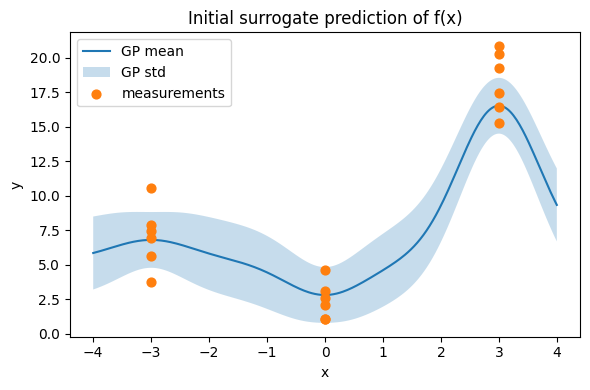

In [ ]:
# =========================================================
# 6. Predict functional dependence f(x)
# =========================================================
import numpy as np
import matplotlib.pyplot as plt

# dense grid for prediction
x_plot = np.linspace(x_min, x_max, 300)

# GP prediction using your function
y_mean, y_std = gp_predict(
    x_train=x_data,
    y_train=y_data,
    x_test=x_plot,
    training_iter=100,
    lr=0.1
)

# plot
plt.figure(figsize=(6, 4))
plt.plot(x_plot, y_mean, label='GP mean')
plt.fill_between(x_plot, y_mean - y_std, y_mean + y_std, alpha=0.25, label='GP std')
plt.scatter(x_data, y_data, s=40, zorder=3, label='measurements')

plt.xlabel('x')
plt.ylabel('y')
plt.title('Initial surrogate prediction of f(x)')
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
sigma_fn, tau_rep, sigma_rep = fit_noise_surrogate(
    tau_data=tau_data,
    y_data=y_data,
    x_data=x_data
)

tau_plot = np.linspace(tau_min, tau_max, 200)
sigma_plot = sigma_fn(tau_plot)

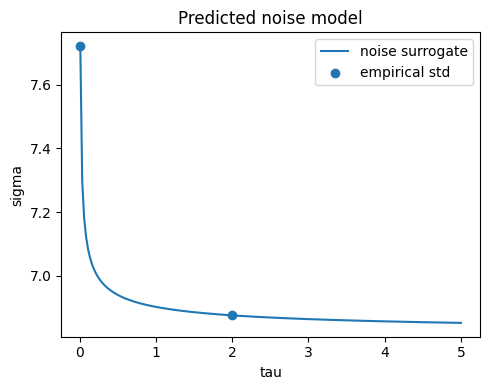

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(5, 4))
plt.plot(tau_plot, sigma_plot, label='noise surrogate')
if len(tau_rep) > 0:
    plt.scatter(tau_rep, sigma_rep, zorder=3, label='empirical std')
plt.xlabel('tau')
plt.ylabel('sigma')
plt.title('Predicted noise model')
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
states = sample_candidate_states(
    x_current=x_current,
    B_remain=B_remain,
    x_min=x_min, x_max=x_max,
    tau_min=tau_min, tau_max=tau_max,
    n_mc=300
)

print("Number of feasible sampled states:", len(states["x_next"]))
print("First 5 candidates:")
for i in range(min(5, len(states["x_next"]))):
    print(
        f"x={states['x_next'][i]:.3f}, "
        f"tau={states['tau_next'][i]:.3f}, "
        f"cost={states['step_cost'][i]:.3f}, "
        f"B_after={states['B_after'][i]:.3f}"
    )

Number of feasible sampled states: 300
First 5 candidates:
x=-3.236, tau=2.450, cost=8.686, B_after=167.224
x=-1.535, tau=0.277, cost=4.812, B_after=171.098
x=2.574, tau=2.959, cost=3.385, B_after=172.525
x=0.588, tau=1.655, cost=4.067, B_after=171.843
x=2.038, tau=1.431, cost=2.393, B_after=173.517


In [ ]:
# best_action, best_score, diag = select_action_rollout(
#     x_current=x_current,
#     B_remain=B_remain,
#     x_data=x_data,
#     tau_data=tau_data,
#     y_data=y_data,
#     sigma_fn=sigma_fn,
#     gp_predict=gp_predict,
#     x_min=x_min, x_max=x_max,
#     tau_min=tau_min, tau_max=tau_max,
#     depth=3,          # 2-3 step forward lookahead
#     n_mc_root=10,
#     n_mc_roll=10,
#     gamma=0.9,
#     training_iter=100,
#     lr=0.1,
#     lam_cost=0.2,
#     w_signal=1.0,
#     w_noise=0.6
# )

# print("Best action:", best_action)
# print("Best rollout score:", best_score)


STEP 0
Current position : 3.000
Remaining budget : 175.910
Best action      : x=-0.699, tau=0.052
Step cost        : 3.750
Rollout score    : -0.1397


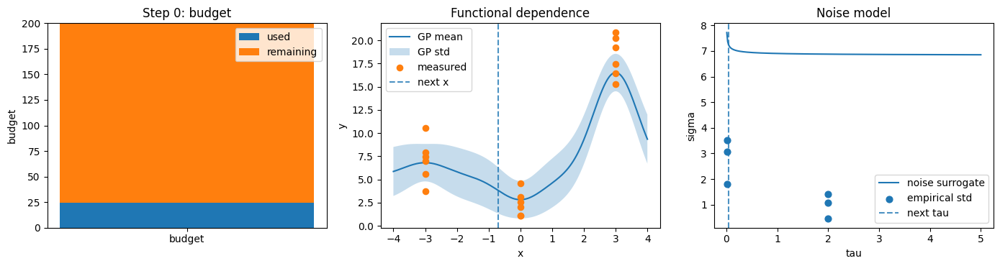

Measured y       : 11.1849

STEP 1
Current position : -0.699
Remaining budget : 172.160
Best action      : x=-0.205, tau=0.248
Step cost        : 0.741
Rollout score    : 0.3043


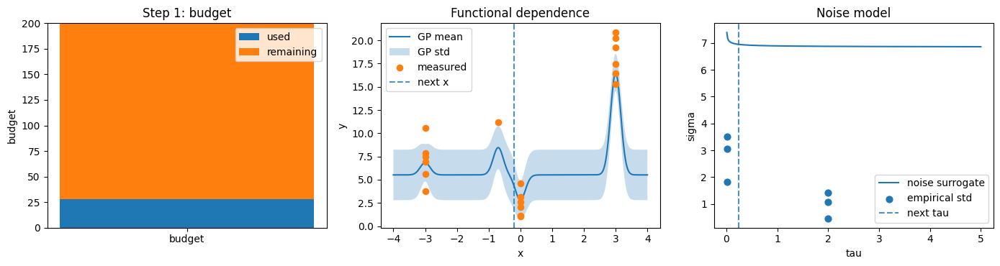

Measured y       : 1.8992

STEP 2
Current position : -0.205
Remaining budget : 171.418
Best action      : x=1.139, tau=0.341
Step cost        : 1.686
Rollout score    : 0.4594


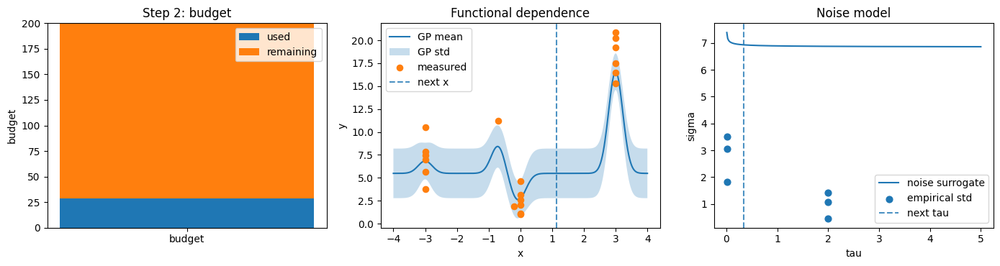

Measured y       : -7.1270

STEP 3
Current position : 1.139
Remaining budget : 169.733
Best action      : x=0.853, tau=3.063
Step cost        : 3.349
Rollout score    : 0.0122


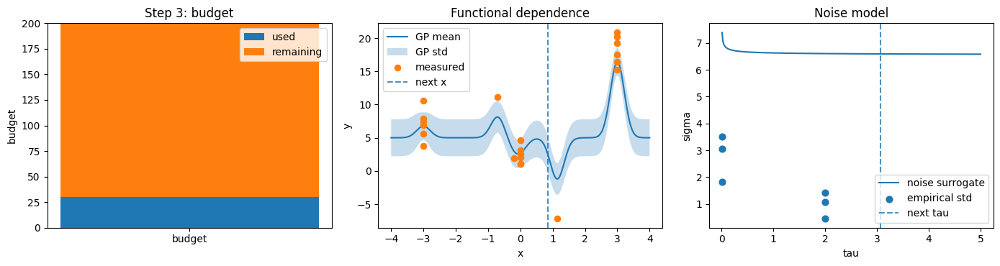

Measured y       : 2.2664

STEP 4
Current position : 0.853
Remaining budget : 166.383
Best action      : x=3.282, tau=0.661
Step cost        : 3.091
Rollout score    : 0.1107


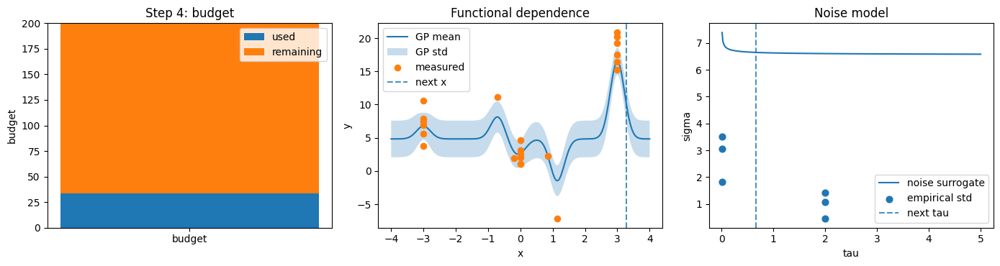

Measured y       : 33.9157

STEP 5
Current position : 3.282
Remaining budget : 163.292
Best action      : x=-0.573, tau=0.047
Step cost        : 3.902
Rollout score    : -0.2146


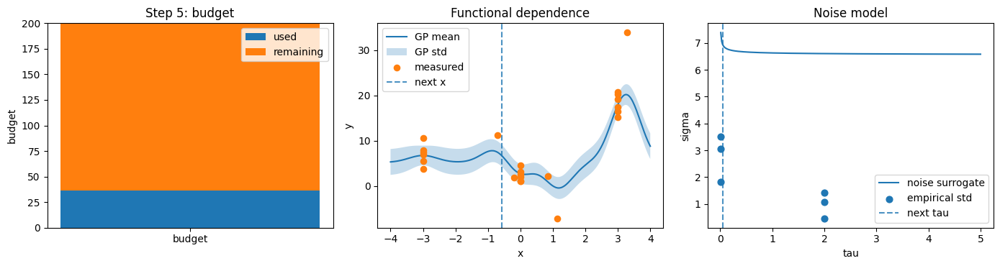

Measured y       : 14.6460

STEP 6
Current position : -0.573
Remaining budget : 159.390
Best action      : x=0.980, tau=0.473
Step cost        : 2.027
Rollout score    : 0.0113


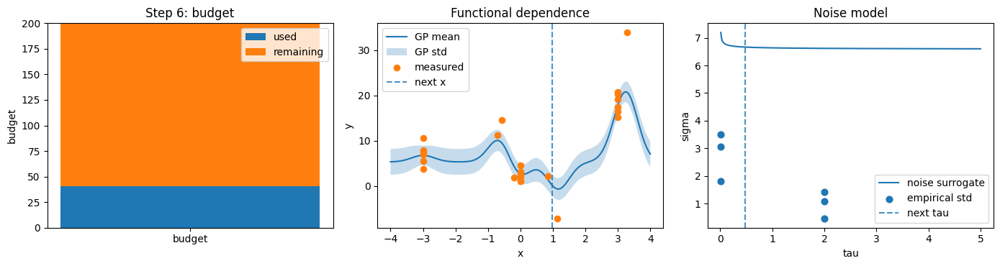

Measured y       : -2.5799

STEP 7
Current position : 0.980
Remaining budget : 157.363
Best action      : x=-1.471, tau=0.662
Step cost        : 3.113
Rollout score    : -0.5678


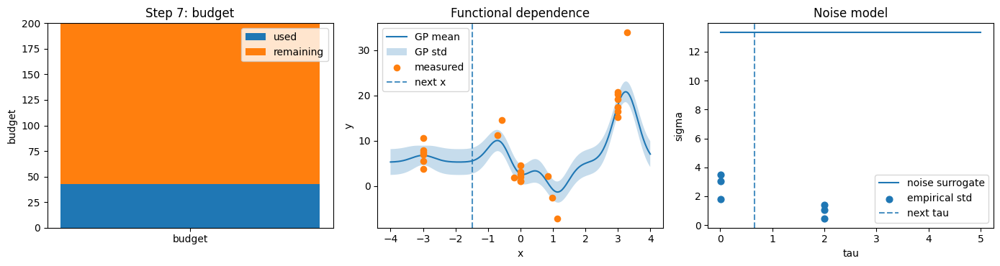

Measured y       : 17.0860


KeyboardInterrupt: 

In [ ]:
# =========================================================
# active rollout campaign
# =========================================================
history = []
step_id = 0

while B_remain > tau_min:

    # ---------------------------------------------
    # fit / update noise model from current data
    # ---------------------------------------------
    sigma_fn, tau_rep, sigma_rep = fit_noise_surrogate(
        tau_data=tau_data,
        y_data=y_data,
        x_data=x_data
    )

    # ---------------------------------------------
    # choose next action by rollout
    # ---------------------------------------------
    best_action, best_score, diag = select_action_rollout(
        x_current=x_current,
        B_remain=B_remain,
        x_data=x_data,
        tau_data=tau_data,
        y_data=y_data,
        sigma_fn=sigma_fn,
        gp_predict=gp_predict,
        x_min=x_min, x_max=x_max,
        tau_min=tau_min, tau_max=tau_max,
        depth=3,
        n_mc_root=10,
        n_mc_roll=10,
        gamma=0.9,
        training_iter=100,
        lr=0.1,
        lam_cost=0.2,
        w_signal=1.0,
        w_noise=0.6
    )

    # ---------------------------------------------
    # stop if no feasible action
    # ---------------------------------------------
    if best_action is None:
        print("No feasible action found. Stopping.")
        break

    x_next, tau_next = best_action
    step_cost = abs(x_next - x_current) + tau_next

    if step_cost > B_remain:
        print("Selected action exceeds remaining budget. Stopping.")
        break

    # ---------------------------------------------
    # visualize current state before measurement
    # ---------------------------------------------
    print("\n" + "="*60)
    print(f"STEP {step_id}")
    print("="*60)
    print(f"Current position : {x_current:.3f}")
    print(f"Remaining budget : {B_remain:.3f}")
    print(f"Best action      : x={x_next:.3f}, tau={tau_next:.3f}")
    print(f"Step cost        : {step_cost:.3f}")
    print(f"Rollout score    : {best_score:.4f}")

    plot_campaign_state(
        step_id=step_id,
        B_total=B_total,
        B_remain=B_remain,
        x_data=x_data,
        tau_data=tau_data,
        y_data=y_data,
        sigma_fn=sigma_fn,
        gp_predict=gp_predict,
        x_min=x_min, x_max=x_max,
        tau_min=tau_min, tau_max=tau_max,
        training_iter=100,
        lr=0.1,
        best_action=best_action
    )

    # ---------------------------------------------
    # make measurement
    # ---------------------------------------------
    y_next = meas_sim.measure(np.array([[x_next, tau_next]]))[0]

    print(f"Measured y       : {y_next:.4f}")

    # ---------------------------------------------
    # update data and state
    # ---------------------------------------------
    x_data = np.append(x_data, x_next)
    tau_data = np.append(tau_data, tau_next)
    y_data = np.append(y_data, y_next)

    B_remain -= step_cost
    x_current = x_next

    history.append({
        "step": step_id,
        "x": x_next,
        "tau": tau_next,
        "y": y_next,
        "cost": step_cost,
        "budget_left": B_remain,
        "score": best_score
    })

    step_id += 1

    # optional stop if almost no budget
    if B_remain <= tau_min:
        break


# =========================================================
# final state visualization
# =========================================================
sigma_fn, tau_rep, sigma_rep = fit_noise_surrogate(
    tau_data=tau_data,
    y_data=y_data,
    x_data=x_data
)

print("\n" + "="*60)
print("CAMPAIGN FINISHED")
print("="*60)
print(f"Total measurements : {len(y_data)}")
print(f"Remaining budget   : {B_remain:.3f}")

plot_campaign_state(
    step_id=step_id,
    B_total=B_total,
    B_remain=B_remain,
    x_data=x_data,
    tau_data=tau_data,
    y_data=y_data,
    sigma_fn=sigma_fn,
    gp_predict=gp_predict,
    x_min=x_min, x_max=x_max,
    tau_min=tau_min, tau_max=tau_max,
    training_iter=30,
    lr=0.1,
    best_action=None
)

In [ ]:
import numpy as np

def fit_noise_surrogate_from_residuals(
    x_data,
    tau_data,
    y_data,
    gp_predict,
    tau_tol=0.15,
    min_repeats=3,
    training_iter=100,
    lr=0.1
):
    """
    Fit sigma(tau) = a / sqrt(tau) + b
    using residuals relative to GP mean prediction.
    """
    x_data = np.asarray(x_data, dtype=float)
    tau_data = np.asarray(tau_data, dtype=float)
    y_data = np.asarray(y_data, dtype=float)

    # GP prediction on measured x
    y_mean, _ = gp_predict(
        x_train=x_data,
        y_train=y_data,
        x_test=x_data,
        training_iter=training_iter,
        lr=lr
    )

    resid = y_data - y_mean

    tau_rep = []
    sigma_rep = []

    tau_centers = np.unique(tau_data)

    for tau0 in tau_centers:
        mask = np.abs(tau_data - tau0) <= tau_tol
        rr = resid[mask]
        tt = tau_data[mask]

        if len(rr) >= min_repeats:
            tau_rep.append(np.mean(tt))
            sigma_rep.append(np.std(rr, ddof=1))

    tau_rep = np.asarray(tau_rep, dtype=float)
    sigma_rep = np.asarray(sigma_rep, dtype=float)

    # remove near-duplicates
    if len(tau_rep) > 1:
        order = np.argsort(tau_rep)
        tau_rep = tau_rep[order]
        sigma_rep = sigma_rep[order]

        tau_rep_clean = [tau_rep[0]]
        sigma_rep_clean = [sigma_rep[0]]

        for i in range(1, len(tau_rep)):
            if np.abs(tau_rep[i] - tau_rep_clean[-1]) > 0.5 * tau_tol:
                tau_rep_clean.append(tau_rep[i])
                sigma_rep_clean.append(sigma_rep[i])

        tau_rep = np.array(tau_rep_clean)
        sigma_rep = np.array(sigma_rep_clean)

    # fallback
    if len(tau_rep) < 2:
        def sigma_fn(tau):
            tau = np.asarray(tau, dtype=float)
            return 0.2 / np.sqrt(np.maximum(tau, 1e-8)) + 0.05
        return sigma_fn, tau_rep, sigma_rep, resid, y_mean

    # fit sigma(tau) = a/sqrt(tau) + b
    A = np.column_stack([
        1 / np.sqrt(np.maximum(tau_rep, 1e-8)),
        np.ones_like(tau_rep)
    ])
    coeff, _, _, _ = np.linalg.lstsq(A, sigma_rep, rcond=None)
    a, b = coeff

    a = max(a, 0.0)
    b = max(b, 1e-6)

    def sigma_fn(tau):
        tau = np.asarray(tau, dtype=float)
        return a / np.sqrt(np.maximum(tau, 1e-8)) + b

    return sigma_fn, tau_rep, sigma_rep, resid, y_mean

In [ ]:
import matplotlib.pyplot as plt

def plot_campaign_state(
    step_id,
    B_total,
    B_remain,
    x_data,
    tau_data,
    y_data,
    sigma_fn,
    tau_rep,
    sigma_rep,
    gp_predict,
    x_min, x_max,
    tau_min, tau_max,
    training_iter=100,
    lr=0.1,
    best_action=None
):
    fig, ax = plt.subplots(1, 3, figsize=(14, 3.8))

    # budget
    used = B_total - B_remain
    ax[0].bar([0], [used], label='used')
    ax[0].bar([0], [B_remain], bottom=[used], label='remaining')
    ax[0].set_ylim(0, B_total)
    ax[0].set_xticks([0])
    ax[0].set_xticklabels(['budget'])
    ax[0].set_ylabel('budget')
    ax[0].set_title(f'Step {step_id}: budget')
    ax[0].legend()

    # GP prediction
    x_plot = np.linspace(x_min, x_max, 300)
    y_mean_plot, y_std_plot = gp_predict(
        x_train=x_data,
        y_train=y_data,
        x_test=x_plot,
        training_iter=training_iter,
        lr=lr
    )

    ax[1].plot(x_plot, y_mean_plot, label='GP mean')
    ax[1].fill_between(
        x_plot,
        y_mean_plot - y_std_plot,
        y_mean_plot + y_std_plot,
        alpha=0.25,
        label='GP std'
    )
    ax[1].scatter(x_data, y_data, s=35, zorder=3, label='measured')

    if best_action is not None:
        ax[1].axvline(best_action[0], ls='--', alpha=0.8, label='next x')

    ax[1].set_xlabel('x')
    ax[1].set_ylabel('y')
    ax[1].set_title('Functional dependence')
    ax[1].legend()

    # noise model
    tau_plot = np.linspace(tau_min, tau_max, 300)
    sigma_plot = sigma_fn(tau_plot)

    ax[2].plot(tau_plot, sigma_plot, label='noise surrogate')
    if len(tau_rep) > 0:
        ax[2].scatter(tau_rep, sigma_rep, s=40, zorder=3, label='empirical std')

    if best_action is not None:
        ax[2].axvline(best_action[1], ls='--', alpha=0.8, label='next tau')

    ax[2].set_xlabel('tau')
    ax[2].set_ylabel('sigma')
    ax[2].set_title('Noise model')
    ax[2].legend()

    plt.tight_layout()
    plt.show()


STEP 0
Current position : 3.000
Remaining budget : 175.910
Best action      : x=2.715, tau=2.795
Step cost        : 3.079
Rollout score    : 0.9041


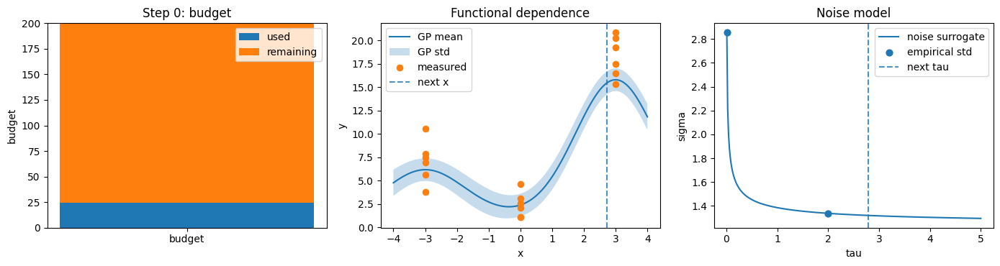

Measured y       : 13.2798


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 1
Current position : 2.715
Remaining budget : 172.831
Best action      : x=2.994, tau=0.648
Step cost        : 0.927
Rollout score    : 1.8126


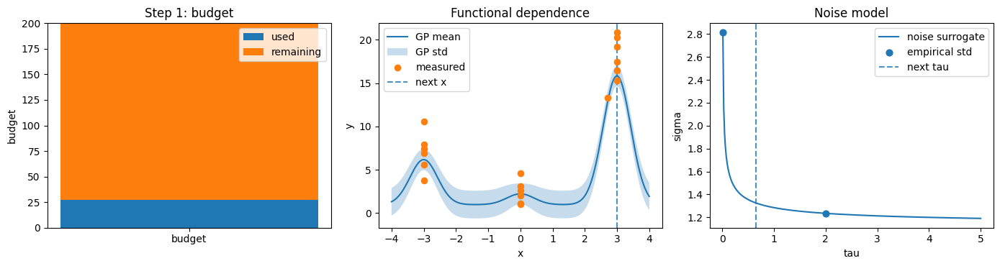

Measured y       : 17.7650


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 2
Current position : 2.994
Remaining budget : 171.904
Best action      : x=3.761, tau=0.263
Step cost        : 1.030
Rollout score    : 2.0276


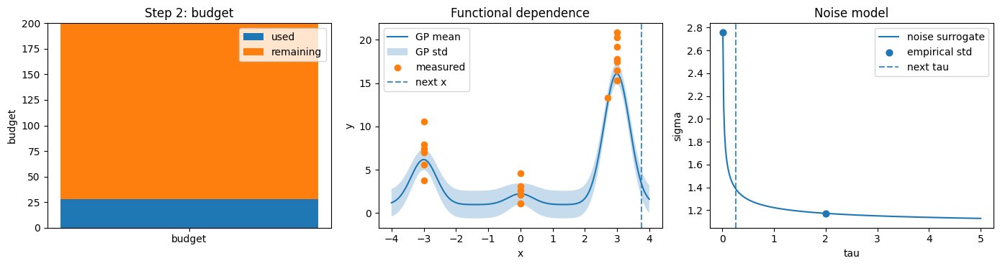

Measured y       : 11.3851


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 3
Current position : 3.761
Remaining budget : 170.874
Best action      : x=1.634, tau=0.804
Step cost        : 2.931
Rollout score    : 1.2595


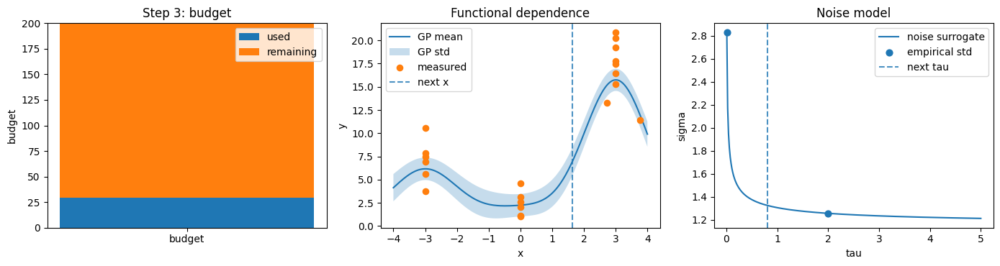

Measured y       : 25.9724


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 4
Current position : 1.634
Remaining budget : 167.943
Best action      : x=1.781, tau=1.514
Step cost        : 1.661
Rollout score    : 0.9956


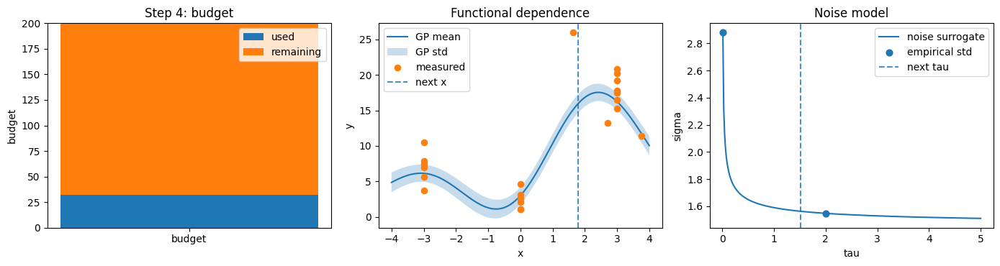

Measured y       : 23.0403


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 5
Current position : 1.781
Remaining budget : 166.282
Best action      : x=2.260, tau=1.610
Step cost        : 2.089
Rollout score    : 0.8952


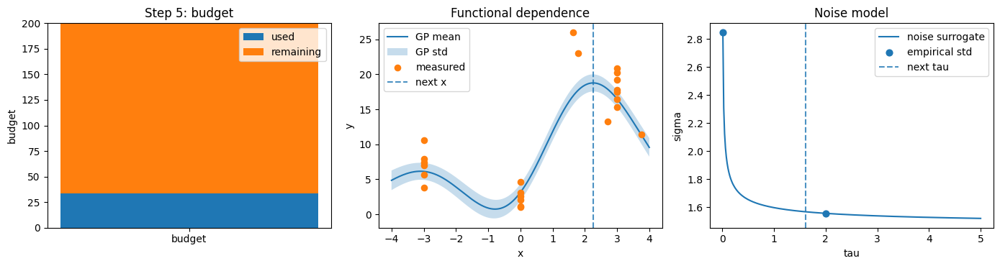

Measured y       : 12.6850


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 6
Current position : 2.260
Remaining budget : 164.193
Best action      : x=3.257, tau=1.498
Step cost        : 2.496
Rollout score    : 0.6547


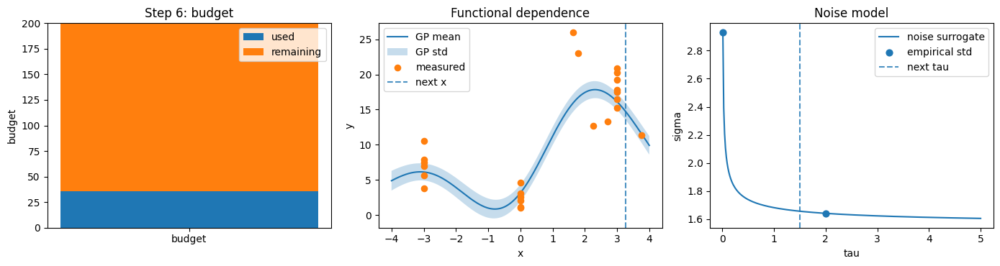

Measured y       : 30.8371


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 7
Current position : 3.257
Remaining budget : 161.698
Best action      : x=0.259, tau=1.135
Step cost        : 4.133
Rollout score    : -0.7604


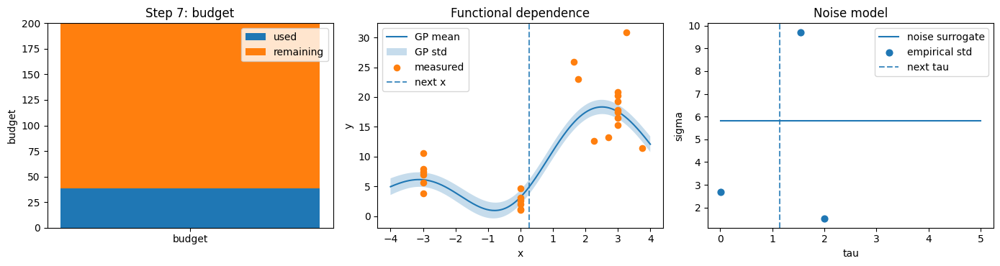

Measured y       : 18.4273


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 8
Current position : 0.259
Remaining budget : 157.565
Best action      : x=0.795, tau=0.636
Step cost        : 1.171
Rollout score    : -0.1291


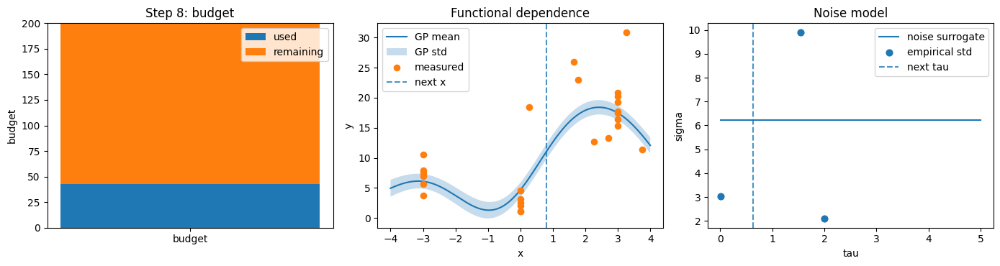

Measured y       : 8.2063


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 9
Current position : 0.795
Remaining budget : 156.394
Best action      : x=0.322, tau=0.589
Step cost        : 1.061
Rollout score    : 0.1109


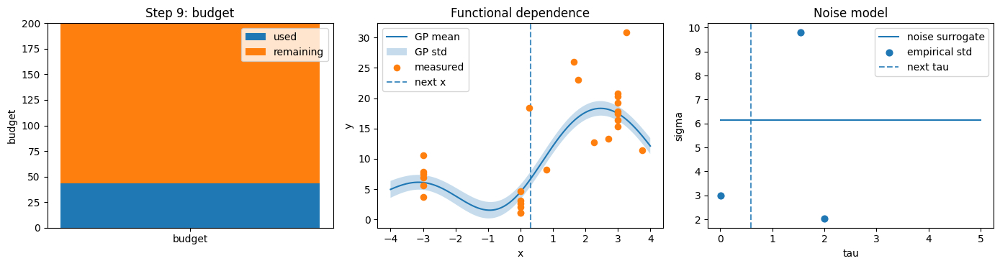

Measured y       : 24.3407


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 10
Current position : 0.322
Remaining budget : 155.333
Best action      : x=-0.479, tau=1.851
Step cost        : 2.653
Rollout score    : -0.3490


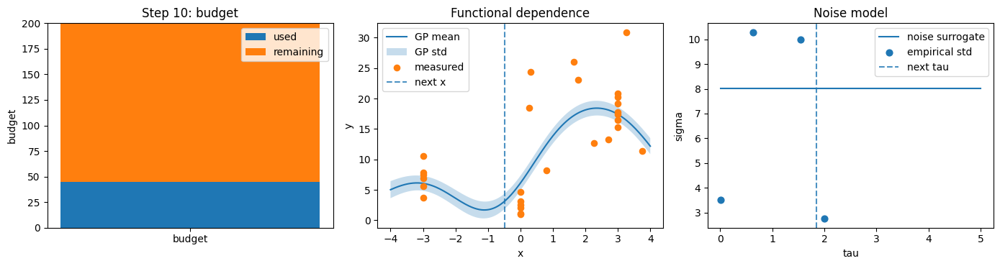

Measured y       : 9.9467


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 11
Current position : -0.479
Remaining budget : 152.681
Best action      : x=-0.002, tau=0.084
Step cost        : 0.561
Rollout score    : -0.2073


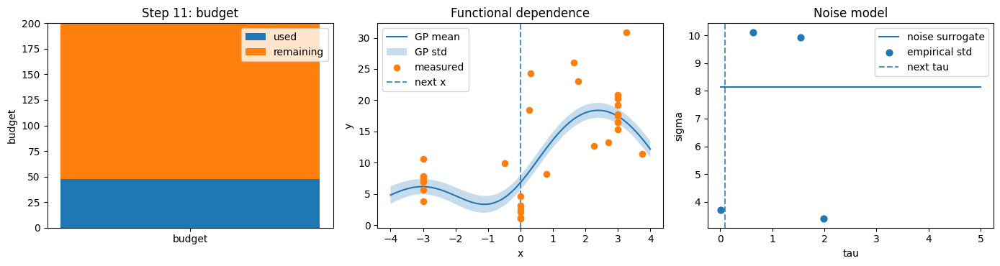

Measured y       : 2.9413


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 12
Current position : -0.002
Remaining budget : 152.119
Best action      : x=-1.341, tau=0.239
Step cost        : 1.578
Rollout score    : -0.3840


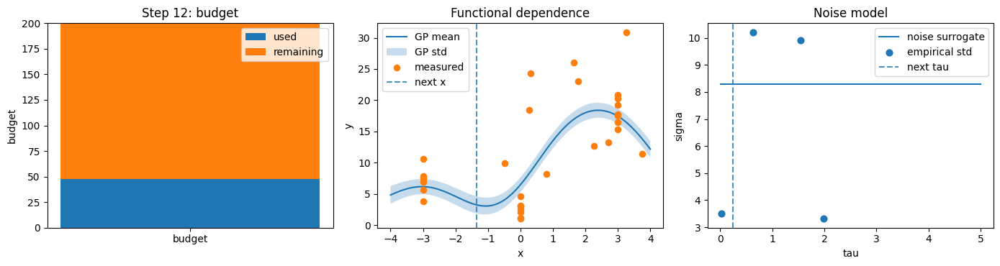

Measured y       : 18.0353


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 13
Current position : -1.341
Remaining budget : 150.541
Best action      : x=-1.370, tau=1.531
Step cost        : 1.560
Rollout score    : -0.4893


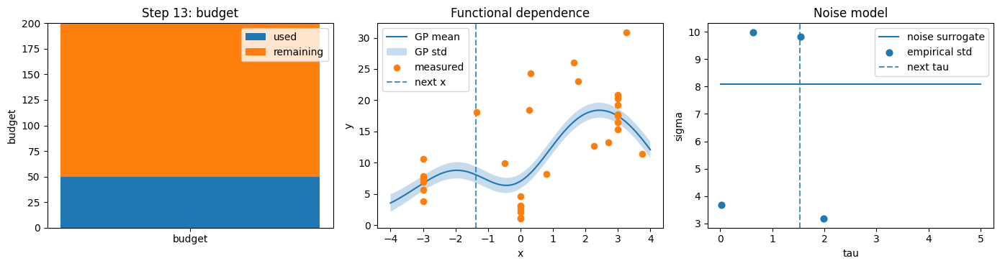

Measured y       : 17.1998


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 14
Current position : -1.370
Remaining budget : 148.981
Best action      : x=-0.215, tau=0.536
Step cost        : 1.691
Rollout score    : -0.1991


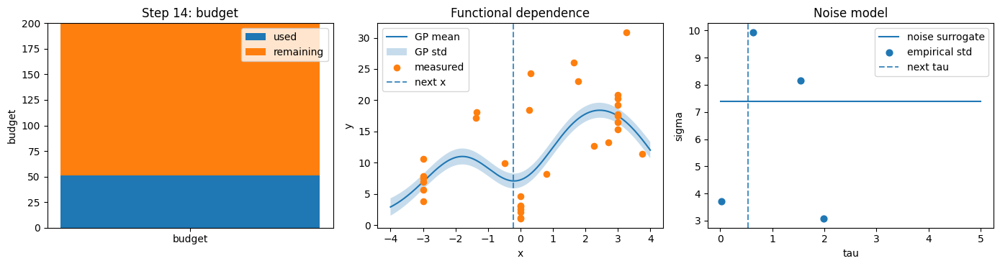

Measured y       : 3.8797


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 15
Current position : -0.215
Remaining budget : 147.291
Best action      : x=1.700, tau=0.904
Step cost        : 2.818
Rollout score    : -0.7157


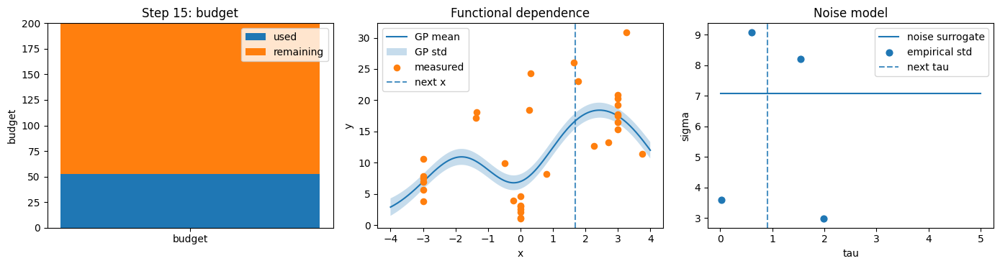

Measured y       : 19.5014


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 16
Current position : 1.700
Remaining budget : 144.472
Best action      : x=3.235, tau=0.740
Step cost        : 2.276
Rollout score    : -0.4301


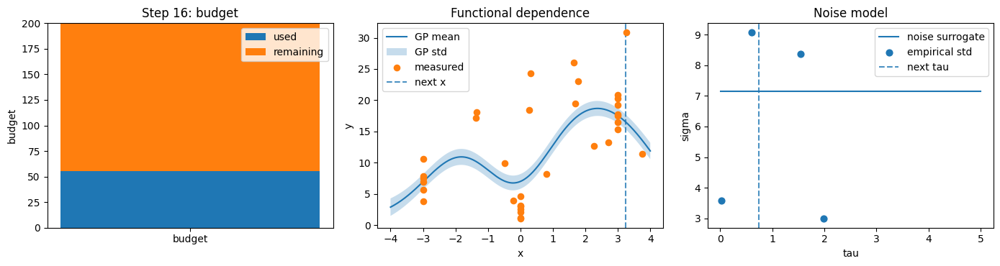

Measured y       : 28.0634


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 17
Current position : 3.235
Remaining budget : 142.196
Best action      : x=3.002, tau=1.226
Step cost        : 1.459
Rollout score    : -0.2505


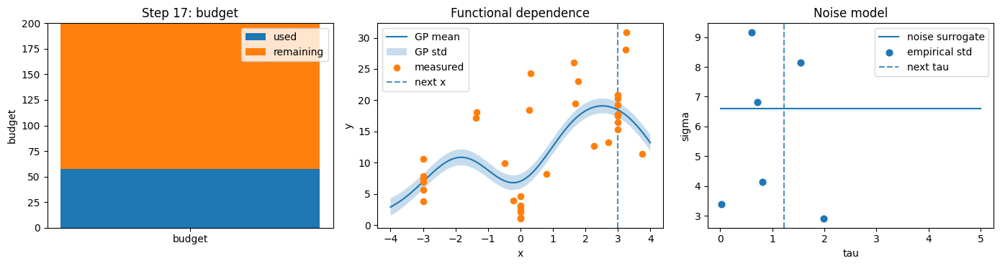

Measured y       : 17.6135


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 18
Current position : 3.002
Remaining budget : 140.737
Best action      : x=2.415, tau=0.387
Step cost        : 0.973
Rollout score    : -0.3406


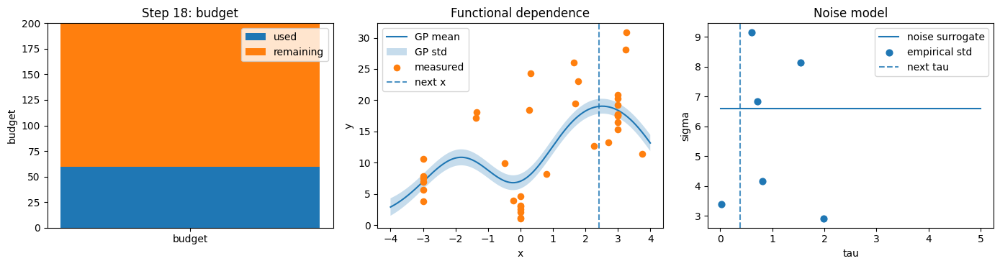

Measured y       : 15.5108


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 19
Current position : 2.415
Remaining budget : 139.764
Best action      : x=3.072, tau=0.354
Step cost        : 1.011
Rollout score    : -0.1784


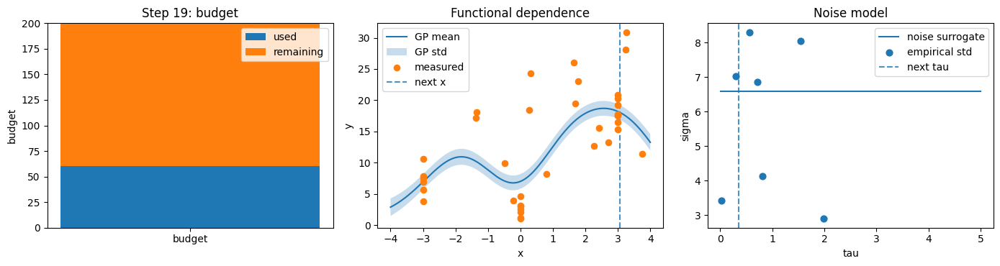

Measured y       : 24.6456


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 20
Current position : 3.072
Remaining budget : 138.753
Best action      : x=0.766, tau=2.766
Step cost        : 5.072
Rollout score    : -0.6849


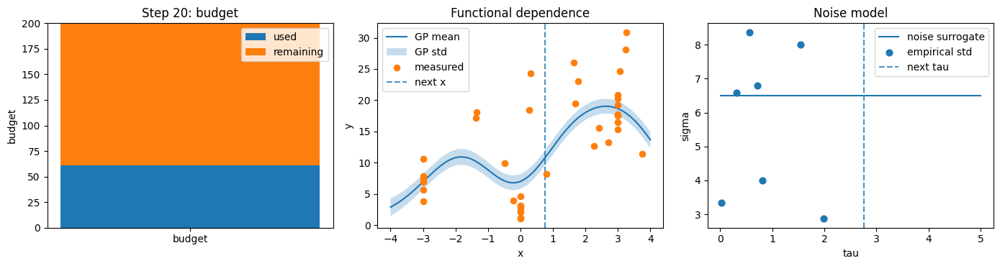

Measured y       : 9.0071


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 21
Current position : 0.766
Remaining budget : 133.682
Best action      : x=0.362, tau=0.972
Step cost        : 1.375
Rollout score    : -0.2432


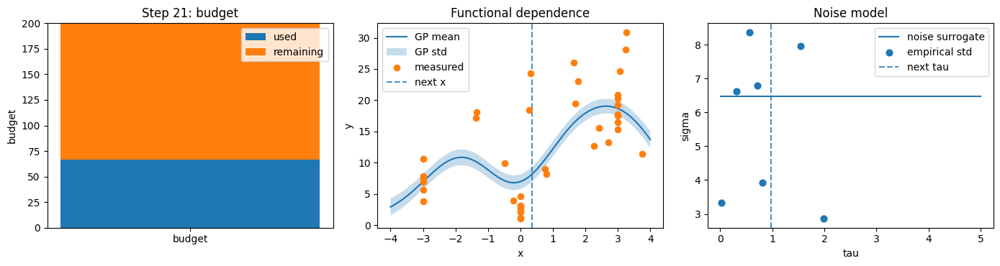

Measured y       : 23.1561


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 22
Current position : 0.362
Remaining budget : 132.307
Best action      : x=0.242, tau=4.863
Step cost        : 4.983
Rollout score    : -0.5198


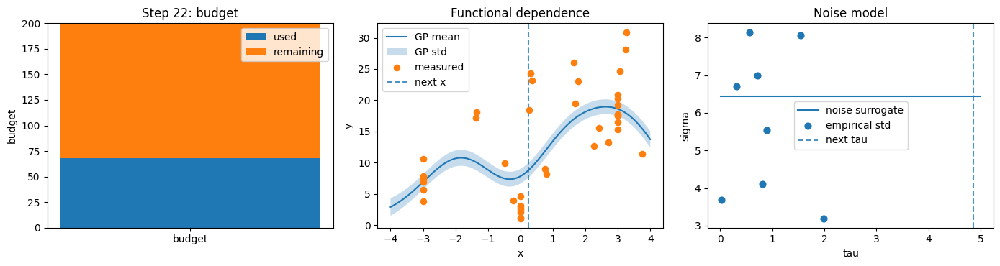

Measured y       : 18.3194


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 23
Current position : 0.242
Remaining budget : 127.324
Best action      : x=0.454, tau=4.104
Step cost        : 4.315
Rollout score    : -0.1202


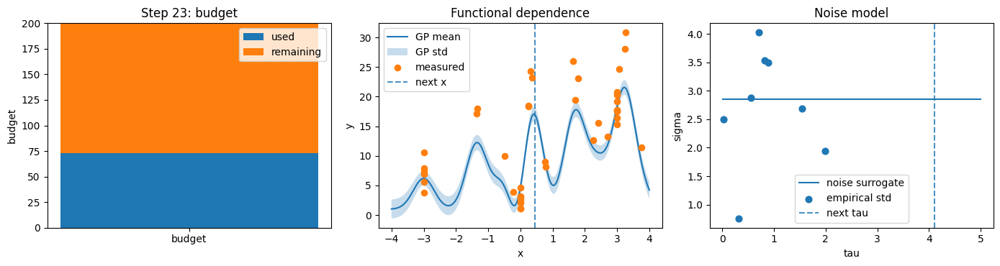

Measured y       : 23.8094


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 24
Current position : 0.454
Remaining budget : 123.009
Best action      : x=1.004, tau=1.984
Step cost        : 2.534
Rollout score    : 0.3329


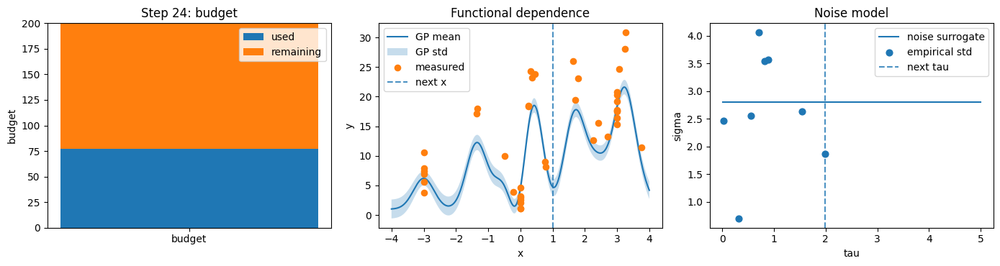

Measured y       : -2.7713


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 25
Current position : 1.004
Remaining budget : 120.475
Best action      : x=-1.334, tau=0.525
Step cost        : 2.863
Rollout score    : 0.1547


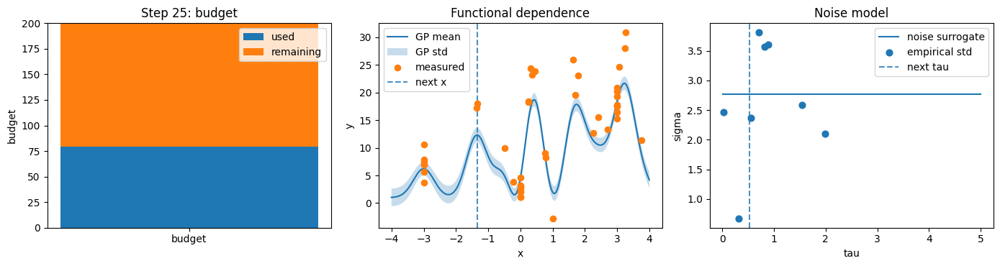

Measured y       : 18.5994


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 26
Current position : -1.334
Remaining budget : 117.612
Best action      : x=-1.869, tau=1.732
Step cost        : 2.267
Rollout score    : 0.4210


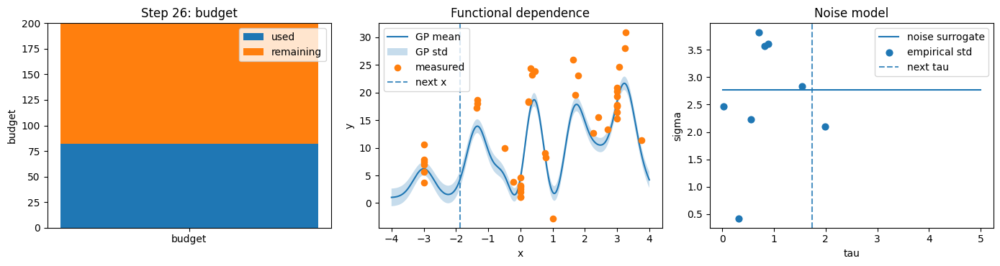

Measured y       : -0.5787


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 27
Current position : -1.869
Remaining budget : 115.345
Best action      : x=-1.390, tau=2.166
Step cost        : 2.645
Rollout score    : 0.2634


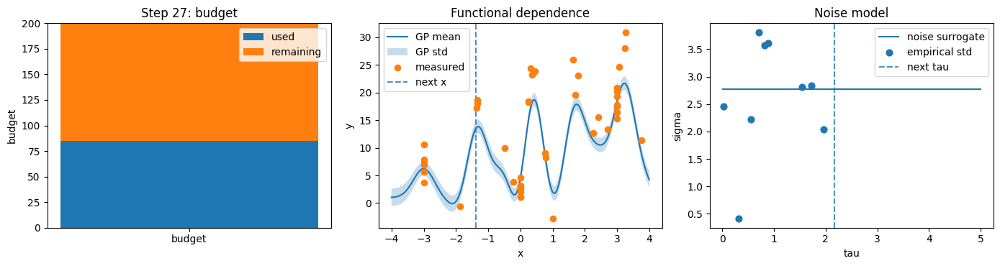

Measured y       : 18.0599


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 28
Current position : -1.390
Remaining budget : 112.701
Best action      : x=-1.733, tau=0.828
Step cost        : 1.171
Rollout score    : 0.3377


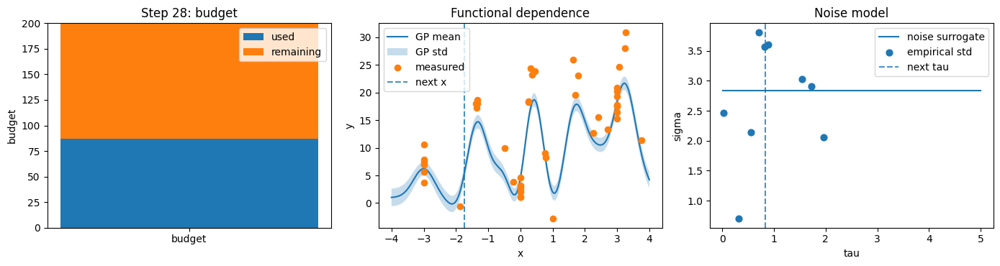

Measured y       : 4.8847


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 29
Current position : -1.733
Remaining budget : 111.530
Best action      : x=-1.261, tau=1.726
Step cost        : 2.197
Rollout score    : 0.5532


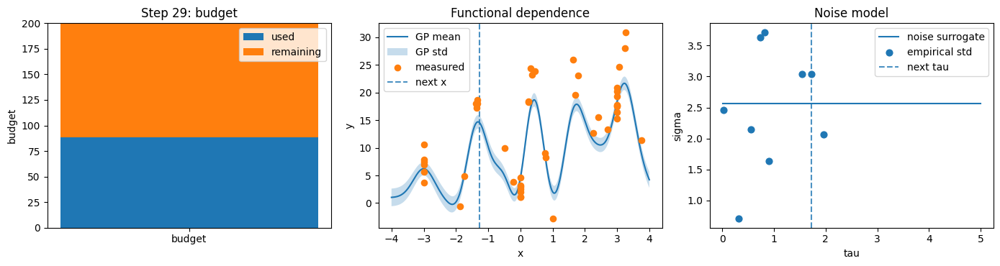

Measured y       : 17.5933


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 30
Current position : -1.261
Remaining budget : 109.333
Best action      : x=-3.965, tau=1.960
Step cost        : 4.664
Rollout score    : 0.1341


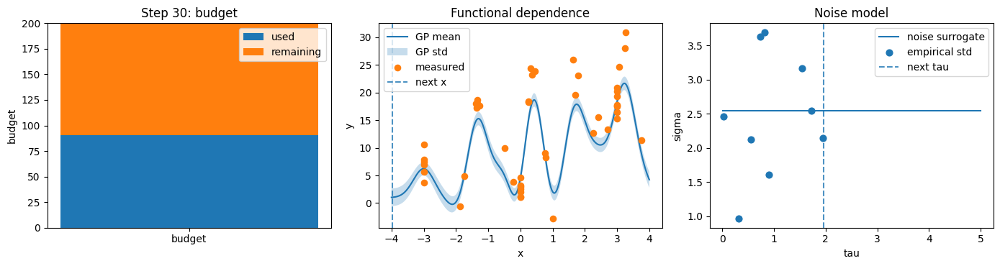

Measured y       : 30.7084


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 31
Current position : -3.965
Remaining budget : 104.669
Best action      : x=-2.694, tau=0.307
Step cost        : 1.579
Rollout score    : 0.3301


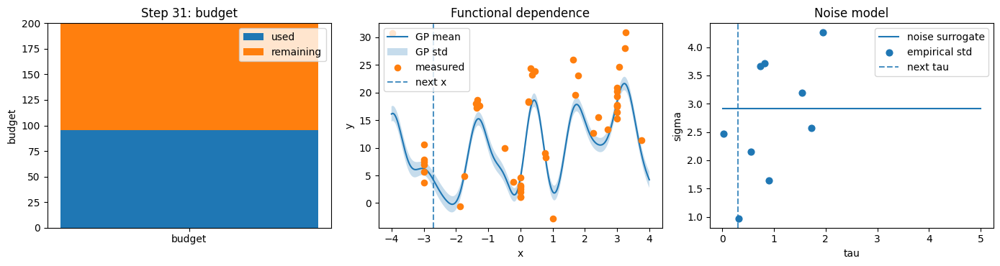

Measured y       : 23.8399


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 32
Current position : -2.694
Remaining budget : 103.090
Best action      : x=-2.948, tau=1.171
Step cost        : 1.425
Rollout score    : 0.4903


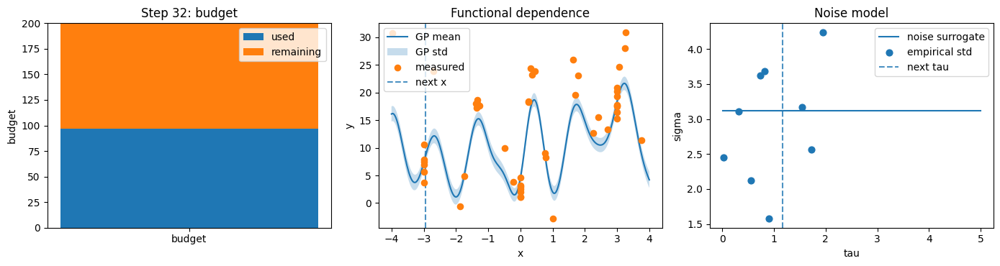

Measured y       : 8.6310


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 33
Current position : -2.948
Remaining budget : 101.665
Best action      : x=-3.518, tau=1.239
Step cost        : 1.809
Rollout score    : 0.4567


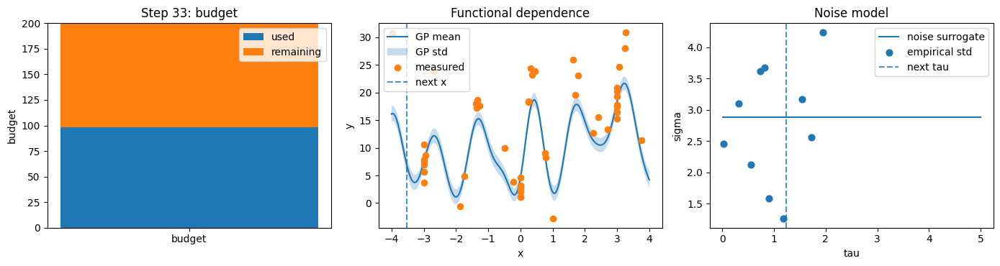

Measured y       : 27.2819


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 34
Current position : -3.518
Remaining budget : 99.855
Best action      : x=-2.743, tau=0.450
Step cost        : 1.225
Rollout score    : 0.4078


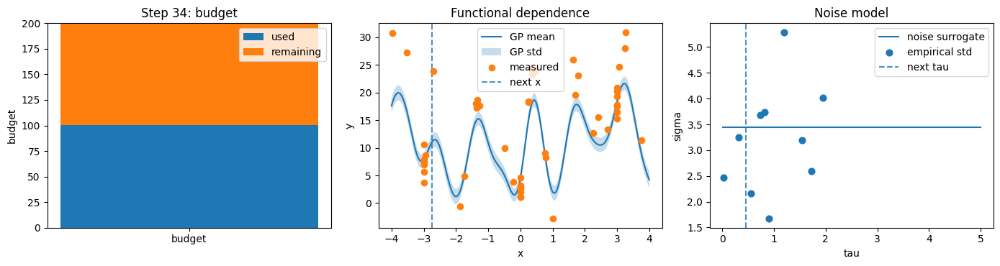

Measured y       : 22.2003


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 35
Current position : -2.743
Remaining budget : 98.630
Best action      : x=-3.309, tau=0.774
Step cost        : 1.340
Rollout score    : 0.2672


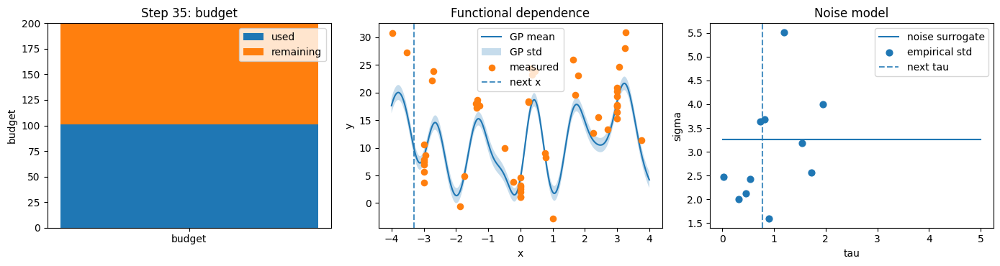

Measured y       : 15.3784


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 36
Current position : -3.309
Remaining budget : 97.290
Best action      : x=-2.074, tau=1.599
Step cost        : 2.834
Rollout score    : 0.2000


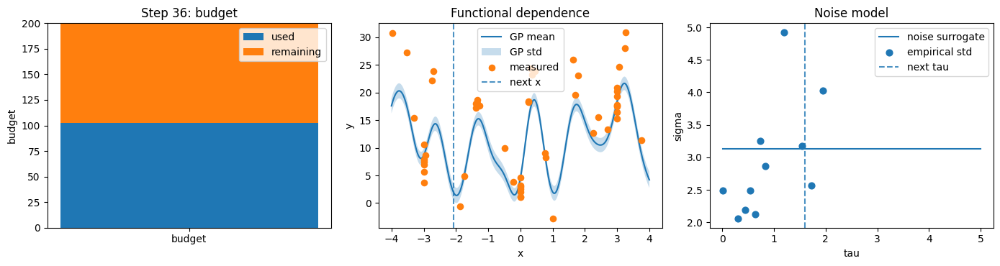

Measured y       : 4.6834


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 37
Current position : -2.074
Remaining budget : 94.456
Best action      : x=-1.200, tau=2.381
Step cost        : 3.255
Rollout score    : -0.1608


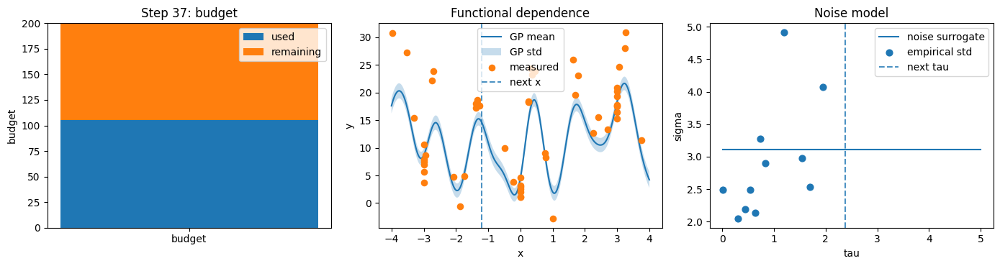

Measured y       : 16.1833


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 38
Current position : -1.200
Remaining budget : 91.201
Best action      : x=-1.941, tau=0.791
Step cost        : 1.532
Rollout score    : 0.2401


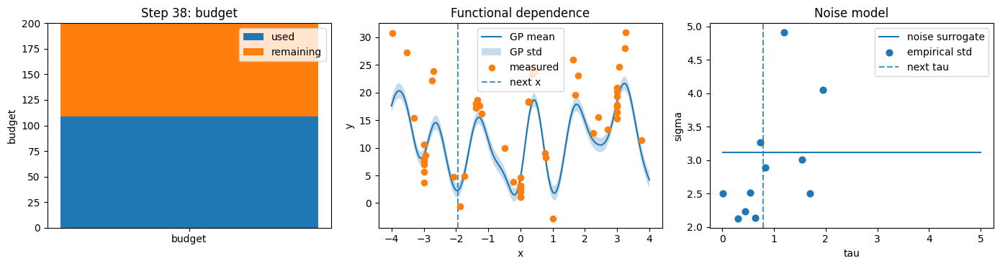

Measured y       : -1.3864


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 39
Current position : -1.941
Remaining budget : 89.669
Best action      : x=-2.933, tau=1.257
Step cost        : 2.249
Rollout score    : -0.0827


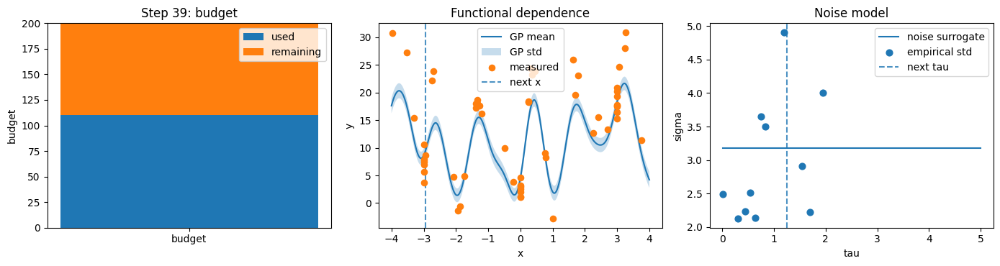

Measured y       : 6.9274


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 40
Current position : -2.933
Remaining budget : 87.420
Best action      : x=-1.532, tau=1.649
Step cost        : 3.050
Rollout score    : -0.0593


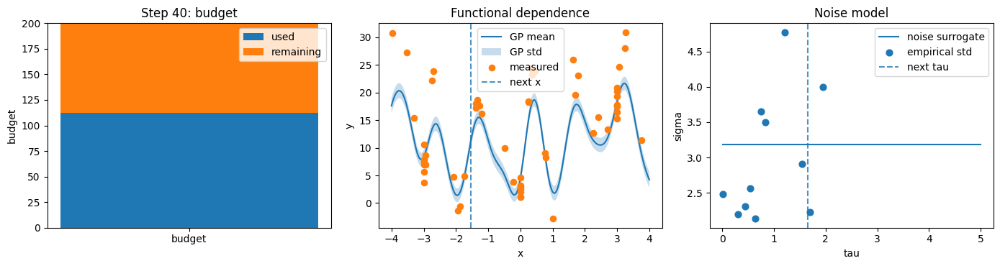

Measured y       : 15.5400


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 41
Current position : -1.532
Remaining budget : 84.370
Best action      : x=-1.599, tau=2.141
Step cost        : 2.208
Rollout score    : 0.2833


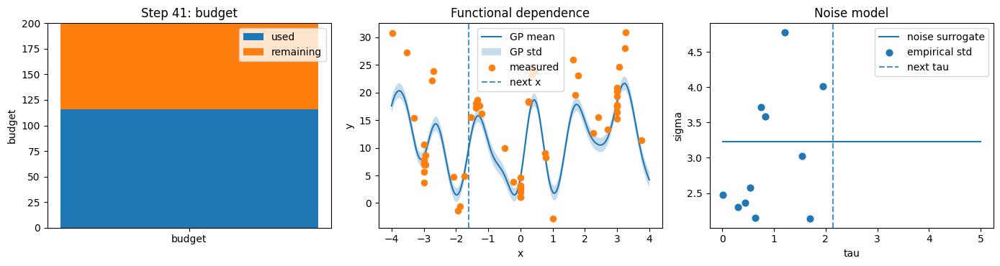

Measured y       : 13.3198


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 42
Current position : -1.599
Remaining budget : 82.162
Best action      : x=-2.066, tau=0.502
Step cost        : 0.969
Rollout score    : 0.1389


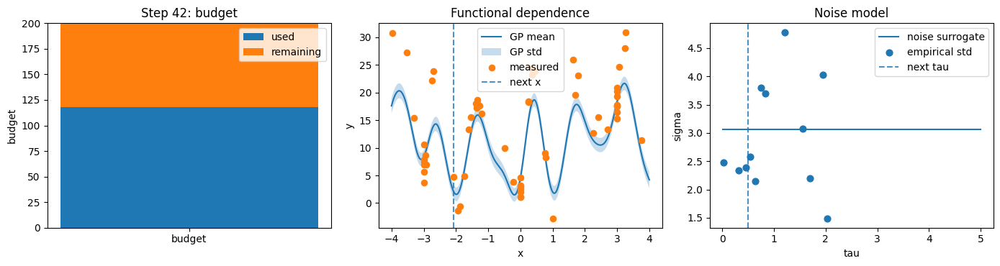

Measured y       : 3.6971


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 43
Current position : -2.066
Remaining budget : 81.193
Best action      : x=-0.649, tau=0.480
Step cost        : 1.898
Rollout score    : 0.3035


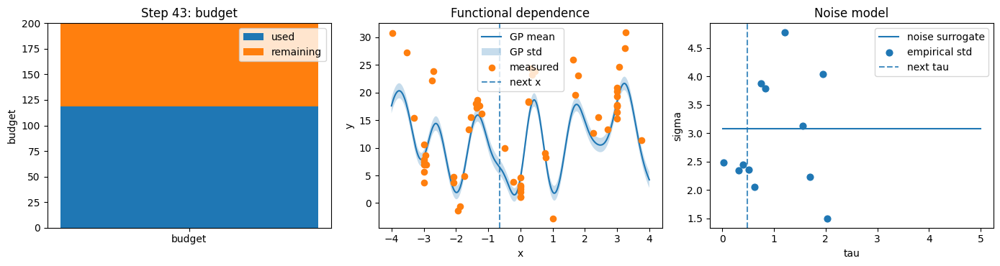

Measured y       : 10.7710


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 44
Current position : -0.649
Remaining budget : 79.295
Best action      : x=0.308, tau=0.606
Step cost        : 1.563
Rollout score    : 0.2543


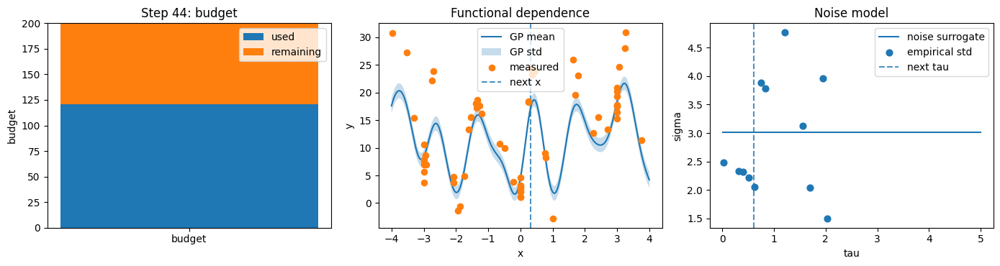

Measured y       : 20.7334


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 45
Current position : 0.308
Remaining budget : 77.732
Best action      : x=-1.627, tau=0.535
Step cost        : 2.470
Rollout score    : 0.3427


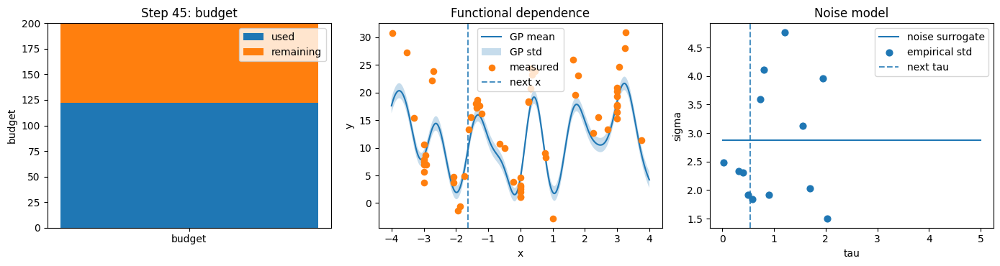

Measured y       : 9.6526


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 46
Current position : -1.627
Remaining budget : 75.262
Best action      : x=-2.367, tau=0.423
Step cost        : 1.163
Rollout score    : 0.1641


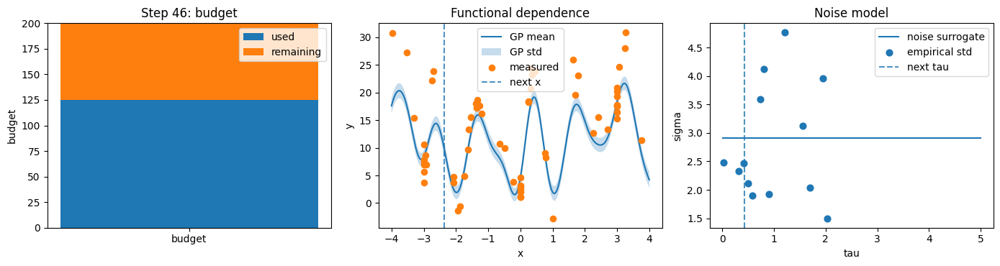

Measured y       : 24.4719


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 47
Current position : -2.367
Remaining budget : 74.099
Best action      : x=-1.428, tau=0.112
Step cost        : 1.051
Rollout score    : 0.2114


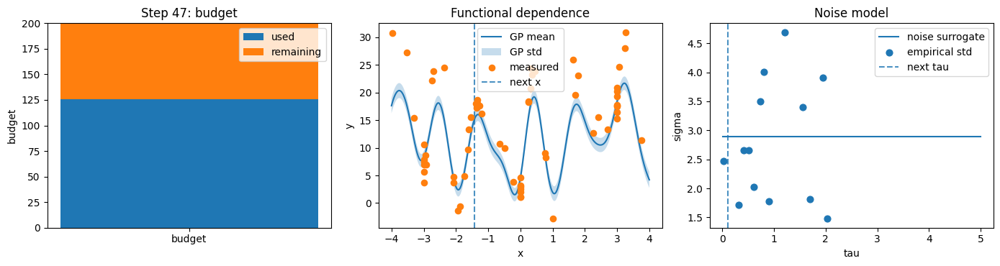

Measured y       : 22.1644


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 48
Current position : -1.428
Remaining budget : 73.048
Best action      : x=-2.364, tau=0.786
Step cost        : 1.722
Rollout score    : 0.2403


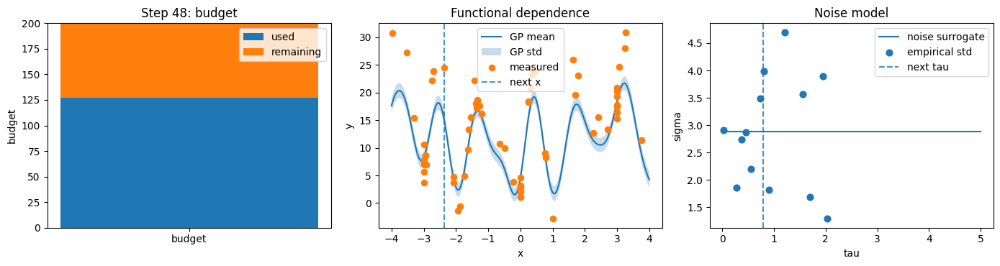

Measured y       : 28.4635


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 49
Current position : -2.364
Remaining budget : 71.326
Best action      : x=-2.243, tau=0.848
Step cost        : 0.969
Rollout score    : 0.2616


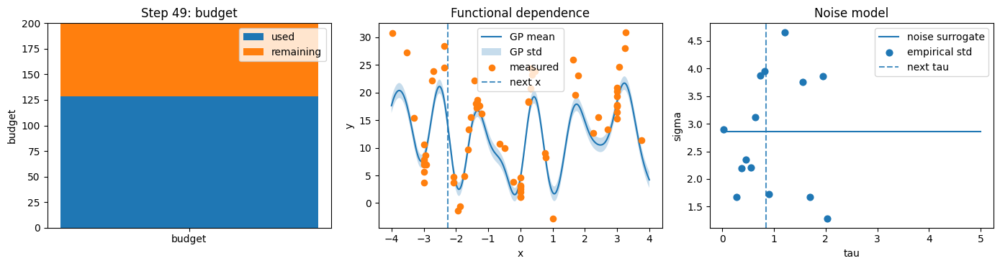

Measured y       : 17.2712


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 50
Current position : -2.243
Remaining budget : 70.357
Best action      : x=-0.238, tau=0.737
Step cost        : 2.742
Rollout score    : 0.0872


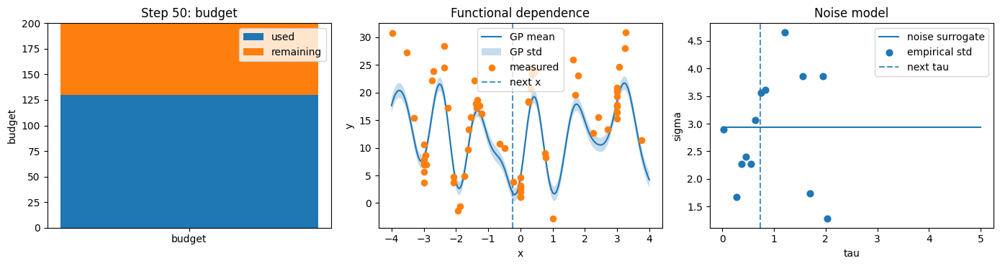

Measured y       : 2.3294


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 51
Current position : -0.238
Remaining budget : 67.615
Best action      : x=-0.590, tau=0.216
Step cost        : 0.568
Rollout score    : 0.0925


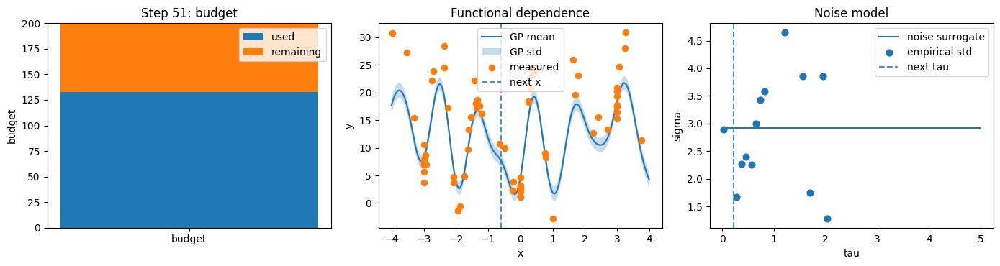

Measured y       : 10.4328


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 52
Current position : -0.590
Remaining budget : 67.048
Best action      : x=2.146, tau=0.300
Step cost        : 3.036
Rollout score    : 0.1219


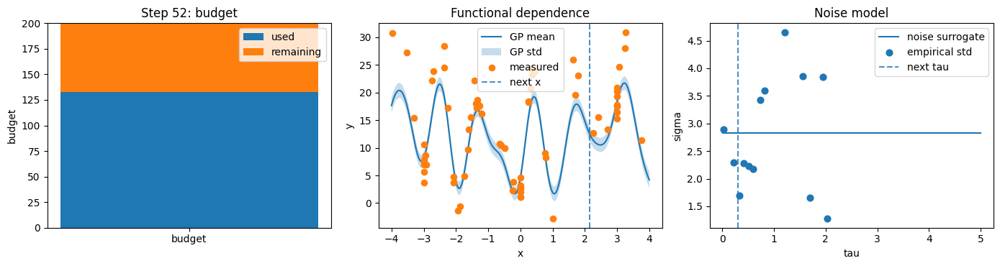

Measured y       : 9.7005


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 53
Current position : 2.146
Remaining budget : 64.012
Best action      : x=2.249, tau=0.665
Step cost        : 0.768
Rollout score    : 0.3344


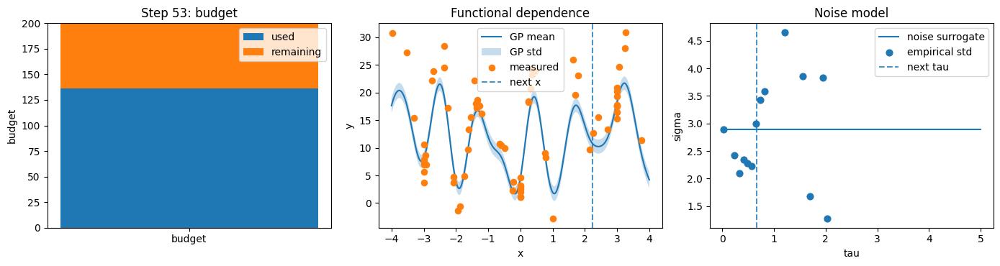

Measured y       : 11.6978


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 54
Current position : 2.249
Remaining budget : 63.244
Best action      : x=3.342, tau=0.720
Step cost        : 1.813
Rollout score    : 0.0992


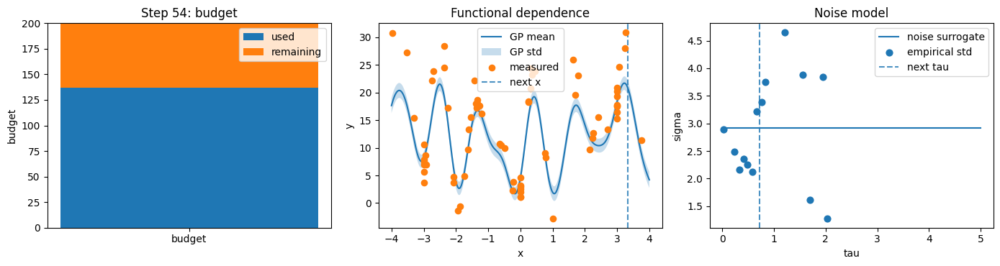

Measured y       : 34.4943


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 55
Current position : 3.342
Remaining budget : 61.431
Best action      : x=0.595, tau=1.596
Step cost        : 4.343
Rollout score    : -0.2050


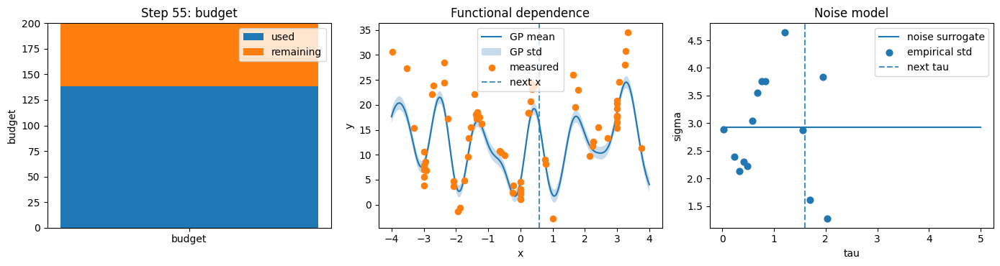

Measured y       : 22.7781


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 56
Current position : 0.595
Remaining budget : 57.088
Best action      : x=0.773, tau=0.398
Step cost        : 0.577
Rollout score    : 0.4256


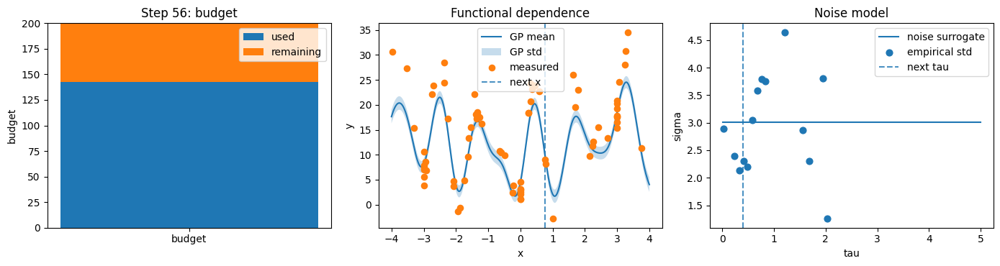

Measured y       : 11.2518


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 57
Current position : 0.773
Remaining budget : 56.512
Best action      : x=-0.436, tau=0.777
Step cost        : 1.986
Rollout score    : 0.2146


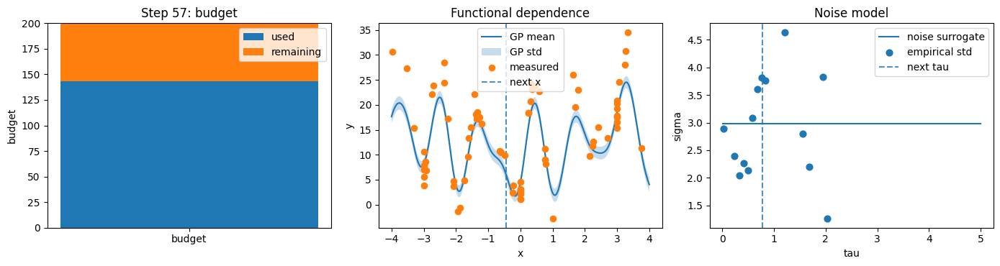

Measured y       : 7.6745


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 58
Current position : -0.436
Remaining budget : 54.526
Best action      : x=-0.581, tau=0.028
Step cost        : 0.174
Rollout score    : 0.8017


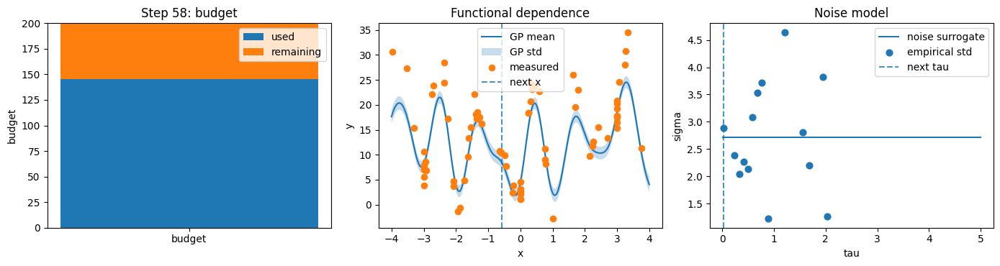

Measured y       : 10.0049


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 59
Current position : -0.581
Remaining budget : 54.352
Best action      : x=-2.649, tau=2.144
Step cost        : 4.212
Rollout score    : -0.2393


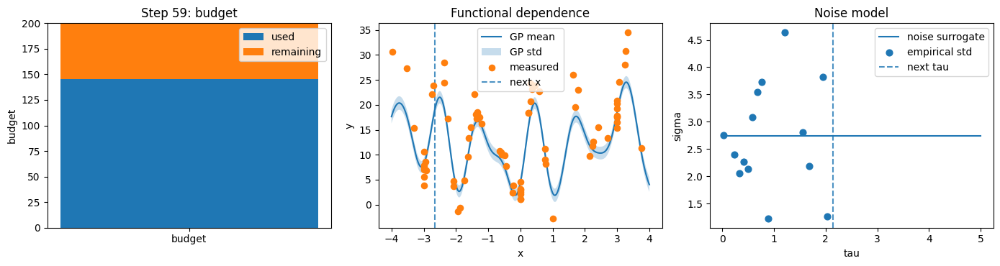

Measured y       : 28.4019


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 60
Current position : -2.649
Remaining budget : 50.140
Best action      : x=-0.366, tau=0.529
Step cost        : 2.812
Rollout score    : 0.0047


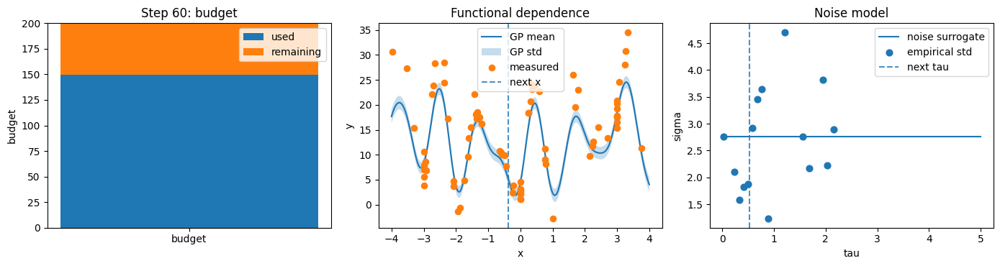

Measured y       : 6.0832


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 61
Current position : -0.366
Remaining budget : 47.328
Best action      : x=-1.117, tau=0.702
Step cost        : 1.453
Rollout score    : 0.4026


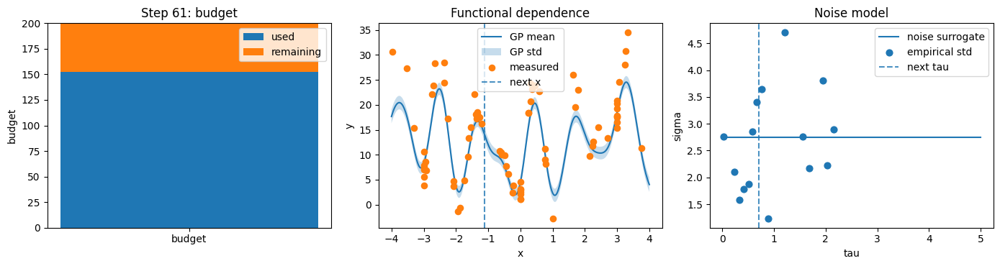

Measured y       : 13.4092


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 62
Current position : -1.117
Remaining budget : 45.875
Best action      : x=-1.037, tau=1.029
Step cost        : 1.110
Rollout score    : 0.5251


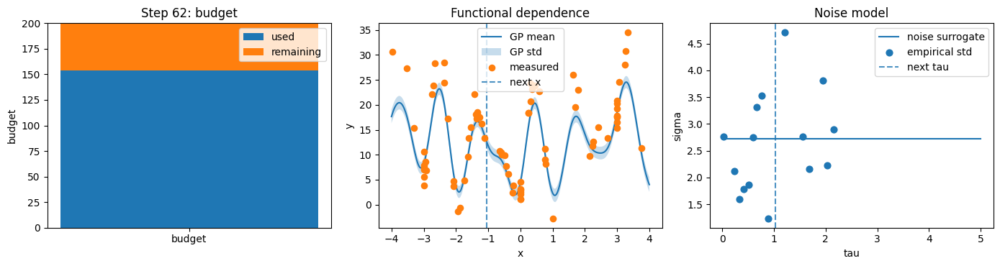

Measured y       : 12.0885


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 63
Current position : -1.037
Remaining budget : 44.765
Best action      : x=1.063, tau=0.234
Step cost        : 2.334
Rollout score    : 0.0298


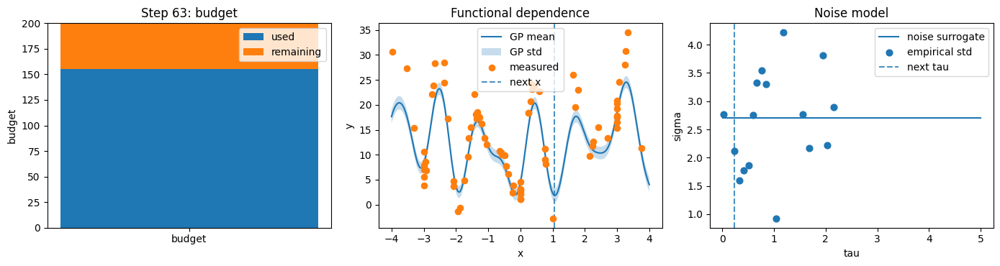

Measured y       : -2.2193


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 64
Current position : 1.063
Remaining budget : 42.432
Best action      : x=1.409, tau=0.735
Step cost        : 1.081
Rollout score    : 0.3715


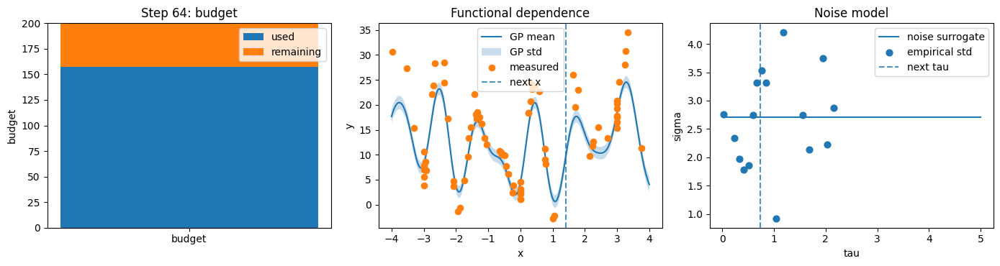

Measured y       : 20.2956


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 65
Current position : 1.409
Remaining budget : 41.351
Best action      : x=2.087, tau=0.569
Step cost        : 1.248
Rollout score    : 0.5712


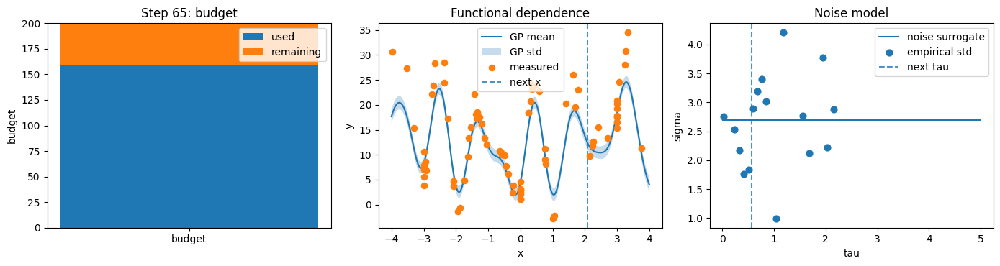

Measured y       : 10.0761


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 66
Current position : 2.087
Remaining budget : 40.103
Best action      : x=3.157, tau=1.150
Step cost        : 2.219
Rollout score    : 0.3122


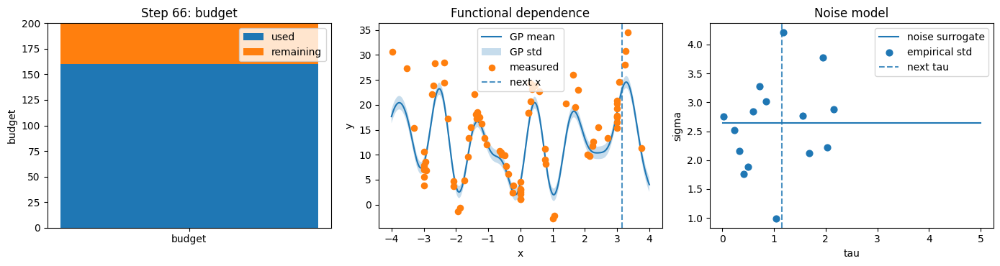

Measured y       : 23.7614


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 67
Current position : 3.157
Remaining budget : 37.884
Best action      : x=3.093, tau=0.284
Step cost        : 0.348
Rollout score    : 0.5230


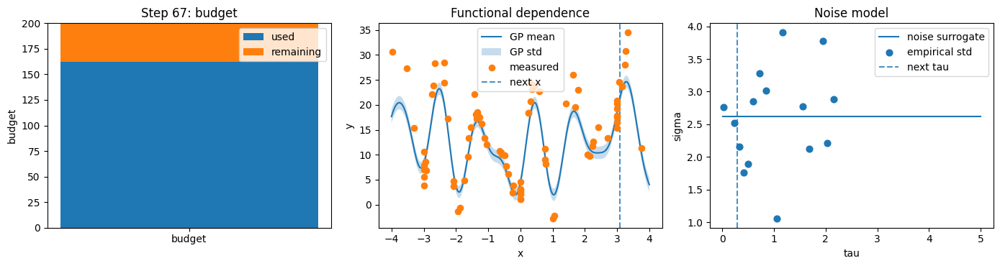

Measured y       : 20.7661


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 68
Current position : 3.093
Remaining budget : 37.536
Best action      : x=3.510, tau=4.716
Step cost        : 5.133
Rollout score    : -0.1273


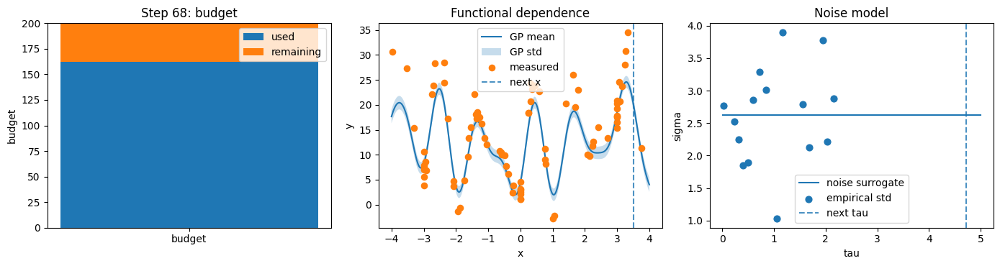

Measured y       : 30.7054


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 69
Current position : 3.510
Remaining budget : 32.403
Best action      : x=2.425, tau=0.827
Step cost        : 1.911
Rollout score    : 0.2003


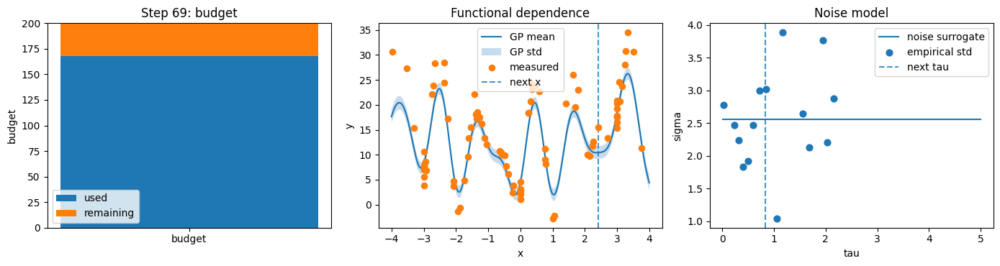

Measured y       : 13.0905


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 70
Current position : 2.425
Remaining budget : 30.492
Best action      : x=1.663, tau=0.518
Step cost        : 1.280
Rollout score    : 0.5049


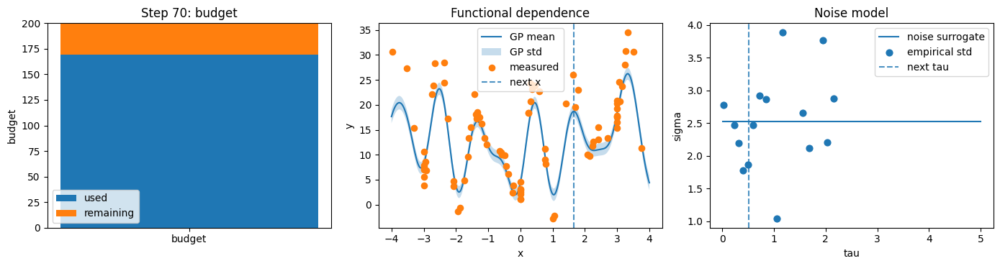

Measured y       : 25.0533


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 71
Current position : 1.663
Remaining budget : 29.211
Best action      : x=0.628, tau=1.844
Step cost        : 2.880
Rollout score    : 0.1803


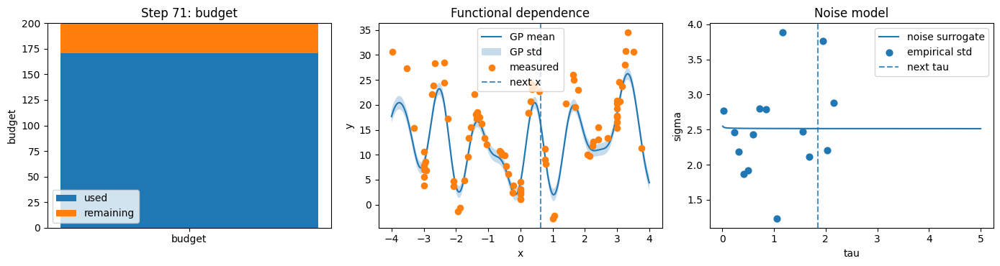

Measured y       : 18.5055


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 72
Current position : 0.628
Remaining budget : 26.332
Best action      : x=0.378, tau=1.897
Step cost        : 2.146
Rollout score    : -0.0034


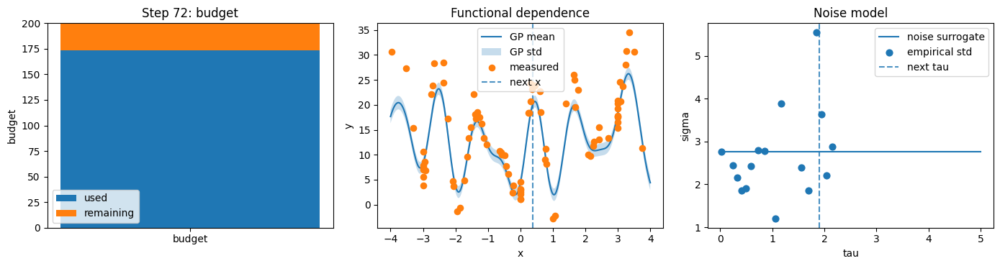

Measured y       : 25.7640


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 73
Current position : 0.378
Remaining budget : 24.185
Best action      : x=-2.287, tau=0.493
Step cost        : 3.159
Rollout score    : 0.0803


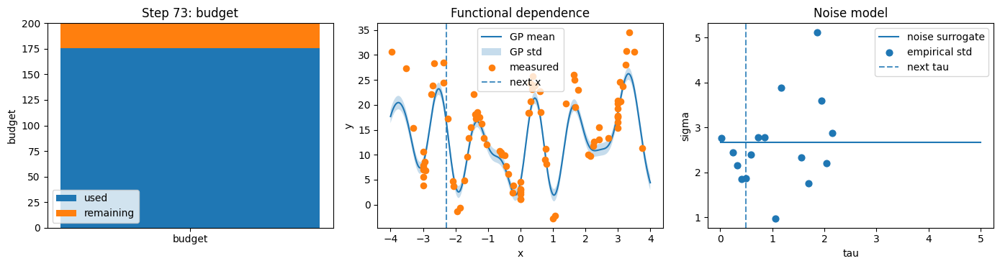

Measured y       : 22.5261


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 74
Current position : -2.287
Remaining budget : 21.027
Best action      : x=-3.175, tau=1.411
Step cost        : 2.299
Rollout score    : 0.1207


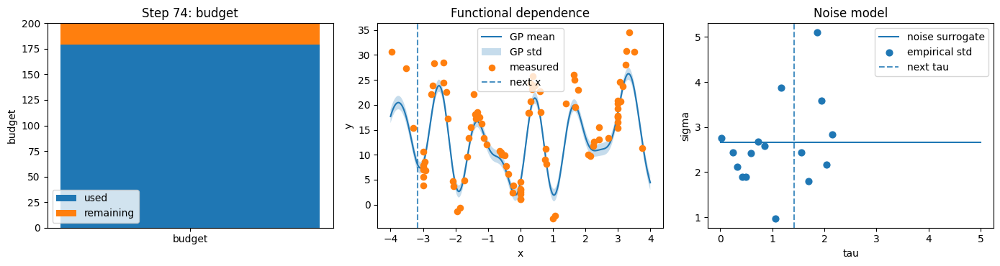

Measured y       : 8.7551


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 75
Current position : -3.175
Remaining budget : 18.728
Best action      : x=0.346, tau=0.166
Step cost        : 3.687
Rollout score    : 0.0289


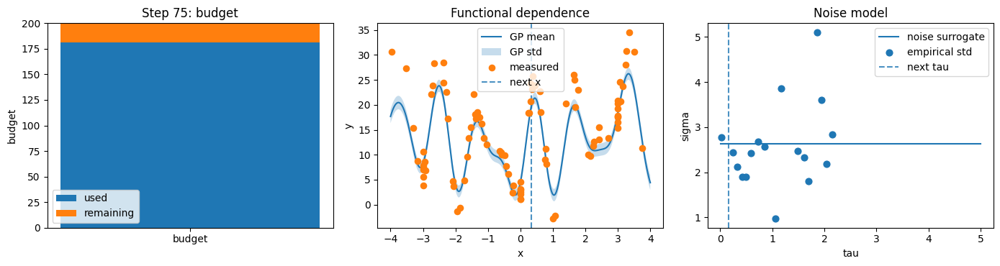

Measured y       : 22.6772


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 76
Current position : 0.346
Remaining budget : 15.041
Best action      : x=0.377, tau=0.678
Step cost        : 0.708
Rollout score    : 0.3271


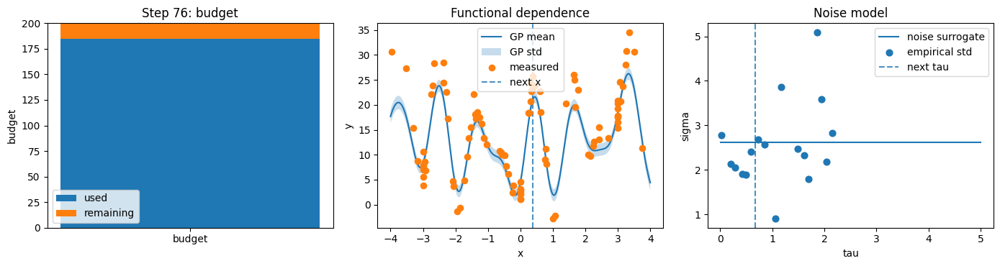

Measured y       : 26.7595


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 77
Current position : 0.377
Remaining budget : 14.333
Best action      : x=-0.587, tau=0.135
Step cost        : 1.099
Rollout score    : 0.5629


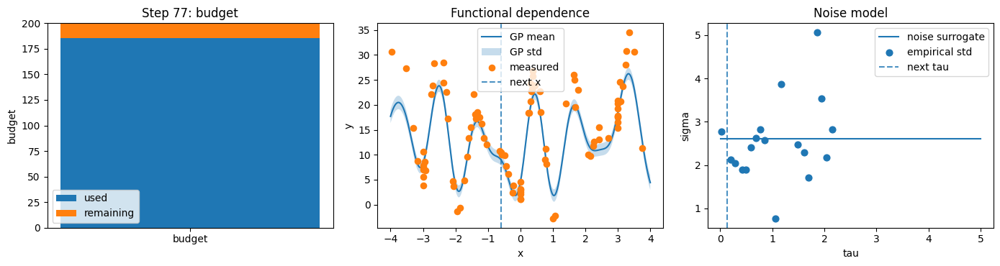

Measured y       : 8.1889


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 78
Current position : -0.587
Remaining budget : 13.234
Best action      : x=-1.377, tau=1.261
Step cost        : 2.051
Rollout score    : 0.4398


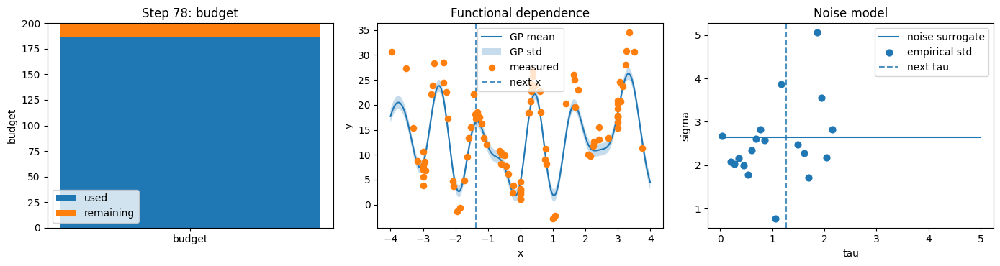

Measured y       : 18.4540


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 79
Current position : -1.377
Remaining budget : 11.183
Best action      : x=-0.255, tau=0.390
Step cost        : 1.513
Rollout score    : 0.4386


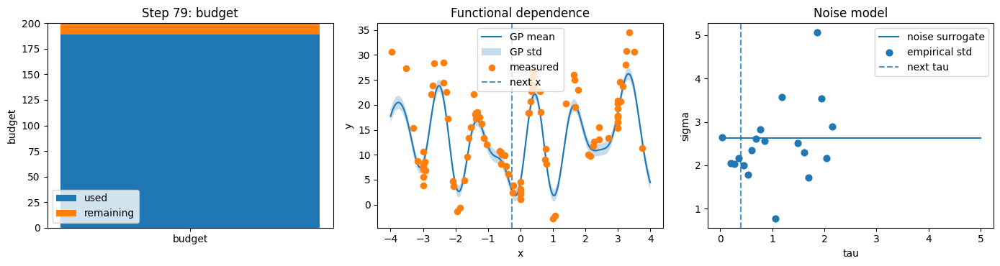

Measured y       : -0.5908


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 80
Current position : -0.255
Remaining budget : 9.670
Best action      : x=-1.196, tau=0.337
Step cost        : 1.279
Rollout score    : 0.0622


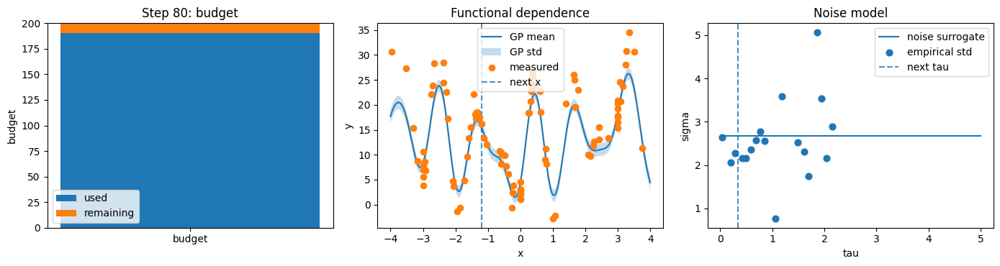

Measured y       : 18.7974


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 81
Current position : -1.196
Remaining budget : 8.392
Best action      : x=0.427, tau=0.279
Step cost        : 1.902
Rollout score    : 0.0955


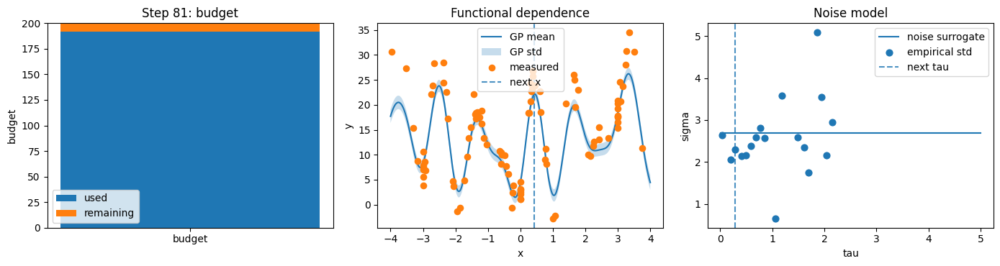

Measured y       : 27.1764


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 82
Current position : 0.427
Remaining budget : 6.489
Best action      : x=0.444, tau=0.995
Step cost        : 1.012
Rollout score    : 0.4846


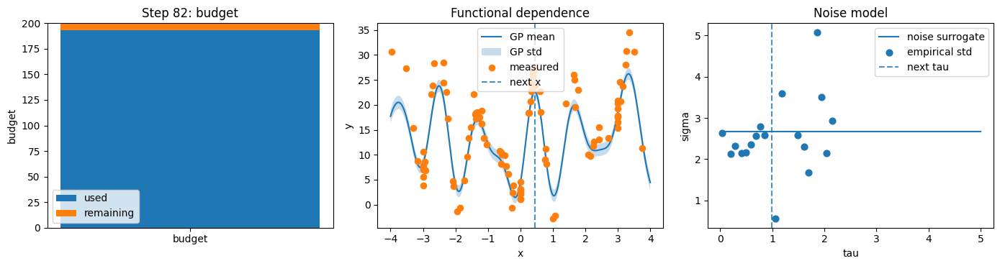

Measured y       : 24.2222


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 83
Current position : 0.444
Remaining budget : 5.478
Best action      : x=-0.240, tau=0.190
Step cost        : 0.874
Rollout score    : 0.1681


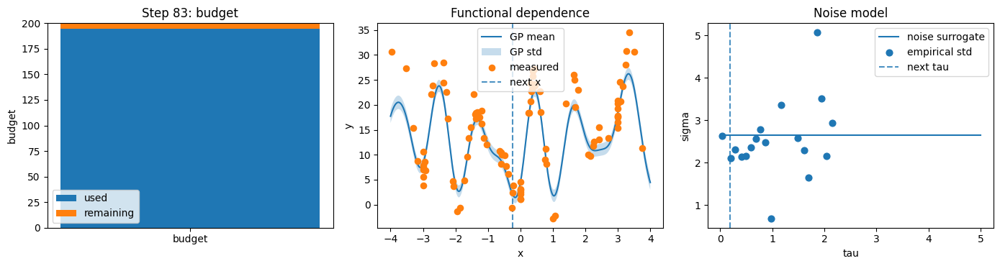

Measured y       : 6.1932


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 84
Current position : -0.240
Remaining budget : 4.604
Best action      : x=0.656, tau=0.989
Step cost        : 1.885
Rollout score    : 0.4532


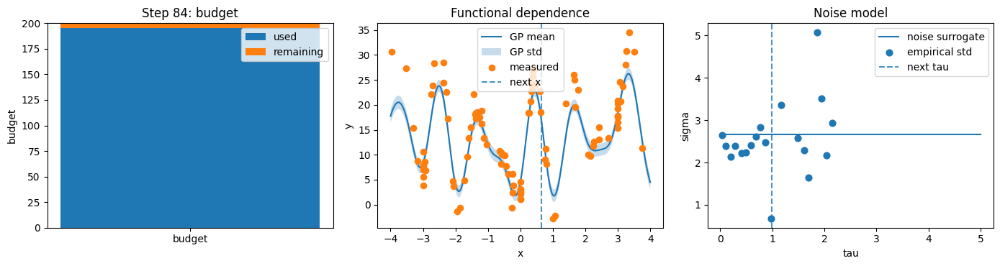

Measured y       : 16.0591

STEP 85
Current position : 0.656
Remaining budget : 2.719
Best action      : x=0.607, tau=0.090
Step cost        : 0.139
Rollout score    : 0.5225


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


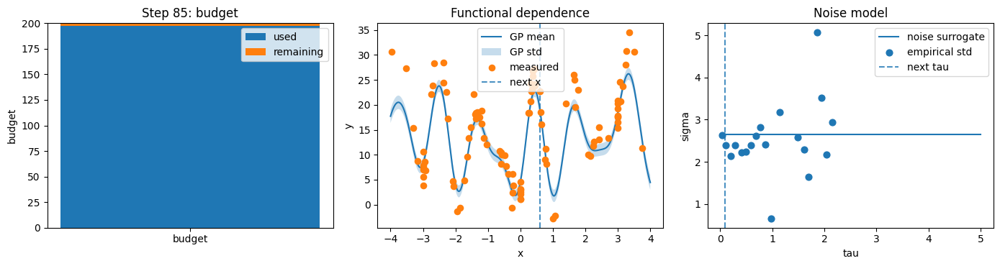

Measured y       : 16.0056


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 86
Current position : 0.607
Remaining budget : 2.579
Best action      : x=-0.363, tau=0.087
Step cost        : 1.057
Rollout score    : 0.6273


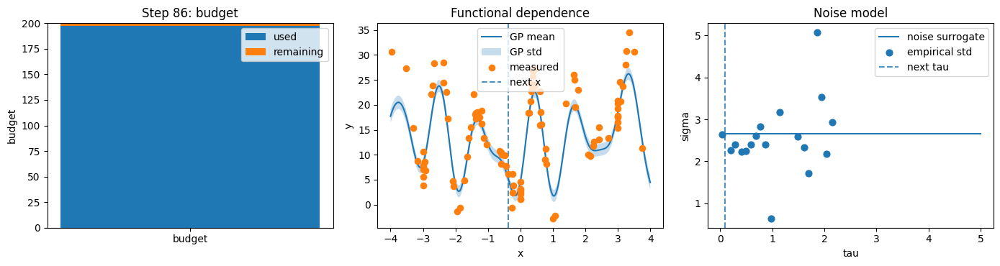

Measured y       : 4.8982

STEP 87
Current position : -0.363
Remaining budget : 1.523
Best action      : x=0.611, tau=0.379
Step cost        : 1.352
Rollout score    : 0.1622


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


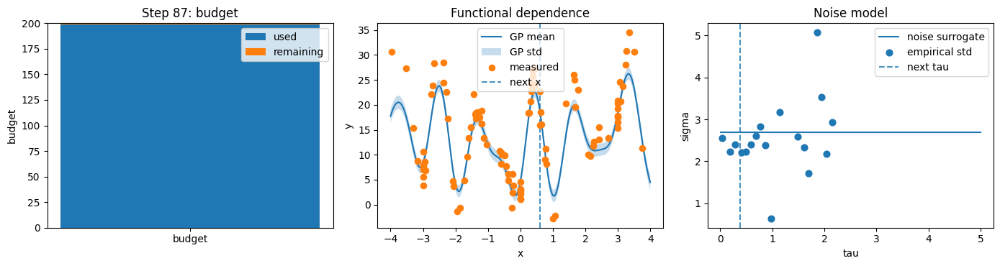

Measured y       : 20.5610
No feasible action found. Stopping.


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


In [ ]:
history = []
step_id = 0

while B_remain > tau_min:

    # ---------------------------------------------
    # update noise model from GP residuals
    # ---------------------------------------------
    sigma_fn, tau_rep, sigma_rep, resid, y_fit = fit_noise_surrogate_from_residuals(
        x_data=x_data,
        tau_data=tau_data,
        y_data=y_data,
        gp_predict=gp_predict,
        tau_tol=0.15,
        min_repeats=3,
        training_iter=15,
        lr=0.1
    )

    # ---------------------------------------------
    # choose next action by rollout
    # ---------------------------------------------
    best_action, best_score, diag = select_action_rollout(
        x_current=x_current,
        B_remain=B_remain,
        x_data=x_data,
        tau_data=tau_data,
        y_data=y_data,
        sigma_fn=sigma_fn,
        gp_predict=gp_predict,
        x_min=x_min, x_max=x_max,
        tau_min=tau_min, tau_max=tau_max,
        depth=3,
        n_mc_root=10,
        n_mc_roll=10,
        gamma=0.9,
        training_iter=10,
        lr=0.1,
        lam_cost=0.2,
        w_signal=1.0,
        w_noise=0.6
    )

    if best_action is None:
        print("No feasible action found. Stopping.")
        break

    x_next, tau_next = best_action
    step_cost = abs(x_next - x_current) + tau_next

    if step_cost > B_remain:
        print("Selected action exceeds remaining budget. Stopping.")
        break

    print("\n" + "="*60)
    print(f"STEP {step_id}")
    print("="*60)
    print(f"Current position : {x_current:.3f}")
    print(f"Remaining budget : {B_remain:.3f}")
    print(f"Best action      : x={x_next:.3f}, tau={tau_next:.3f}")
    print(f"Step cost        : {step_cost:.3f}")
    print(f"Rollout score    : {best_score:.4f}")

    plot_campaign_state(
        step_id=step_id,
        B_total=B_total,
        B_remain=B_remain,
        x_data=x_data,
        tau_data=tau_data,
        y_data=y_data,
        sigma_fn=sigma_fn,
        tau_rep=tau_rep,
        sigma_rep=sigma_rep,
        gp_predict=gp_predict,
        x_min=x_min, x_max=x_max,
        tau_min=tau_min, tau_max=tau_max,
        training_iter=10,
        lr=0.1,
        best_action=best_action
    )

    # perform measurement
    y_next = meas_sim.measure(np.array([[x_next, tau_next]]))[0]

    print(f"Measured y       : {y_next:.4f}")

    # update dataset
    x_data = np.append(x_data, x_next)
    tau_data = np.append(tau_data, tau_next)
    y_data = np.append(y_data, y_next)

    # update state
    B_remain -= step_cost
    x_current = x_next

    history.append({
        "step": step_id,
        "x": x_next,
        "tau": tau_next,
        "y": y_next,
        "cost": step_cost,
        "budget_left": B_remain,
        "score": best_score
    })

    step_id += 1

    if B_remain <= tau_min:
        break

In [ ]:
# binned noise

In [ ]:
import numpy as np

def fit_noise_surrogate_binned(
    tau_data,
    y_like_data,
    tau_min,
    tau_max,
    n_bins=30,
    min_repeats=3
):
    """
    Fit sigma(tau) = a / sqrt(tau) + b
    using std computed inside tau bins.

    Parameters
    ----------
    tau_data : array
        Acquisition times.
    y_like_data : array
        Values used to estimate noise in each tau bin.
        Best choice: residuals y - GP_mean(x).
    tau_min, tau_max : float
        Tau range.
    n_bins : int
        Number of tau bins.
    min_repeats : int
        Minimum number of points in a bin to estimate std.

    Returns
    -------
    sigma_fn : callable
        Predicted noise std as a function of tau.
    tau_rep : array
        Bin centers used for fitting.
    sigma_rep : array
        Empirical std values in those bins.
    """
    tau_data = np.asarray(tau_data, dtype=float)
    y_like_data = np.asarray(y_like_data, dtype=float)

    edges = np.linspace(tau_min, tau_max, n_bins + 1)
    centers = 0.5 * (edges[:-1] + edges[1:])

    tau_rep = []
    sigma_rep = []

    for i in range(n_bins):
        if i < n_bins - 1:
            mask = (tau_data >= edges[i]) & (tau_data < edges[i + 1])
        else:
            mask = (tau_data >= edges[i]) & (tau_data <= edges[i + 1])

        yy = y_like_data[mask]

        if len(yy) >= min_repeats:
            tau_rep.append(centers[i])
            sigma_rep.append(np.std(yy, ddof=1))

    tau_rep = np.asarray(tau_rep, dtype=float)
    sigma_rep = np.asarray(sigma_rep, dtype=float)

    # fallback if not enough bins are populated
    if len(tau_rep) < 2:
        def sigma_fn(tau):
            tau = np.asarray(tau, dtype=float)
            return 0.2 / np.sqrt(np.maximum(tau, 1e-8)) + 0.05
        return sigma_fn, tau_rep, sigma_rep

    A = np.column_stack([
        1 / np.sqrt(np.maximum(tau_rep, 1e-8)),
        np.ones_like(tau_rep)
    ])
    coeff, _, _, _ = np.linalg.lstsq(A, sigma_rep, rcond=None)
    a, b = coeff

    a = max(a, 0.0)
    b = max(b, 1e-6)

    def sigma_fn(tau):
        tau = np.asarray(tau, dtype=float)
        return a / np.sqrt(np.maximum(tau, 1e-8)) + b

    return sigma_fn, tau_rep, sigma_rep

In [ ]:
import matplotlib.pyplot as plt

def plot_campaign_state(
    step_id,
    B_total,
    B_remain,
    x_data,
    tau_data,
    y_data,
    sigma_fn,
    tau_rep,
    sigma_rep,
    gp_predict,
    x_min, x_max,
    tau_min, tau_max,
    training_iter=100,
    lr=0.1,
    best_action=None
):
    fig, ax = plt.subplots(1, 3, figsize=(14, 3.8))

    # budget
    used = B_total - B_remain
    ax[0].bar([0], [used], label='used')
    ax[0].bar([0], [B_remain], bottom=[used], label='remaining')
    ax[0].set_ylim(0, B_total)
    ax[0].set_xticks([0])
    ax[0].set_xticklabels(['budget'])
    ax[0].set_ylabel('budget')
    ax[0].set_title(f'Step {step_id}: budget')
    ax[0].legend()

    # GP prediction for f(x)
    x_plot = np.linspace(x_min, x_max, 300)
    y_mean_plot, y_std_plot = gp_predict(
        x_train=x_data,
        y_train=y_data,
        x_test=x_plot,
        training_iter=training_iter,
        lr=lr
    )

    ax[1].plot(x_plot, y_mean_plot, label='GP mean')
    ax[1].fill_between(
        x_plot,
        y_mean_plot - y_std_plot,
        y_mean_plot + y_std_plot,
        alpha=0.25,
        label='GP std'
    )
    ax[1].scatter(x_data, y_data, s=35, zorder=3, label='measured')

    if best_action is not None:
        ax[1].axvline(best_action[0], ls='--', alpha=0.8, label='next x')

    ax[1].set_xlabel('x')
    ax[1].set_ylabel('y')
    ax[1].set_title('Functional dependence')
    ax[1].legend()

    # noise model
    tau_plot = np.linspace(tau_min, tau_max, 300)
    sigma_plot = sigma_fn(tau_plot)

    ax[2].plot(tau_plot, sigma_plot, label='noise surrogate')
    if len(tau_rep) > 0:
        ax[2].scatter(tau_rep, sigma_rep, s=40, zorder=3, label='empirical std')

    if best_action is not None:
        ax[2].axvline(best_action[1], ls='--', alpha=0.8, label='next tau')

    ax[2].set_xlabel('tau')
    ax[2].set_ylabel('sigma')
    ax[2].set_title('Noise model')
    ax[2].legend()

    plt.tight_layout()
    plt.show()


STEP 0
Current position : 3.000
Remaining budget : 175.910
Best action      : x=2.290, tau=3.838
Step cost        : 4.548
Rollout score    : 1.3889
Noise bins used  : 2


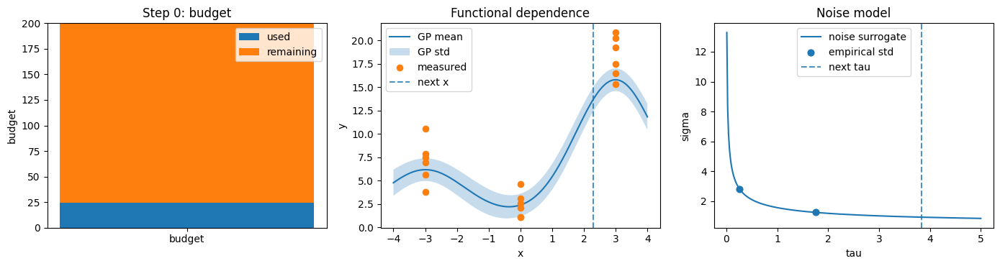

Measured y       : 11.2408


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 1
Current position : 2.290
Remaining budget : 171.362
Best action      : x=2.081, tau=1.255
Step cost        : 1.464
Rollout score    : 1.4494
Noise bins used  : 2


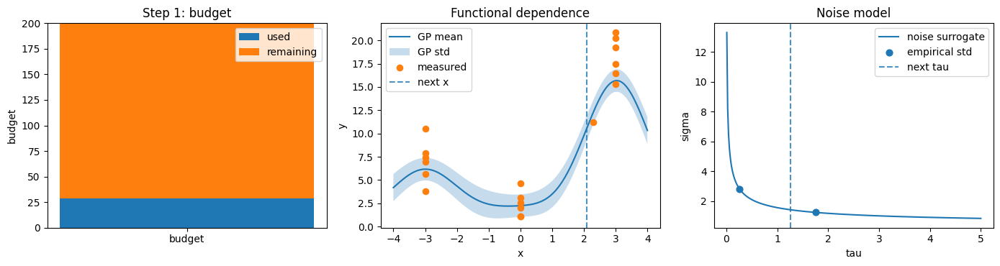

Measured y       : 11.1642


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 2
Current position : 2.081
Remaining budget : 169.898
Best action      : x=1.216, tau=1.139
Step cost        : 2.004
Rollout score    : 1.0591
Noise bins used  : 2


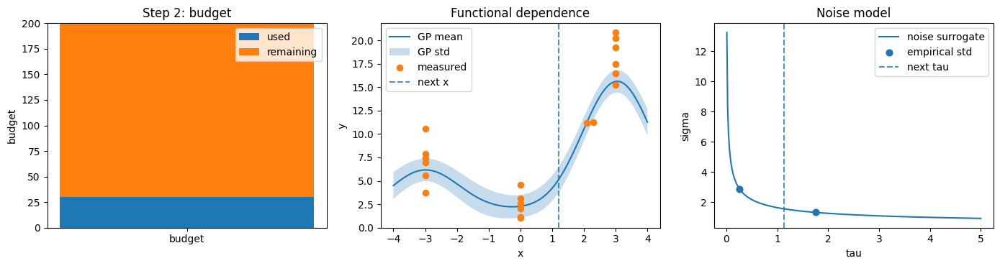

Measured y       : -0.8536


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 3
Current position : 1.216
Remaining budget : 167.894
Best action      : x=1.192, tau=1.923
Step cost        : 1.948
Rollout score    : 1.5986
Noise bins used  : 2


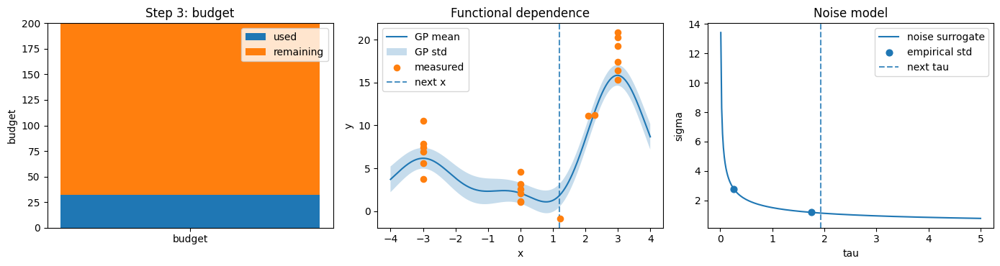

Measured y       : 2.2066


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 4
Current position : 1.192
Remaining budget : 165.946
Best action      : x=0.570, tau=2.691
Step cost        : 3.313
Rollout score    : 1.8422
Noise bins used  : 2


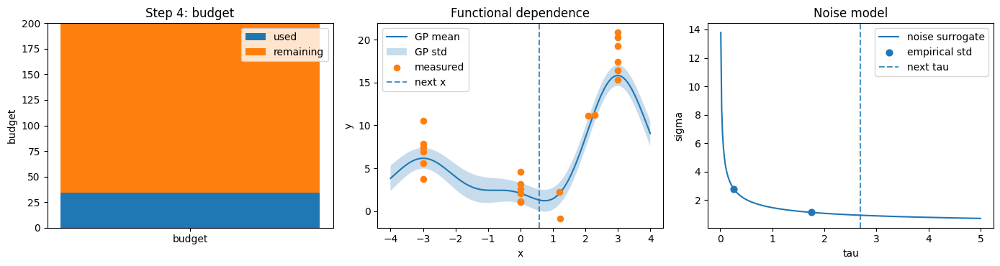

Measured y       : 23.7594


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 5
Current position : 0.570
Remaining budget : 162.634
Best action      : x=-0.777, tau=3.138
Step cost        : 4.485
Rollout score    : 1.9379
Noise bins used  : 2


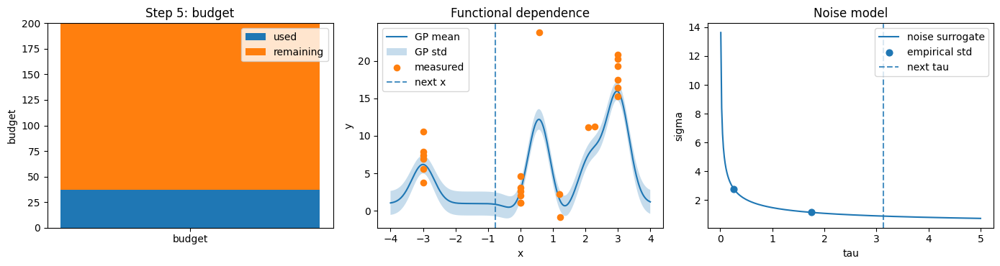

Measured y       : 13.0979


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 6
Current position : -0.777
Remaining budget : 158.149
Best action      : x=0.181, tau=4.232
Step cost        : 5.190
Rollout score    : 2.0802
Noise bins used  : 2


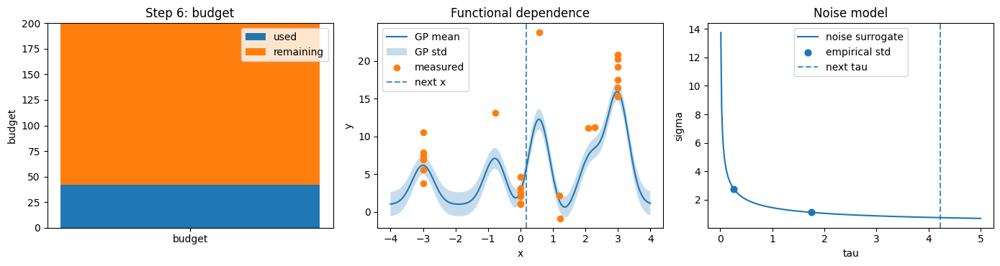

Measured y       : 14.3168


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 7
Current position : 0.181
Remaining budget : 152.959
Best action      : x=-0.302, tau=1.736
Step cost        : 2.220
Rollout score    : 1.3096
Noise bins used  : 2


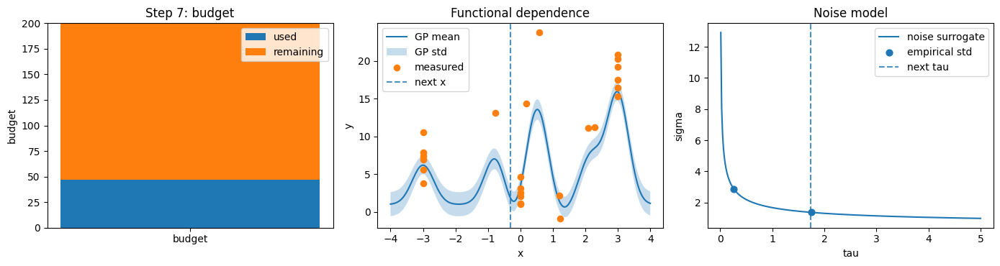

Measured y       : 3.4084


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 8
Current position : -0.302
Remaining budget : 150.739
Best action      : x=-2.108, tau=2.398
Step cost        : 4.204
Rollout score    : 1.1036
Noise bins used  : 2


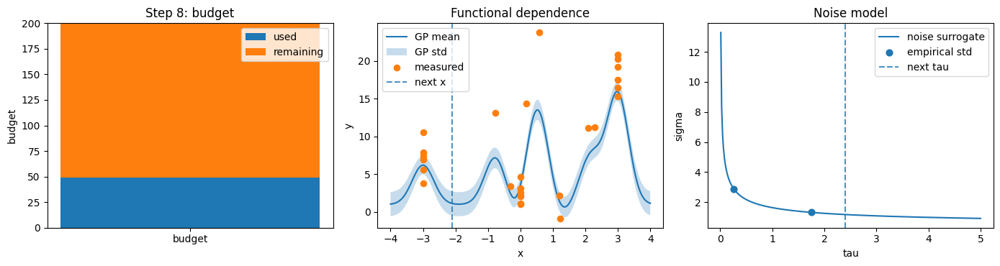

Measured y       : 9.1287


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 9
Current position : -2.108
Remaining budget : 146.535
Best action      : x=-1.796, tau=3.536
Step cost        : 3.848
Rollout score    : 1.1325
Noise bins used  : 2


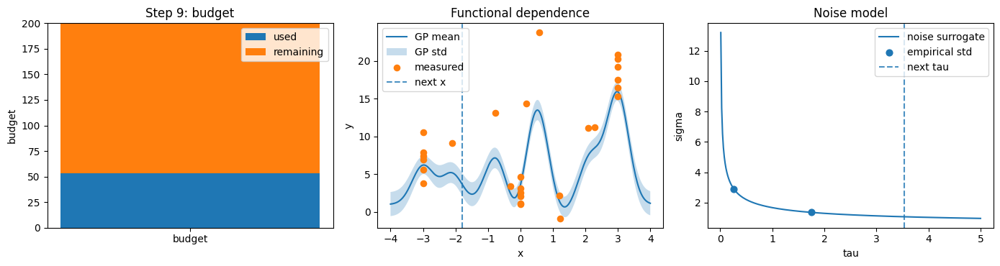

Measured y       : 3.3710


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 10
Current position : -1.796
Remaining budget : 142.687
Best action      : x=-2.525, tau=0.837
Step cost        : 1.566
Rollout score    : 1.1235
Noise bins used  : 2


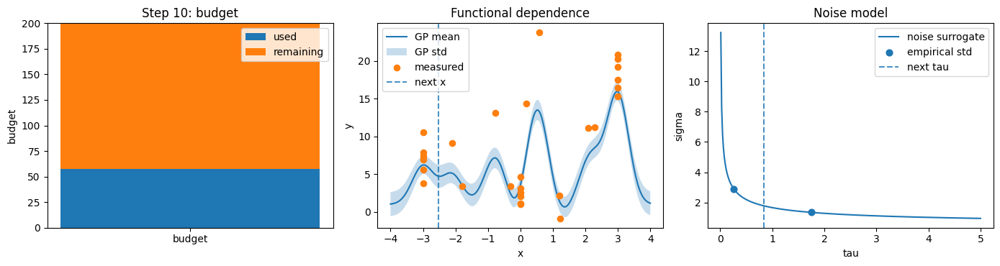

Measured y       : 32.9659


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 11
Current position : -2.525
Remaining budget : 141.121
Best action      : x=-3.184, tau=1.624
Step cost        : 2.283
Rollout score    : 1.1605
Noise bins used  : 2


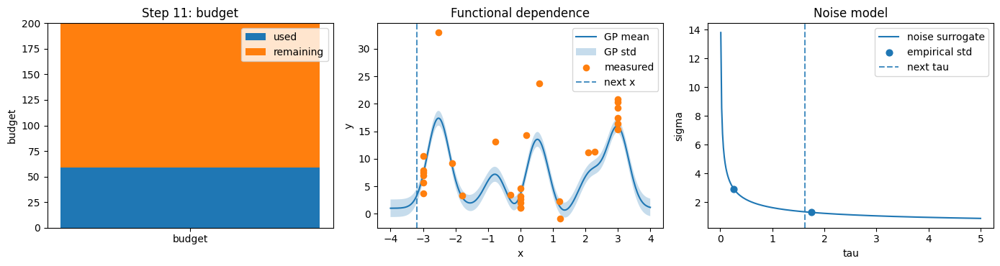

Measured y       : 8.3894


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 12
Current position : -3.184
Remaining budget : 138.838
Best action      : x=-3.892, tau=2.549
Step cost        : 3.257
Rollout score    : 0.9325
Noise bins used  : 2


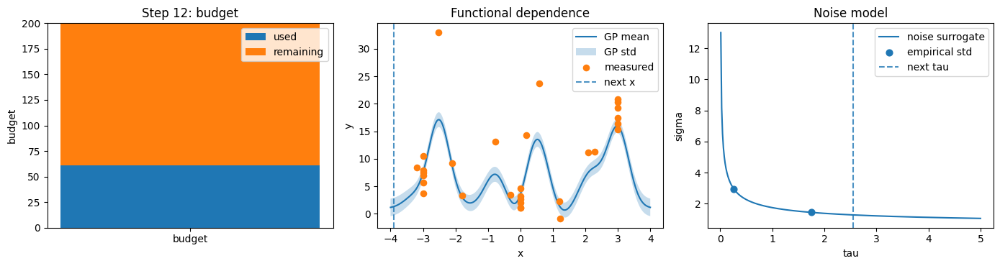

Measured y       : 28.1611


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 13
Current position : -3.892
Remaining budget : 135.581
Best action      : x=-3.809, tau=4.451
Step cost        : 4.535
Rollout score    : 0.8883
Noise bins used  : 2


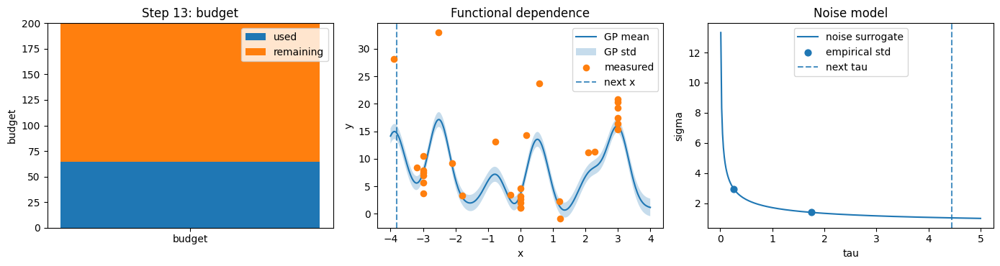

Measured y       : 28.4966


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 14
Current position : -3.809
Remaining budget : 131.046
Best action      : x=-3.537, tau=0.339
Step cost        : 0.612
Rollout score    : 0.9630
Noise bins used  : 2


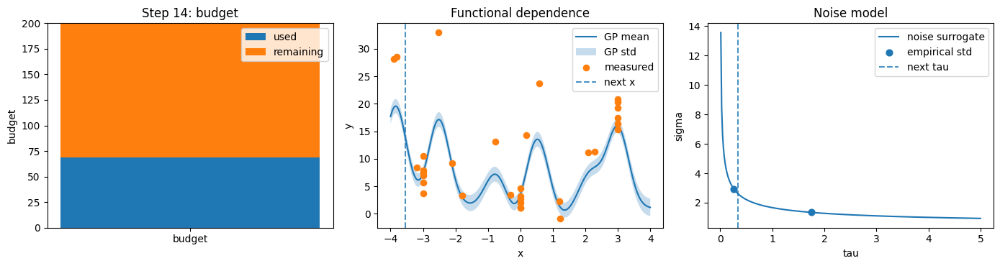

Measured y       : 30.9232


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 15
Current position : -3.537
Remaining budget : 130.435
Best action      : x=-1.670, tau=1.754
Step cost        : 3.621
Rollout score    : 0.3589
Noise bins used  : 2


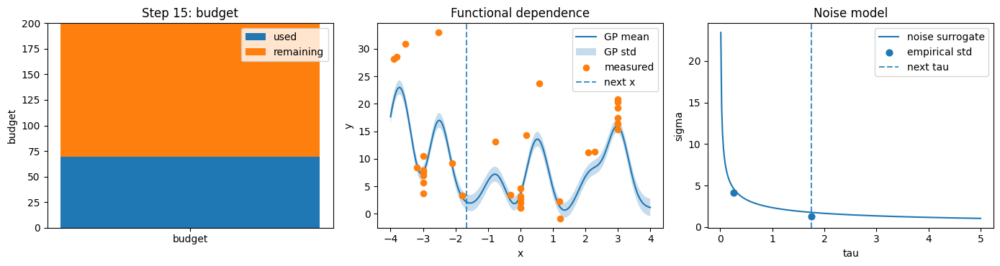

Measured y       : 5.3804


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 16
Current position : -1.670
Remaining budget : 126.814
Best action      : x=-1.271, tau=1.943
Step cost        : 2.342
Rollout score    : 0.6174
Noise bins used  : 2


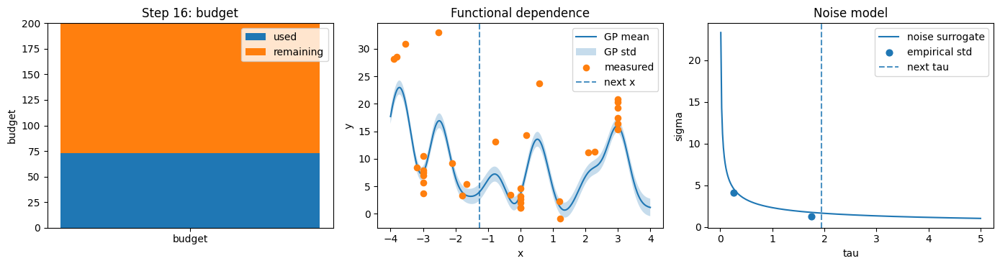

Measured y       : 17.8086


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 17
Current position : -1.271
Remaining budget : 124.472
Best action      : x=-2.000, tau=2.707
Step cost        : 3.436
Rollout score    : 0.1929
Noise bins used  : 2


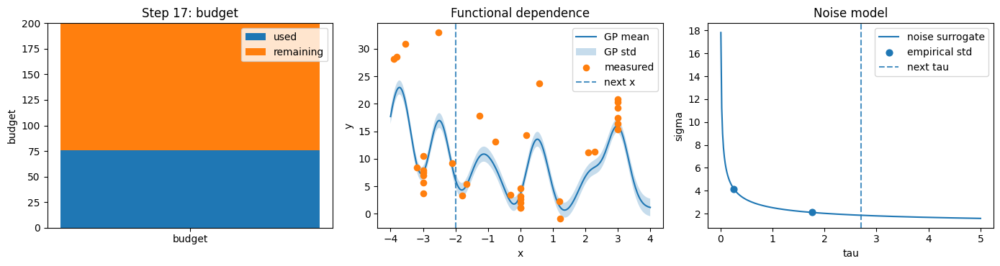

Measured y       : 1.8897


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 18
Current position : -2.000
Remaining budget : 121.036
Best action      : x=-2.868, tau=0.016
Step cost        : 0.885
Rollout score    : 0.2092
Noise bins used  : 3


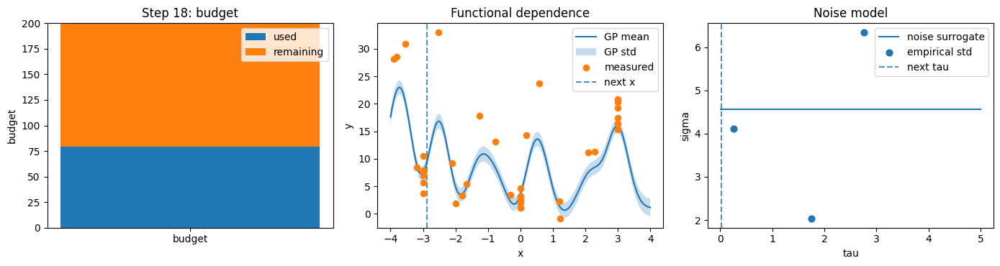

Measured y       : 15.6189


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 19
Current position : -2.868
Remaining budget : 120.151
Best action      : x=-3.896, tau=0.361
Step cost        : 1.389
Rollout score    : -0.2205
Noise bins used  : 3


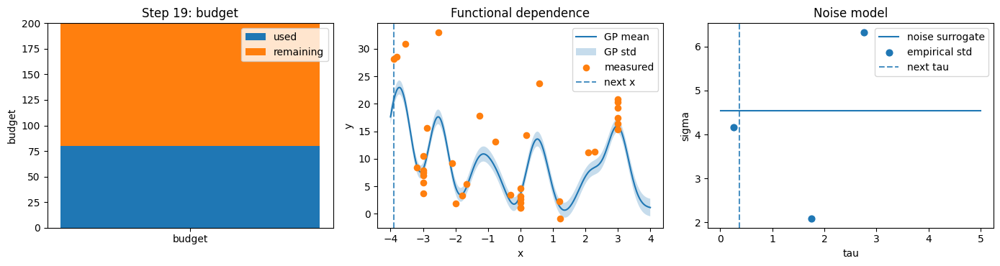

Measured y       : 32.7513


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 20
Current position : -3.896
Remaining budget : 118.763
Best action      : x=-3.940, tau=0.535
Step cost        : 0.580
Rollout score    : 0.1274
Noise bins used  : 3


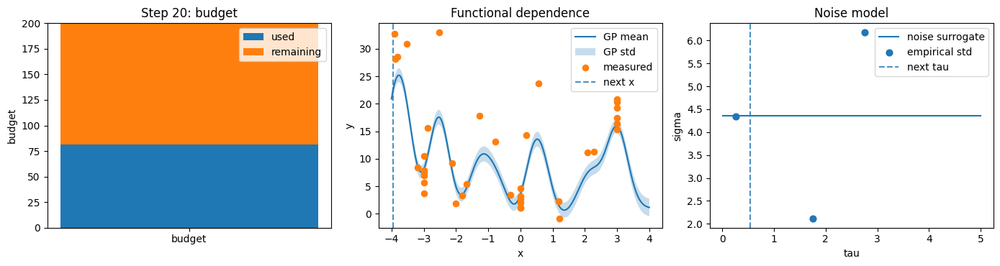

Measured y       : 30.1599


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 21
Current position : -3.940
Remaining budget : 118.183
Best action      : x=-1.338, tau=0.076
Step cost        : 2.678
Rollout score    : -0.1857
Noise bins used  : 3


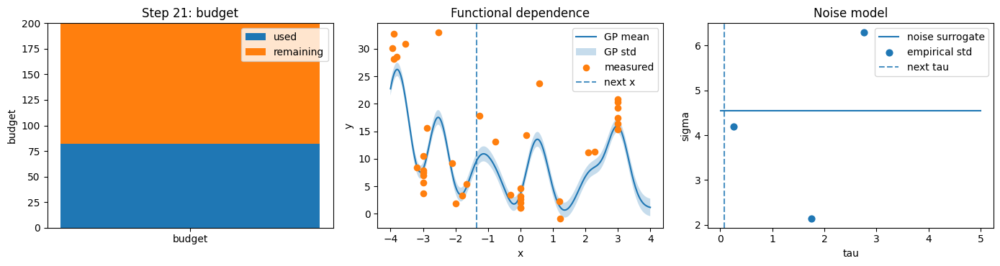

Measured y       : 18.1254


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 22
Current position : -1.338
Remaining budget : 115.504
Best action      : x=-0.317, tau=1.305
Step cost        : 2.325
Rollout score    : -0.0759
Noise bins used  : 3


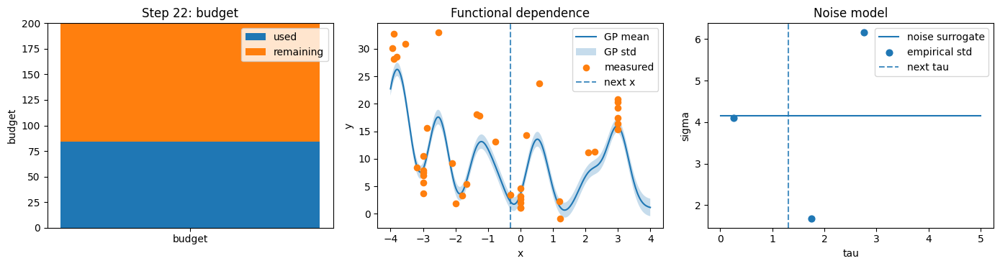

Measured y       : 5.2287


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 23
Current position : -0.317
Remaining budget : 113.179
Best action      : x=-0.119, tau=0.736
Step cost        : 0.934
Rollout score    : 0.2784
Noise bins used  : 4


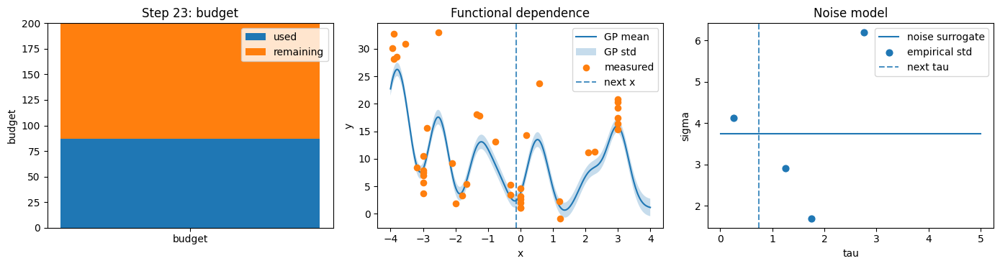

Measured y       : -2.0891


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 24
Current position : -0.119
Remaining budget : 112.245
Best action      : x=-1.688, tau=0.205
Step cost        : 1.774
Rollout score    : -0.0776
Noise bins used  : 5


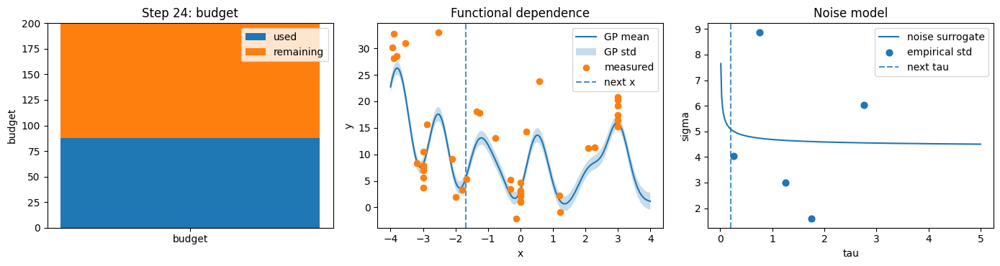

Measured y       : 11.0993


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 25
Current position : -1.688
Remaining budget : 110.472
Best action      : x=-1.599, tau=0.740
Step cost        : 0.829
Rollout score    : 0.1235
Noise bins used  : 5


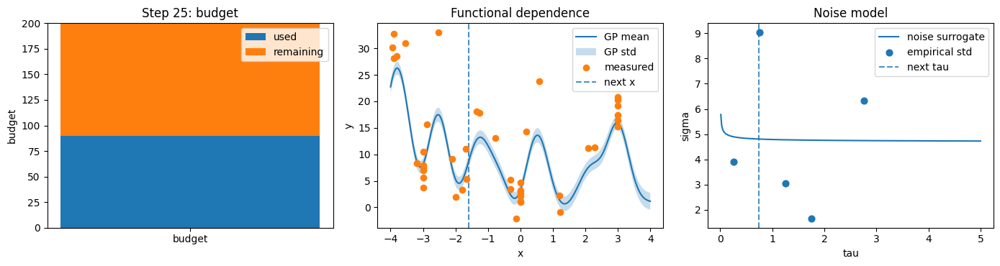

Measured y       : 11.8314


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 26
Current position : -1.599
Remaining budget : 109.642
Best action      : x=-1.774, tau=0.314
Step cost        : 0.490
Rollout score    : -0.0942
Noise bins used  : 5


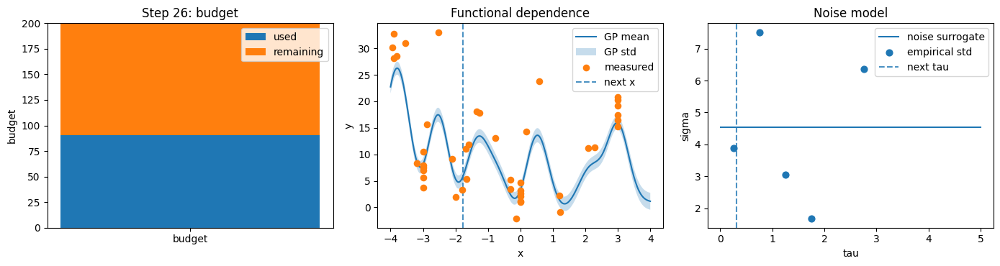

Measured y       : 1.4650


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 27
Current position : -1.774
Remaining budget : 109.153
Best action      : x=-1.212, tau=2.332
Step cost        : 2.893
Rollout score    : -0.3158
Noise bins used  : 5


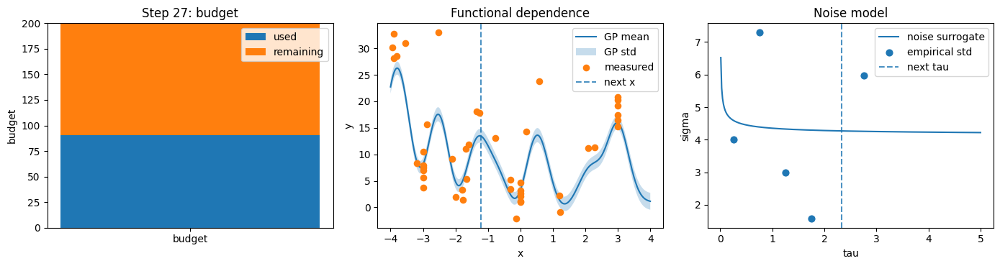

Measured y       : 16.3874


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 28
Current position : -1.212
Remaining budget : 106.259
Best action      : x=-0.882, tau=0.831
Step cost        : 1.162
Rollout score    : -0.2042
Noise bins used  : 5


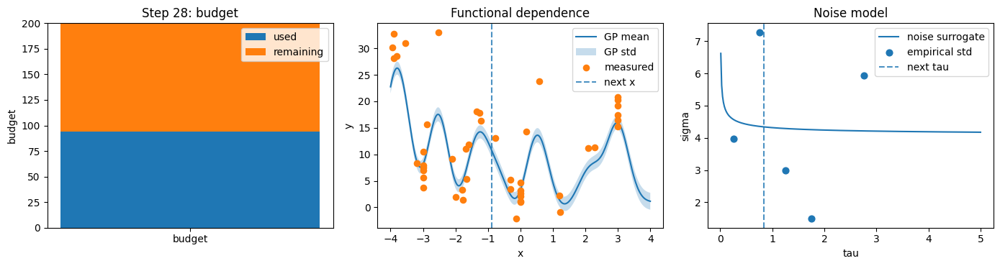

Measured y       : 11.5530


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 29
Current position : -0.882
Remaining budget : 105.098
Best action      : x=-0.669, tau=1.003
Step cost        : 1.216
Rollout score    : 0.1207
Noise bins used  : 5


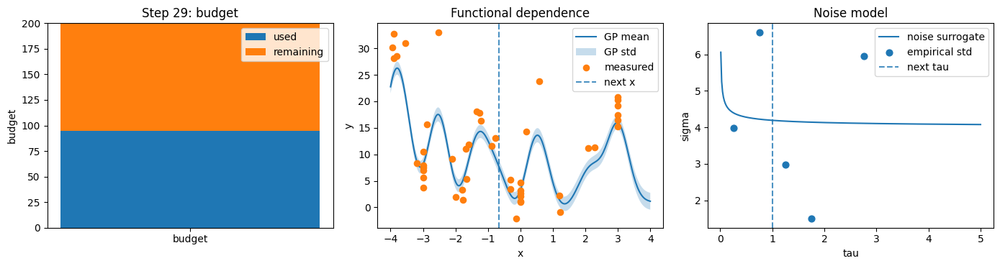

Measured y       : 11.3959


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 30
Current position : -0.669
Remaining budget : 103.882
Best action      : x=-1.296, tau=1.075
Step cost        : 1.703
Rollout score    : -0.2149
Noise bins used  : 5


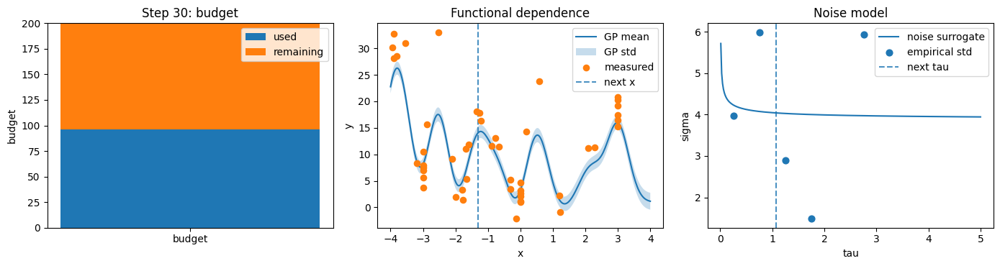

Measured y       : 22.4844


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 31
Current position : -1.296
Remaining budget : 102.179
Best action      : x=-2.854, tau=0.403
Step cost        : 1.962
Rollout score    : 0.0161
Noise bins used  : 5


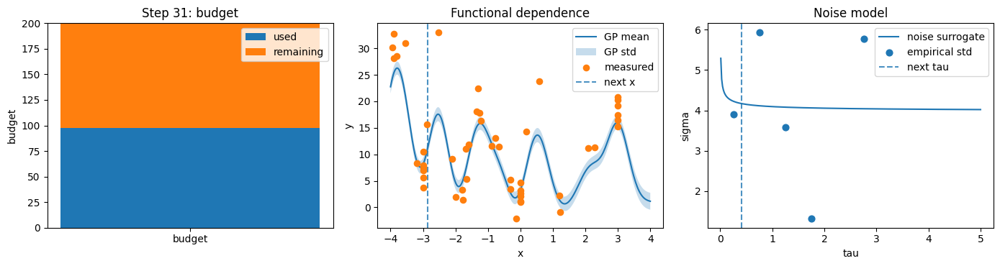

Measured y       : 12.3193


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 32
Current position : -2.854
Remaining budget : 100.217
Best action      : x=-2.010, tau=1.016
Step cost        : 1.861
Rollout score    : -0.2679
Noise bins used  : 5


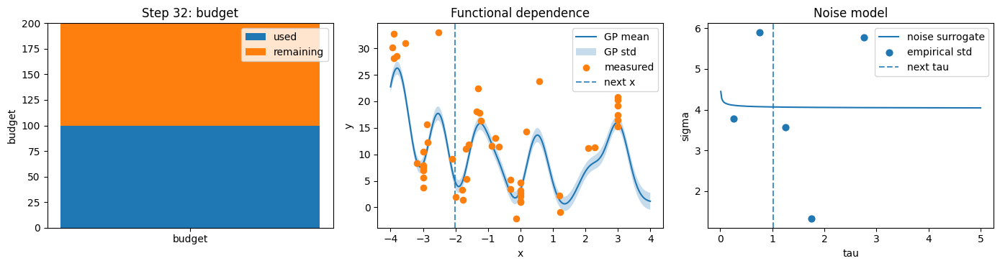

Measured y       : 2.1266


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 33
Current position : -2.010
Remaining budget : 98.357
Best action      : x=-2.080, tau=0.790
Step cost        : 0.860
Rollout score    : 0.0235
Noise bins used  : 5


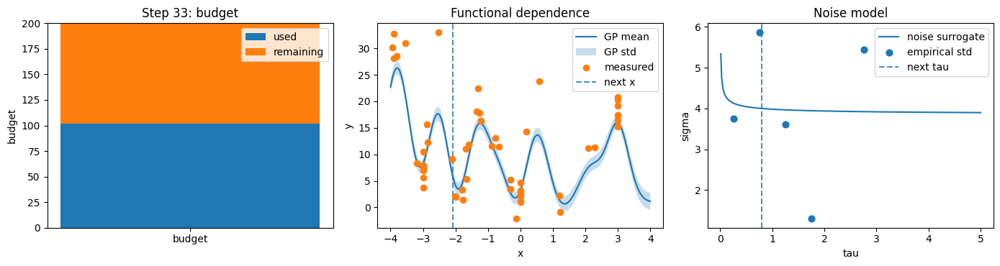

Measured y       : 5.7587


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 34
Current position : -2.080
Remaining budget : 97.496
Best action      : x=-3.078, tau=0.761
Step cost        : 1.759
Rollout score    : 0.0148
Noise bins used  : 5


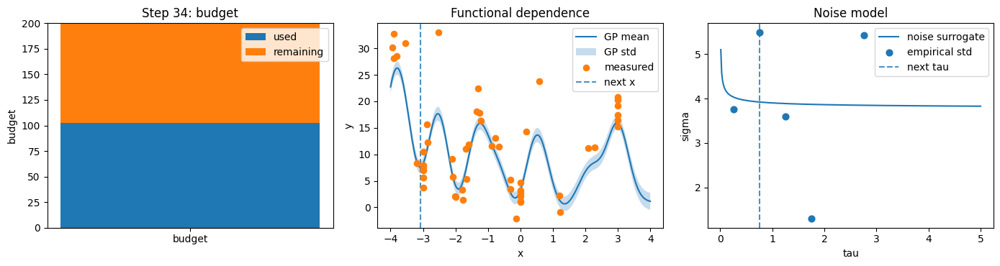

Measured y       : 5.9228


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 35
Current position : -3.078
Remaining budget : 95.737
Best action      : x=-0.924, tau=1.751
Step cost        : 3.905
Rollout score    : -0.3570
Noise bins used  : 5


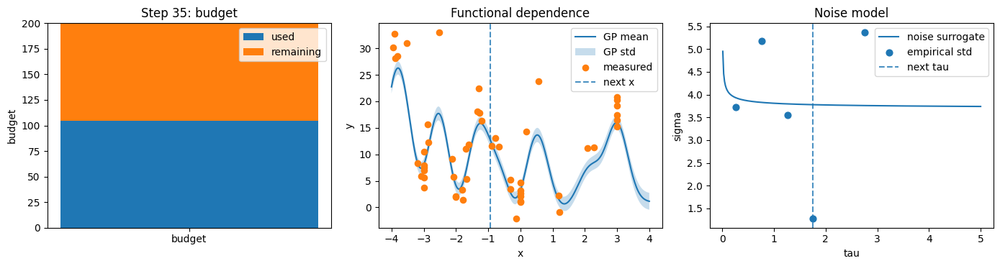

Measured y       : 11.8850


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 36
Current position : -0.924
Remaining budget : 91.832
Best action      : x=-1.152, tau=0.304
Step cost        : 0.531
Rollout score    : -0.0647
Noise bins used  : 5


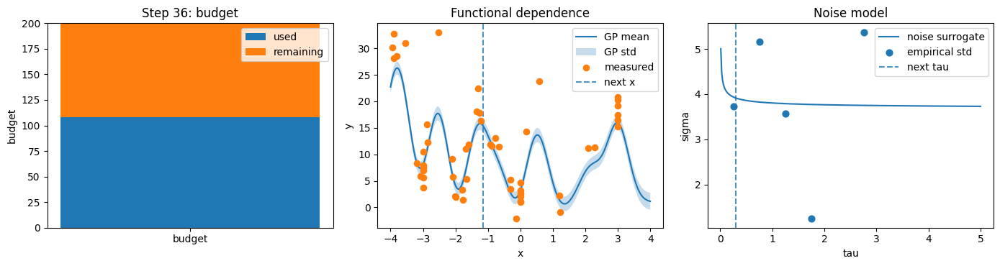

Measured y       : 14.5311


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 37
Current position : -1.152
Remaining budget : 91.300
Best action      : x=-0.721, tau=1.847
Step cost        : 2.278
Rollout score    : 0.0096
Noise bins used  : 5


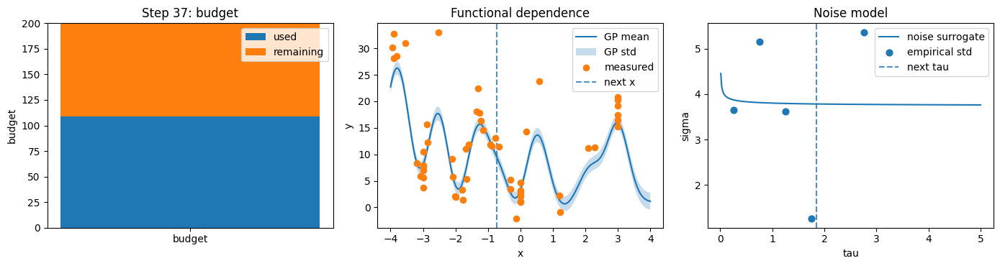

Measured y       : 11.2859


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 38
Current position : -0.721
Remaining budget : 89.022
Best action      : x=-1.306, tau=0.729
Step cost        : 1.313
Rollout score    : 0.0414
Noise bins used  : 5


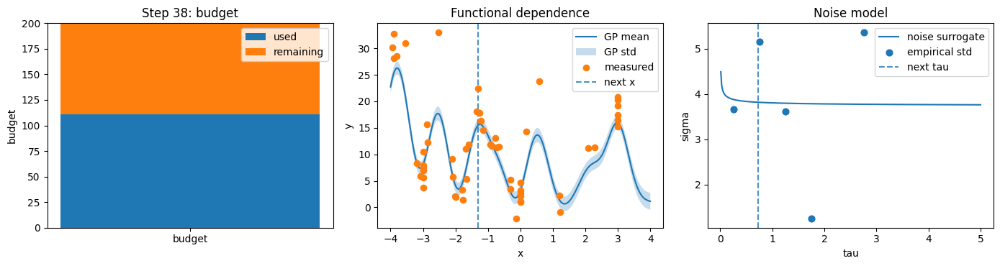

Measured y       : 17.0432


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 39
Current position : -1.306
Remaining budget : 87.709
Best action      : x=-1.284, tau=1.825
Step cost        : 1.847
Rollout score    : -0.1649
Noise bins used  : 5


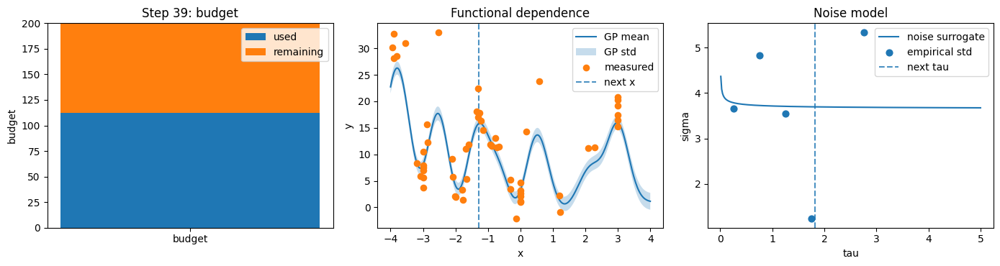

Measured y       : 16.5127


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 40
Current position : -1.284
Remaining budget : 85.863
Best action      : x=-1.176, tau=2.441
Step cost        : 2.549
Rollout score    : -0.3087
Noise bins used  : 5


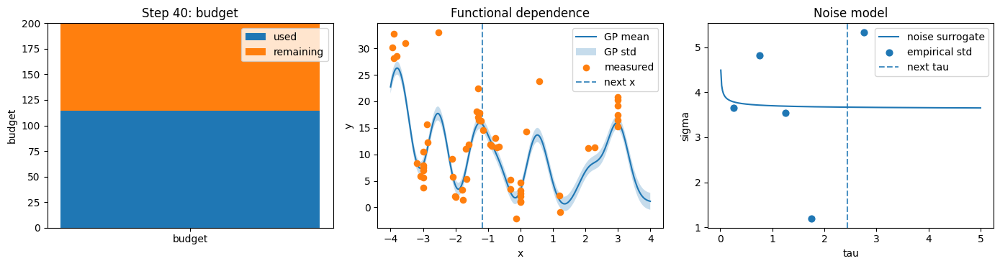

Measured y       : 16.5707


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 41
Current position : -1.176
Remaining budget : 83.314
Best action      : x=-0.228, tau=2.384
Step cost        : 3.332
Rollout score    : -0.1228
Noise bins used  : 6


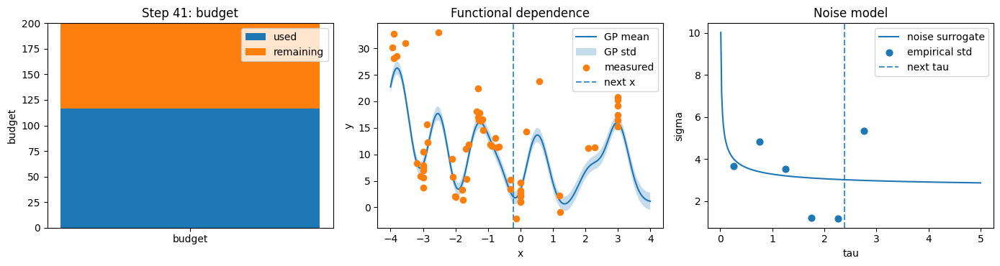

Measured y       : 2.6554


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 42
Current position : -0.228
Remaining budget : 79.981
Best action      : x=0.627, tau=0.349
Step cost        : 1.204
Rollout score    : 0.2290
Noise bins used  : 6


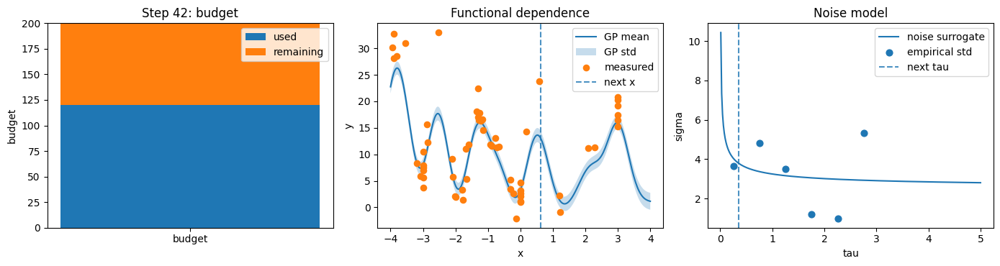

Measured y       : 17.3248


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 43
Current position : 0.627
Remaining budget : 78.778
Best action      : x=2.953, tau=0.571
Step cost        : 2.897
Rollout score    : -0.0351
Noise bins used  : 6


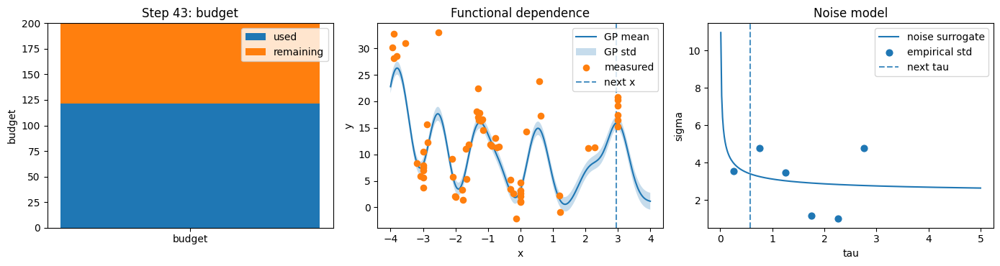

Measured y       : 14.5114


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 44
Current position : 2.953
Remaining budget : 75.881
Best action      : x=1.555, tau=0.348
Step cost        : 1.746
Rollout score    : 0.3211
Noise bins used  : 6


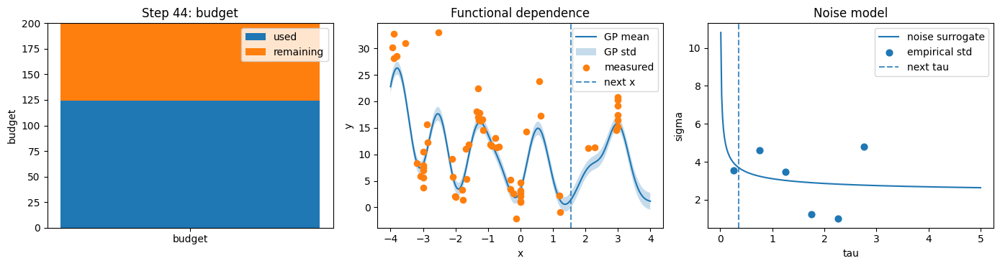

Measured y       : 22.9926


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 45
Current position : 1.555
Remaining budget : 74.135
Best action      : x=2.239, tau=1.479
Step cost        : 2.163
Rollout score    : -0.0325
Noise bins used  : 6


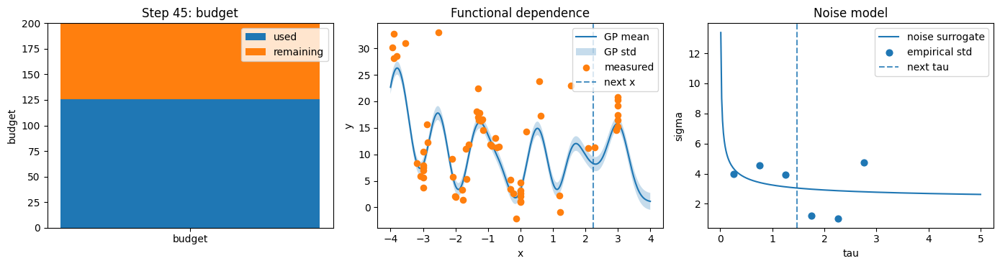

Measured y       : 10.1687


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 46
Current position : 2.239
Remaining budget : 71.972
Best action      : x=2.743, tau=2.756
Step cost        : 3.260
Rollout score    : 0.0082
Noise bins used  : 6


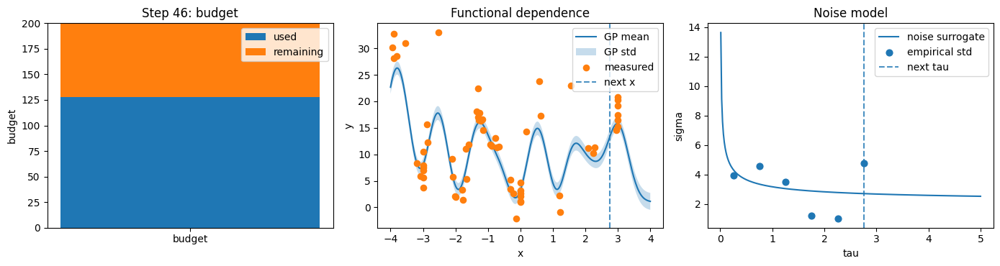

Measured y       : 11.8823


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 47
Current position : 2.743
Remaining budget : 68.712
Best action      : x=3.023, tau=0.474
Step cost        : 0.754
Rollout score    : 0.2406
Noise bins used  : 6


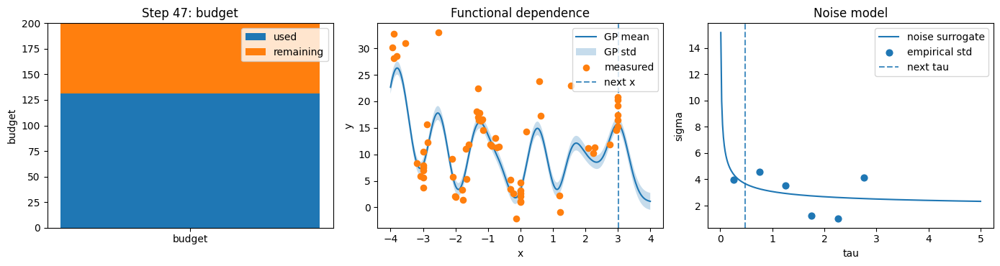

Measured y       : 21.2552


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 48
Current position : 3.023
Remaining budget : 67.958
Best action      : x=1.777, tau=1.748
Step cost        : 2.994
Rollout score    : -0.2272
Noise bins used  : 6


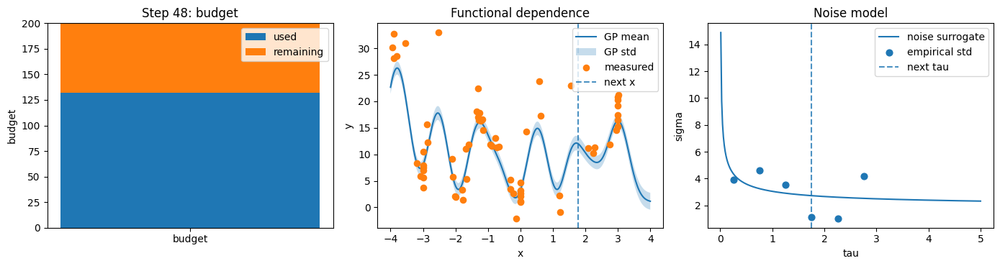

Measured y       : 21.5576


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 49
Current position : 1.777
Remaining budget : 64.965
Best action      : x=0.370, tau=0.444
Step cost        : 1.851
Rollout score    : 0.1735
Noise bins used  : 6


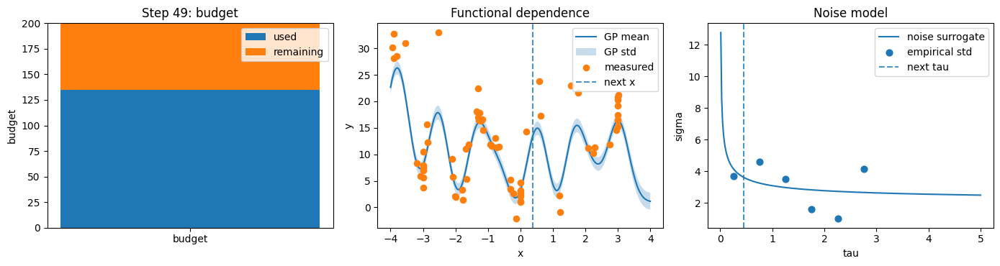

Measured y       : 22.2929


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 50
Current position : 0.370
Remaining budget : 63.113
Best action      : x=-1.549, tau=0.840
Step cost        : 2.759
Rollout score    : 0.0328
Noise bins used  : 6


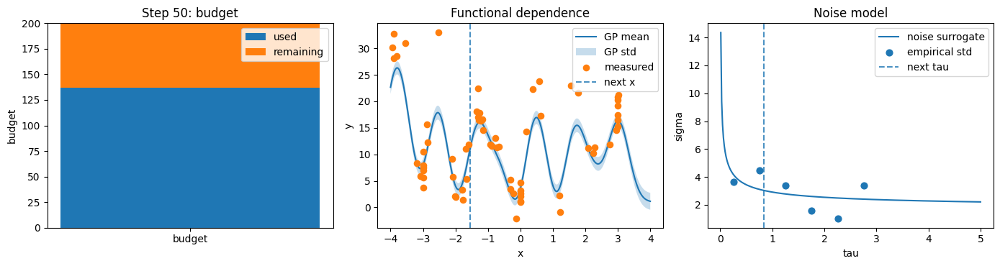

Measured y       : 15.0965


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 51
Current position : -1.549
Remaining budget : 60.355
Best action      : x=-2.297, tau=1.025
Step cost        : 1.774
Rollout score    : -0.0429
Noise bins used  : 6


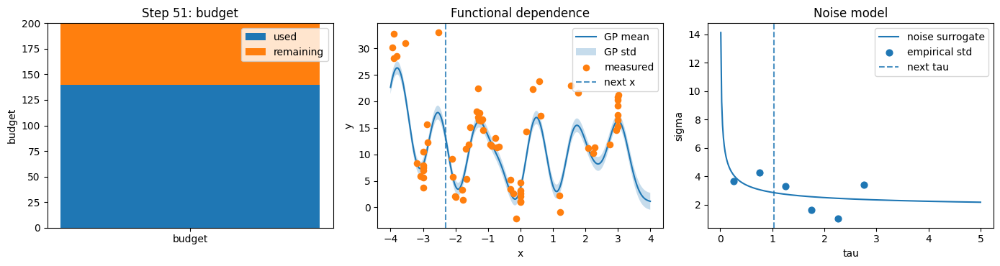

Measured y       : 22.1846


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 52
Current position : -2.297
Remaining budget : 58.581
Best action      : x=0.243, tau=0.347
Step cost        : 2.886
Rollout score    : -0.0259
Noise bins used  : 6


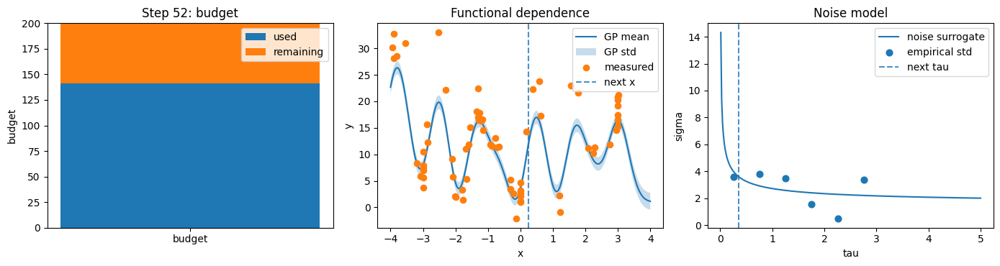

Measured y       : 17.1214


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 53
Current position : 0.243
Remaining budget : 55.695
Best action      : x=-1.180, tau=0.675
Step cost        : 2.098
Rollout score    : 0.0064
Noise bins used  : 6


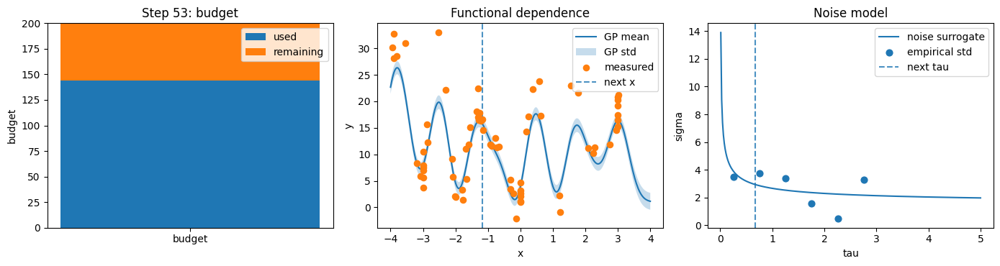

Measured y       : 17.1361


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 54
Current position : -1.180
Remaining budget : 53.597
Best action      : x=-2.774, tau=0.916
Step cost        : 2.509
Rollout score    : 0.0504
Noise bins used  : 6


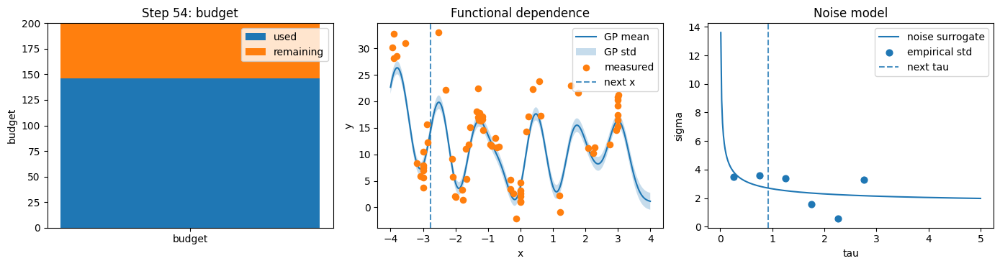

Measured y       : 21.6101


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 55
Current position : -2.774
Remaining budget : 51.087
Best action      : x=-0.747, tau=0.676
Step cost        : 2.702
Rollout score    : -0.0001
Noise bins used  : 6


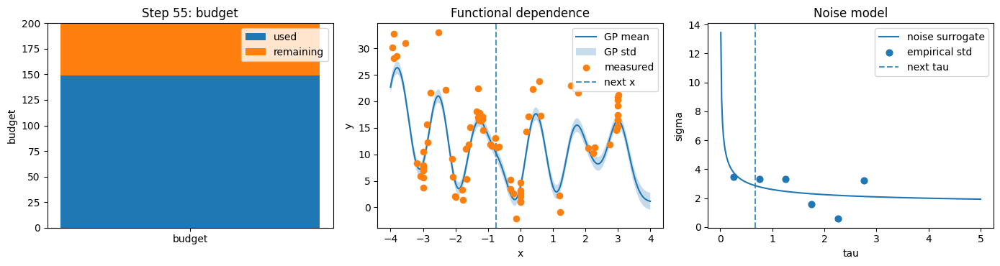

Measured y       : 15.0460


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 56
Current position : -0.747
Remaining budget : 48.385
Best action      : x=-1.666, tau=1.515
Step cost        : 2.434
Rollout score    : -0.0395
Noise bins used  : 6


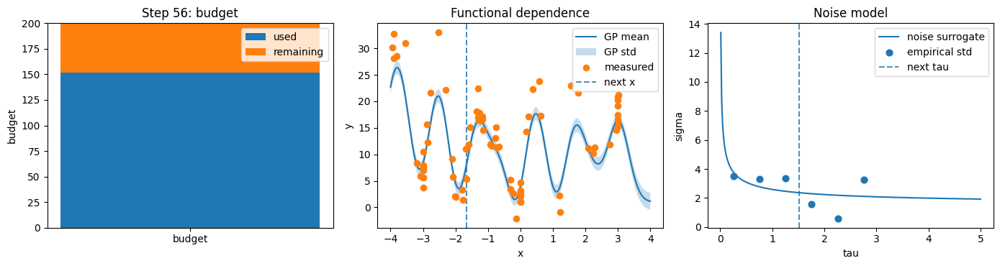

Measured y       : 10.9637


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 57
Current position : -1.666
Remaining budget : 45.951
Best action      : x=-2.042, tau=0.650
Step cost        : 1.026
Rollout score    : 0.3340
Noise bins used  : 6


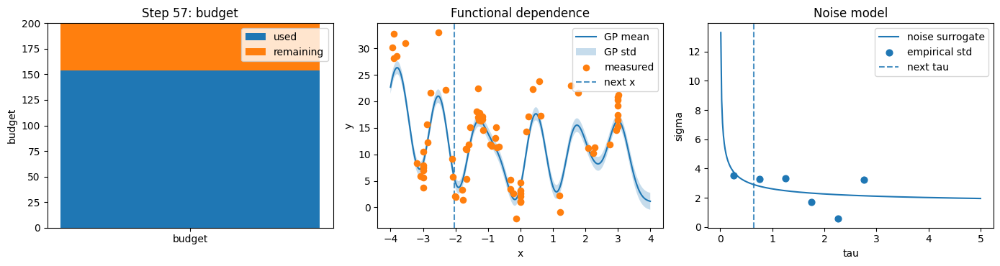

Measured y       : 3.0500


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 58
Current position : -2.042
Remaining budget : 44.925
Best action      : x=-3.103, tau=1.337
Step cost        : 2.397
Rollout score    : 0.2290
Noise bins used  : 6


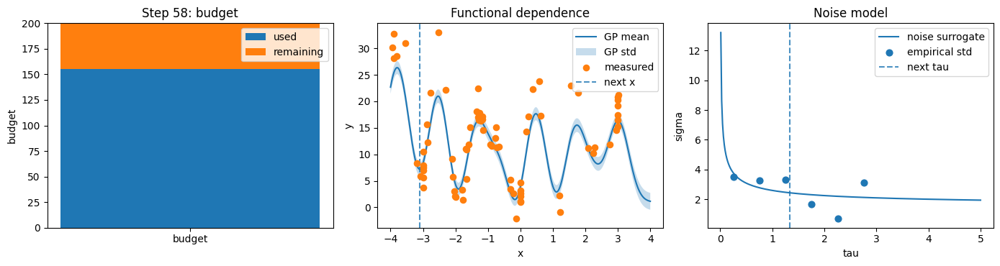

Measured y       : 5.3315


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 59
Current position : -3.103
Remaining budget : 42.528
Best action      : x=-3.322, tau=3.212
Step cost        : 3.432
Rollout score    : 0.1092
Noise bins used  : 6


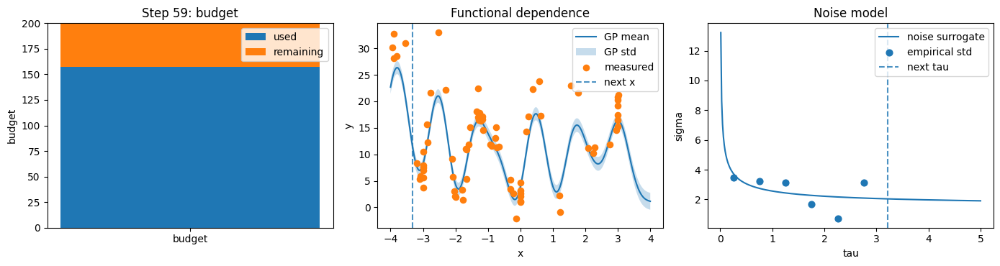

Measured y       : 16.1842


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 60
Current position : -3.322
Remaining budget : 39.096
Best action      : x=-2.574, tau=1.077
Step cost        : 1.825
Rollout score    : 0.1653
Noise bins used  : 6


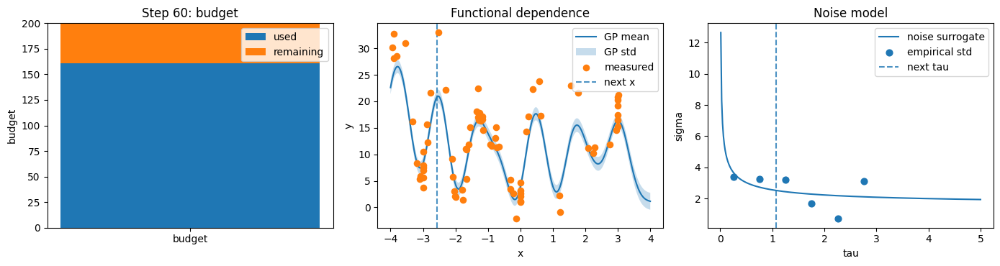

Measured y       : 31.6231


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 61
Current position : -2.574
Remaining budget : 37.271
Best action      : x=-2.241, tau=1.613
Step cost        : 1.946
Rollout score    : 0.2391
Noise bins used  : 6


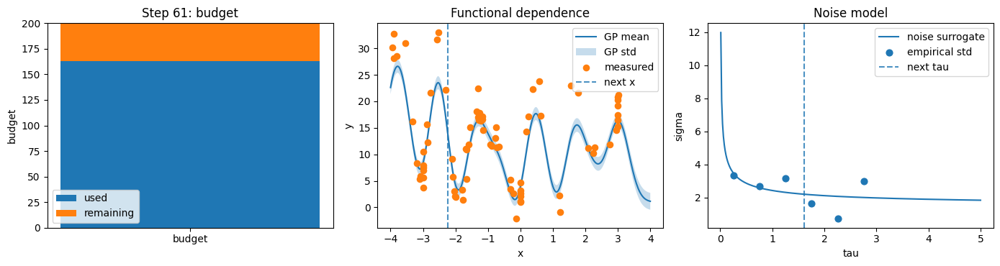

Measured y       : 17.3918


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 62
Current position : -2.241
Remaining budget : 35.325
Best action      : x=0.645, tau=0.674
Step cost        : 3.560
Rollout score    : 0.0214
Noise bins used  : 6


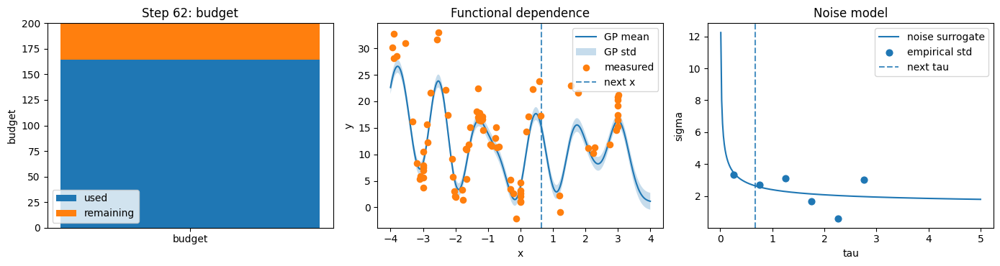

Measured y       : 16.1663


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 63
Current position : 0.645
Remaining budget : 31.765
Best action      : x=-0.719, tau=0.488
Step cost        : 1.852
Rollout score    : 0.2027
Noise bins used  : 6


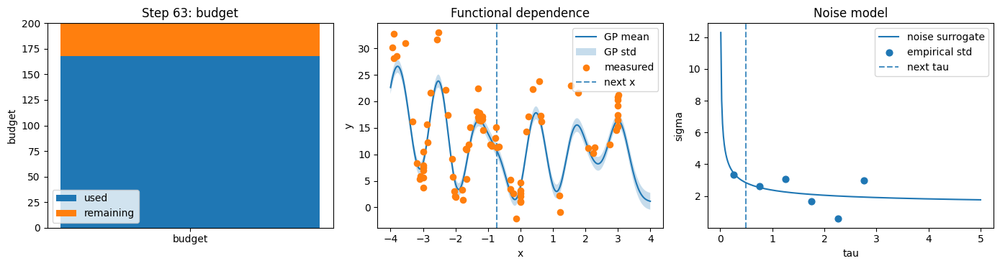

Measured y       : 13.8699


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 64
Current position : -0.719
Remaining budget : 29.913
Best action      : x=-1.594, tau=0.150
Step cost        : 1.025
Rollout score    : 0.2929
Noise bins used  : 6


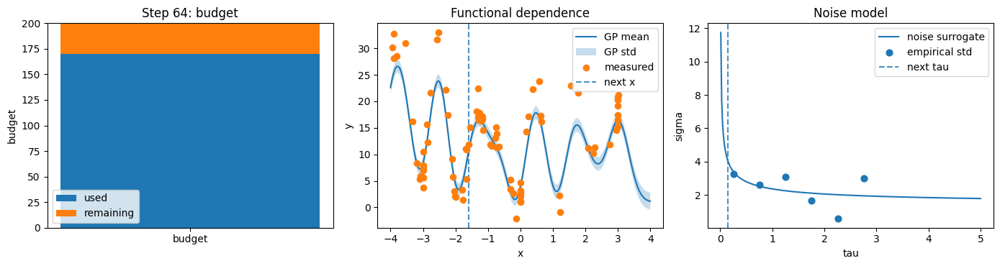

Measured y       : 16.8203


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 65
Current position : -1.594
Remaining budget : 28.888
Best action      : x=-1.093, tau=1.667
Step cost        : 2.168
Rollout score    : 0.1779
Noise bins used  : 6


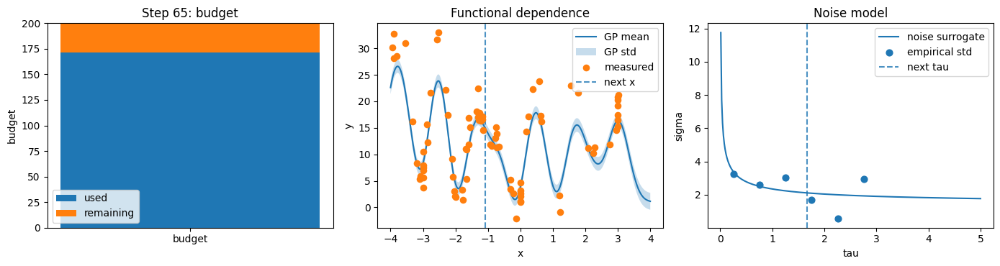

Measured y       : 14.0094


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 66
Current position : -1.093
Remaining budget : 26.720
Best action      : x=1.108, tau=0.996
Step cost        : 3.197
Rollout score    : 0.0175
Noise bins used  : 6


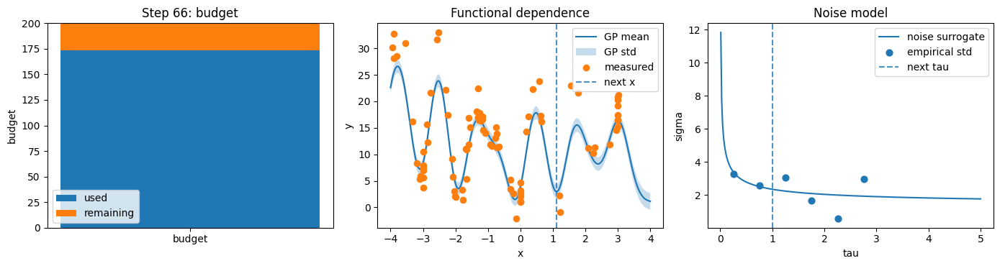

Measured y       : -4.2363


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 67
Current position : 1.108
Remaining budget : 23.523
Best action      : x=2.789, tau=0.178
Step cost        : 1.859
Rollout score    : 0.2394
Noise bins used  : 6


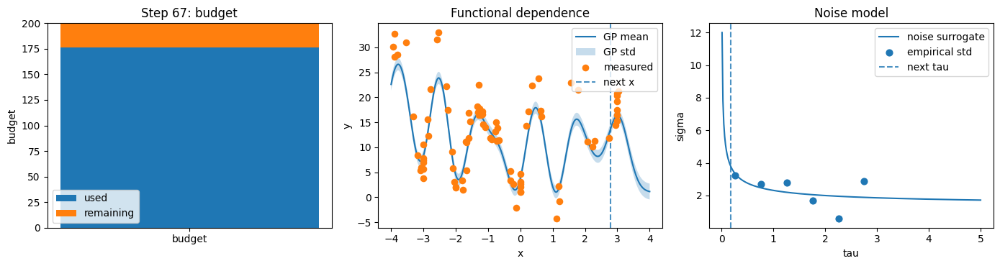

Measured y       : 12.6652


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 68
Current position : 2.789
Remaining budget : 21.664
Best action      : x=2.300, tau=2.050
Step cost        : 2.539
Rollout score    : 0.1920
Noise bins used  : 6


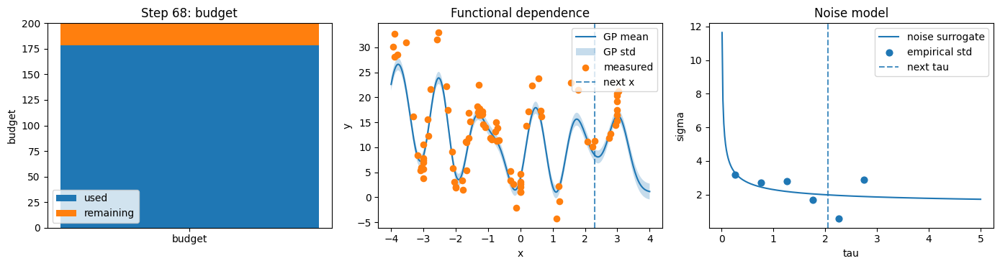

Measured y       : 10.4708


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 69
Current position : 2.300
Remaining budget : 19.125
Best action      : x=2.527, tau=2.634
Step cost        : 2.860
Rollout score    : 0.3173
Noise bins used  : 6


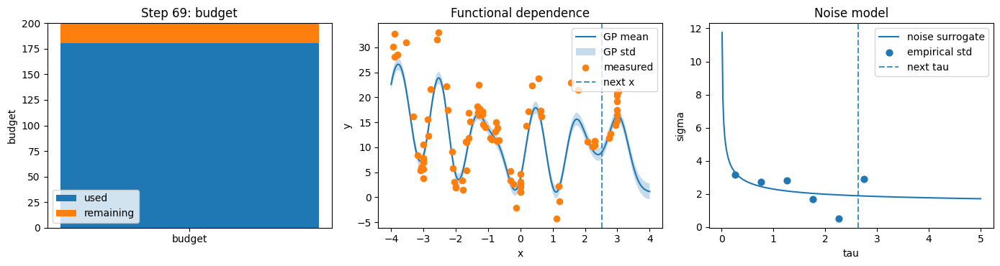

Measured y       : 14.0365


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 70
Current position : 2.527
Remaining budget : 16.265
Best action      : x=3.445, tau=1.092
Step cost        : 2.010
Rollout score    : 0.4747
Noise bins used  : 6


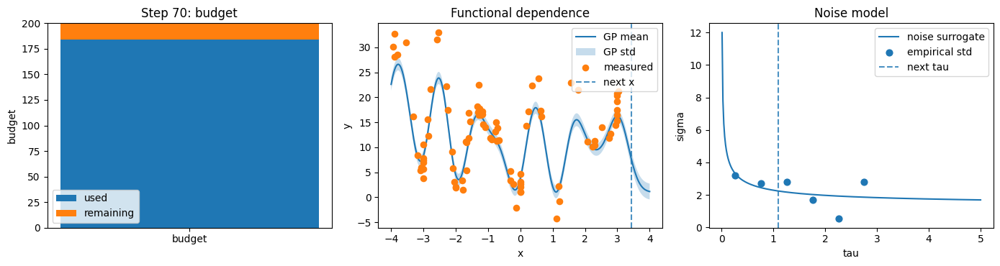

Measured y       : 33.9137


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 71
Current position : 3.445
Remaining budget : 14.255
Best action      : x=3.635, tau=0.399
Step cost        : 0.590
Rollout score    : 0.4849
Noise bins used  : 6


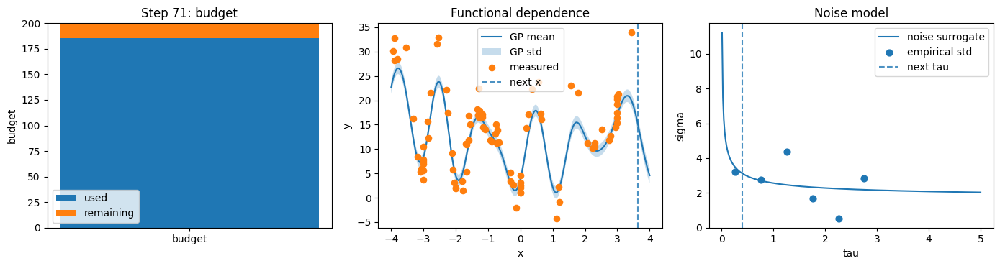

Measured y       : 25.1410


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 72
Current position : 3.635
Remaining budget : 13.665
Best action      : x=3.589, tau=2.555
Step cost        : 2.601
Rollout score    : 0.1497
Noise bins used  : 6


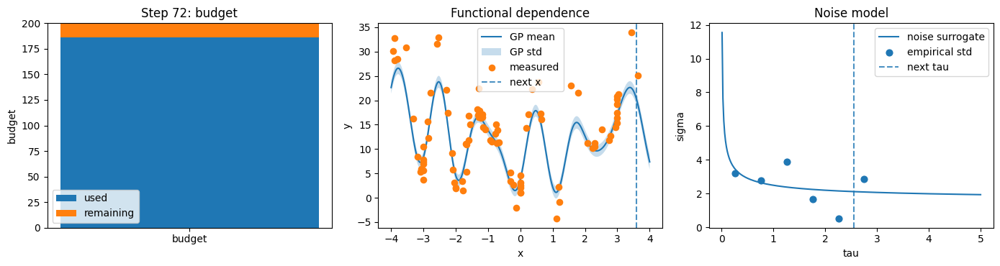

Measured y       : 29.5669


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 73
Current position : 3.589
Remaining budget : 11.063
Best action      : x=3.989, tau=0.524
Step cost        : 0.924
Rollout score    : 0.3700
Noise bins used  : 6


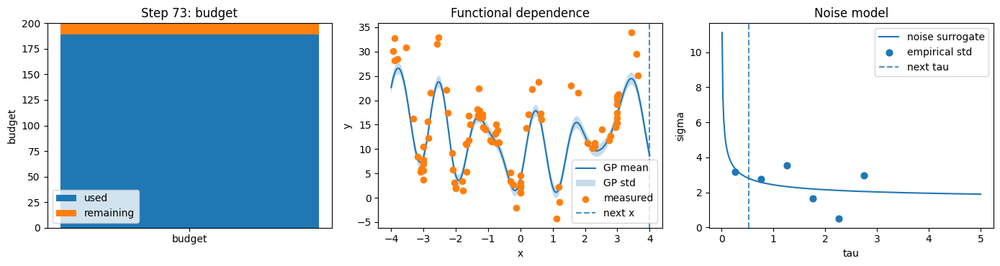

Measured y       : 10.5803


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 74
Current position : 3.989
Remaining budget : 10.139
Best action      : x=3.870, tau=2.840
Step cost        : 2.959
Rollout score    : 0.0738
Noise bins used  : 6


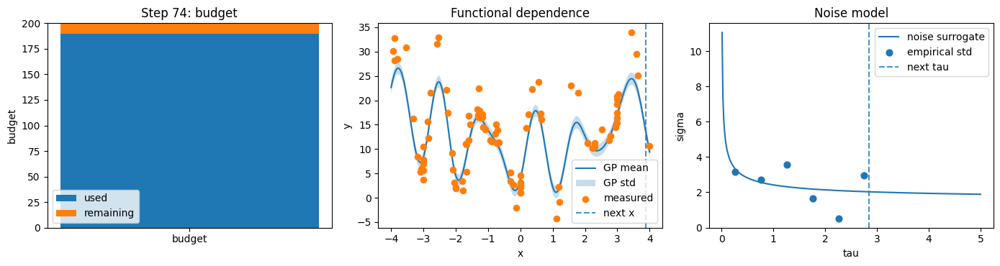

Measured y       : 12.0025


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 75
Current position : 3.870
Remaining budget : 7.180
Best action      : x=1.604, tau=1.161
Step cost        : 3.427
Rollout score    : -0.0393
Noise bins used  : 6


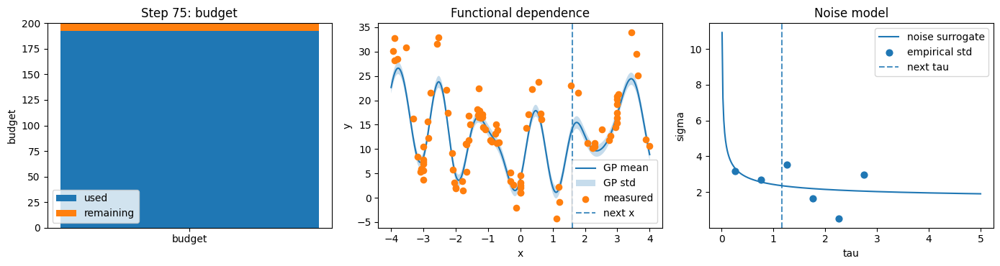

Measured y       : 24.1660


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(



STEP 76
Current position : 1.604
Remaining budget : 3.753
Best action      : x=0.299, tau=0.639
Step cost        : 1.944
Rollout score    : 0.3675
Noise bins used  : 6


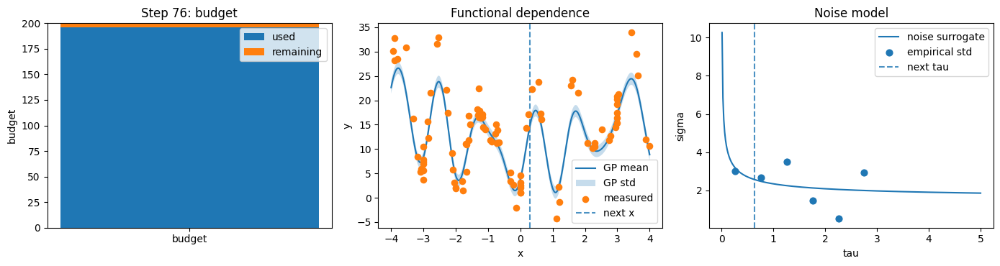

Measured y       : 23.6258
No feasible action found. Stopping.


/usr/local/lib/python3.12/dist-packages/gpytorch/models/exact_gp.py:299: GPInputWarning: The input matches the stored training data. Did you forget to call model.train()?
  warnings.warn(


In [ ]:
history = []
step_id = 0

# noise-model settings
n_tau_bins = 10
min_bin_count = 3

while B_remain > tau_min:

    # -----------------------------------------------------
    # fit GP mean on current data
    # -----------------------------------------------------
    y_fit, _ = gp_predict(
        x_train=x_data,
        y_train=y_data,
        x_test=x_data,
        training_iter=30,
        lr=0.1
    )

    # residuals for noise estimation
    resid = y_data - y_fit

    # -----------------------------------------------------
    # fit binned noise model from residuals
    # -----------------------------------------------------
    sigma_fn, tau_rep, sigma_rep = fit_noise_surrogate_binned(
        tau_data=tau_data,
        y_like_data=resid,
        tau_min=tau_min,
        tau_max=tau_max,
        n_bins=n_tau_bins,
        min_repeats=min_bin_count
    )

    # -----------------------------------------------------
    # choose next action by rollout
    # -----------------------------------------------------
    best_action, best_score, diag = select_action_rollout(
        x_current=x_current,
        B_remain=B_remain,
        x_data=x_data,
        tau_data=tau_data,
        y_data=y_data,
        sigma_fn=sigma_fn,
        gp_predict=gp_predict,
        x_min=x_min, x_max=x_max,
        tau_min=tau_min, tau_max=tau_max,
        depth=3,
        n_mc_root=10,
        n_mc_roll=10,
        gamma=0.9,
        training_iter=10,
        lr=0.1,
        lam_cost=0.2,
        w_signal=1.0,
        w_noise=0.6
    )

    if best_action is None:
        print("No feasible action found. Stopping.")
        break

    x_next, tau_next = best_action
    step_cost = abs(x_next - x_current) + tau_next

    if step_cost > B_remain:
        print("Selected action exceeds remaining budget. Stopping.")
        break

    print("\n" + "=" * 60)
    print(f"STEP {step_id}")
    print("=" * 60)
    print(f"Current position : {x_current:.3f}")
    print(f"Remaining budget : {B_remain:.3f}")
    print(f"Best action      : x={x_next:.3f}, tau={tau_next:.3f}")
    print(f"Step cost        : {step_cost:.3f}")
    print(f"Rollout score    : {best_score:.4f}")
    print(f"Noise bins used  : {len(tau_rep)}")

    plot_campaign_state(
        step_id=step_id,
        B_total=B_total,
        B_remain=B_remain,
        x_data=x_data,
        tau_data=tau_data,
        y_data=y_data,
        sigma_fn=sigma_fn,
        tau_rep=tau_rep,
        sigma_rep=sigma_rep,
        gp_predict=gp_predict,
        x_min=x_min, x_max=x_max,
        tau_min=tau_min, tau_max=tau_max,
        training_iter=10,
        lr=0.1,
        best_action=best_action
    )

    # -----------------------------------------------------
    # perform measurement
    # -----------------------------------------------------
    y_next = meas_sim.measure(np.array([[x_next, tau_next]]))[0]
    print(f"Measured y       : {y_next:.4f}")

    # -----------------------------------------------------
    # update dataset and state
    # -----------------------------------------------------
    x_data = np.append(x_data, x_next)
    tau_data = np.append(tau_data, tau_next)
    y_data = np.append(y_data, y_next)

    B_remain -= step_cost
    x_current = x_next

    history.append({
        "step": step_id,
        "x": x_next,
        "tau": tau_next,
        "y": y_next,
        "cost": step_cost,
        "budget_left": B_remain,
        "score": best_score,
        "n_noise_bins": len(tau_rep)
    })

    step_id += 1

    if B_remain <= tau_min:
        break

In [ ]:
for x in x_seed:
    for tau in tau_seed:
        for _ in range(n_rep):

            cost = tau   # seed assumes no travel cost for now
            if spent_seed + cost > budget_seed:
                break

            y = meas_sim.measure(np.array([[x, tau]]))[0]

            x_data.append(x)
            tau_data.append(tau)
            y_data.append(y)

            spent_seed += cost

x_data = np.array(x_data)
tau_data = np.array(tau_data)
y_data = np.array(y_data)

# current position: last measured seed point
x_current = x_data[-1]

print(f"Seed budget spent: {spent_seed:.3f}")
print(f"Number of seed measurements: {len(y_data)}")
print("Unique x in seed   :", np.unique(x_data))
print("Unique tau in seed :", np.unique(tau_data))

Seed budget spent: 18.500
Number of seed measurements: 16
Unique x in seed   : [-3.  0.  3.]
Unique tau in seed : [0.5 2. ]


In [ ]:
# =========================================================
# 4. Predict functional dependence
# =========================================================
def predict_function_gp(model, likelihood, x_test):
    """
    Predict GP mean and std on x_test.
    """
    x_test = np.asarray(x_test, dtype=float)
    test_x = torch.as_tensor(x_test, dtype=torch.float32)

    if test_x.ndim == 1:
        test_x = test_x.unsqueeze(-1)

    model.eval()
    likelihood.eval()

    with torch.no_grad(), gpytorch.settings.fast_pred_var():
        pred = likelihood(model(test_x))
        mean = pred.mean.cpu().numpy()
        std = pred.stddev.cpu().numpy()

    return mean, std


# =========================================================
# 5. Predict noise model on tau grid
# =========================================================
def predict_noise_model(sigma_fn, tau_test):
    tau_test = np.asarray(tau_test, dtype=float)
    sigma = sigma_fn(tau_test)
    return sigma

In [ ]:
# fit noise model
sigma_fn, tau_rep, sigma_rep = fit_noise_model(
    x_data=x_data,
    tau_data=tau_data,
    y_data=y_data
)

# fit functional GP with learned heteroskedastic noise
model, likelihood = fit_function_gp(
    x_data=x_data,
    y_data=y_data,
    tau_data=tau_data,
    sigma_fn=sigma_fn,
    training_iter=100,
    lr=0.1
)

# predict function
x_grid = np.linspace(-4, 4, 300)
y_mean, y_std = predict_function_gp(model, likelihood, x_grid)

# predict noise
tau_grid = np.linspace(0.2, 2.0, 300)
sigma_grid = predict_noise_model(sigma_fn, tau_grid)

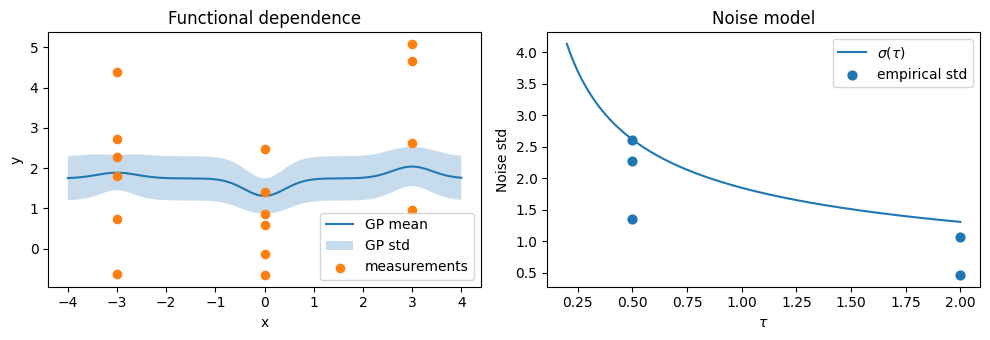

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(10, 3.5))

# functional dependence
ax[0].plot(x_grid, y_mean, label='GP mean')
ax[0].fill_between(x_grid, y_mean - y_std, y_mean + y_std, alpha=0.25, label='GP std')
ax[0].scatter(x_data, y_data, s=35, zorder=3, label='measurements')
ax[0].set_xlabel('x')
ax[0].set_ylabel('y')
ax[0].set_title('Functional dependence')
ax[0].legend()

# noise model
ax[1].plot(tau_grid, sigma_grid, label=r'$\sigma(\tau)$')
if len(tau_rep) > 0:
    ax[1].scatter(tau_rep, sigma_rep, s=40, zorder=3, label='empirical std')
ax[1].set_xlabel(r'$\tau$')
ax[1].set_ylabel(r'Noise std')
ax[1].set_title('Noise model')
ax[1].legend()

plt.tight_layout()
plt.show()

In [ ]:
# =========================================================
# 1. Seed measurements at the starting point
# =========================================================
x_data, tau_data, y_data = [], [], []
spent_seed = 0.0

for tau in tau_list:
    for _ in range(n_rep):
        cost = tau   # no travel cost at x0

        if spent_seed + cost > budget_seed:
            break

        y = meas_sim.measure(np.array([[x0, tau]]))[0]

        x_data.append(x0)
        tau_data.append(tau)
        y_data.append(y)
        spent_seed += cost

x_data = np.array(x_data)
tau_data = np.array(tau_data)
y_data = np.array(y_data)

print(f"Seed budget spent: {spent_seed:.3f}")
print(f"Seed measurements: {len(y_data)}")

Seed budget spent: 7.500
Seed measurements: 6


In [ ]:
# =========================================================
# 2. Fit surrogate model for the signal
# =========================================================
def fit_surrogate(x_data, y_data):
    X = x_data.reshape(-1, 1)

    kernel = (
        C(1.0, (1e-3, 1e3))
        * RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2))
        + WhiteKernel(noise_level=1e-3, noise_level_bounds=(1e-6, 1e1))
    )

    gp = GaussianProcessRegressor(
        kernel=kernel,
        normalize_y=True,
        n_restarts_optimizer=3
    )
    gp.fit(X, y_data)
    return gp

In [ ]:
# =========================================================
# 3. Fit a simple noise model sigma(tau)
#    estimated from repeated seed measurements
# =========================================================
def fit_noise_model(x_data, tau_data, y_data):
    tau_unique = np.unique(tau_data)

    tau_rep = []
    sigma_rep = []

    for tau in tau_unique:
        yy = y_data[tau_data == tau]
        if len(yy) >= 2:
            tau_rep.append(tau)
            sigma_rep.append(np.std(yy, ddof=1))

    tau_rep = np.array(tau_rep)
    sigma_rep = np.array(sigma_rep)

    # fallback if too little repeated data
    if len(tau_rep) < 2:
        def sigma_fn(tau):
            return 0.2 / np.sqrt(tau) + 0.05
        return sigma_fn

    # fit sigma(tau) = a / sqrt(tau) + b
    A = np.column_stack([1 / np.sqrt(tau_rep), np.ones_like(tau_rep)])
    coeff, _, _, _ = np.linalg.lstsq(A, sigma_rep, rcond=None)
    a, b = coeff

    a = max(a, 0.0)
    b = max(b, 1e-6)

    def sigma_fn(tau):
        return a / np.sqrt(tau) + b

    return sigma_fn


In [ ]:
# 5. Sample Monte Carlo candidate actions
# =========================================================
def sample_actions(n_mc, x_min, x_max, tau_min, tau_max):
    x_cand = np.random.uniform(x_min, x_max, n_mc)
    tau_cand = np.random.uniform(tau_min, tau_max, n_mc)
    return x_cand, tau_cand

In [ ]:
# =========================================================
# 6. Choose the next action
#    reward = surrogate uncertainty / expected noise - cost
# =========================================================
def select_best_action(gp, sigma_fn, x_current, B_remain, n_mc=100):
    x_cand, tau_cand = sample_actions(n_mc, x_min, x_max, tau_min, tau_max)

    best_action = None
    best_score = -np.inf

    for x_next, tau in zip(x_cand, tau_cand):
        cost = action_cost(x_current, x_next, tau)

        if cost > B_remain:
            continue

        _, std = gp.predict(np.array([[x_next]]), return_std=True)
        sigma = sigma_fn(tau)

        score = std[0] / (sigma + eps) - lam_cost * cost

        if score > best_score:
            best_score = score
            best_action = (x_next, tau)

    return best_action, best_score

In [ ]:
# =========================================================
# 7. Build models and select the first adaptive measurement
# =========================================================
B_remain = B_total - spent_seed

gp = fit_surrogate(x_data, y_data)
sigma_fn = fit_noise_model(x_data, tau_data, y_data)

best_action, best_score = select_best_action(
    gp=gp,
    sigma_fn=sigma_fn,
    x_current=x_current,
    B_remain=B_remain,
    n_mc=n_mc
)

print("Estimated noise at tau=0.5 :", sigma_fn(0.5))
print("Estimated noise at tau=2.0 :", sigma_fn(2.0))
print("Next action (x, tau)       :", best_action)
print("Action score               :", best_score)

Estimated noise at tau=0.5 : 4.28637534767773
Estimated noise at tau=2.0 : 2.143188173838865
Next action (x, tau)       : (np.float64(-0.0035770500184444387), np.float64(1.6004020751671755))
Action score               : 0.3364353617344983


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified lower bound 0.001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


In [ ]:
# =========================================================
# 8. One closed-loop measurement step
# =========================================================
if best_action is not None:
    x_next, tau_next = best_action

    # perform measurement
    y_next = meas_sim.measure(np.array([[x_next, tau_next]]))[0]

    # update dataset
    x_data = np.append(x_data, x_next)
    tau_data = np.append(tau_data, tau_next)
    y_data = np.append(y_data, y_next)

    # update state
    step_cost = action_cost(x_current, x_next, tau_next)
    B_remain -= step_cost
    x_current = x_next

    print("\nExecuted action:")
    print("x_next   =", x_next)
    print("tau_next =", tau_next)
    print("y_next   =", y_next)
    print("step cost=", step_cost)
    print("budget remaining =", B_remain)


Executed action:
x_next   = -0.0035770500184444387
tau_next = 1.6004020751671755
y_next   = 0.38609533147208286
step cost= 1.6075561752040644
budget remaining = 90.89244382479593



STEP 0
Current position      : -0.004
Remaining budget      : 90.892
Number of points      : 7
Noise estimate tau=0.5: 4.286
Noise estimate tau=2.0: 2.143


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified lower bound 0.001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


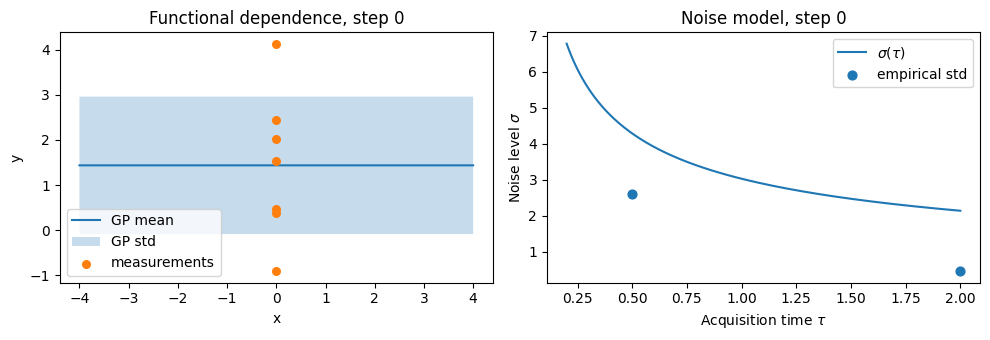


Selected action:
  x_next   = 0.062
  tau_next = 1.210
  cost     = 1.340
  score    = 0.2840

Measurement result:
  y_next = 2.1520

Updated state:
  new position     = 0.062
  remaining budget = 89.552

Updated model after measurement:
  Noise estimate tau=0.5: 4.286
  Noise estimate tau=2.0: 2.143


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified lower bound 0.001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


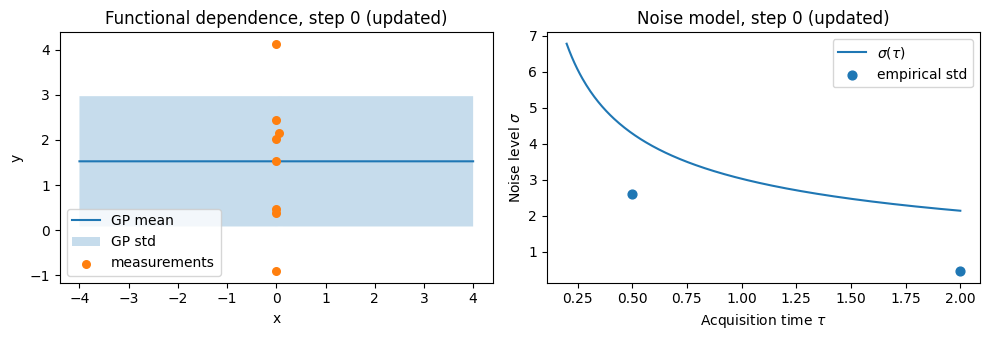


STEP 1
Current position      : 0.062
Remaining budget      : 89.552
Number of points      : 8
Noise estimate tau=0.5: 4.286
Noise estimate tau=2.0: 2.143


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified lower bound 0.001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 0.01. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


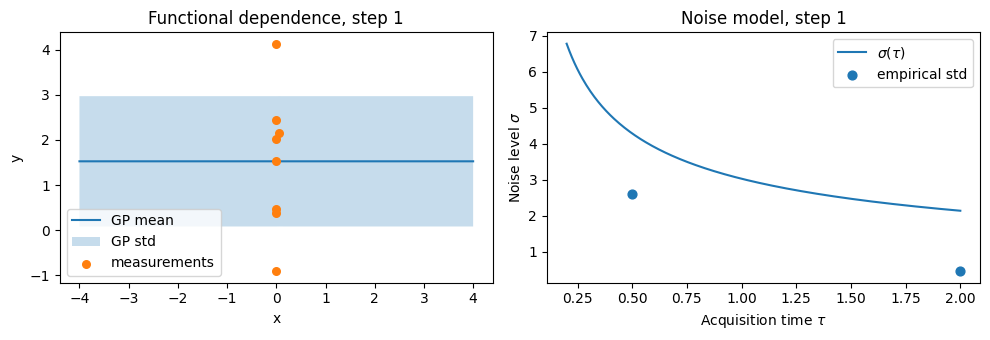


Selected action:
  x_next   = 0.078
  tau_next = 1.633
  cost     = 1.665
  score    = 0.2751

Measurement result:
  y_next = 0.8475

Updated state:
  new position     = 0.078
  remaining budget = 87.887

Updated model after measurement:
  Noise estimate tau=0.5: 4.286
  Noise estimate tau=2.0: 2.143


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified lower bound 0.001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 0.01. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


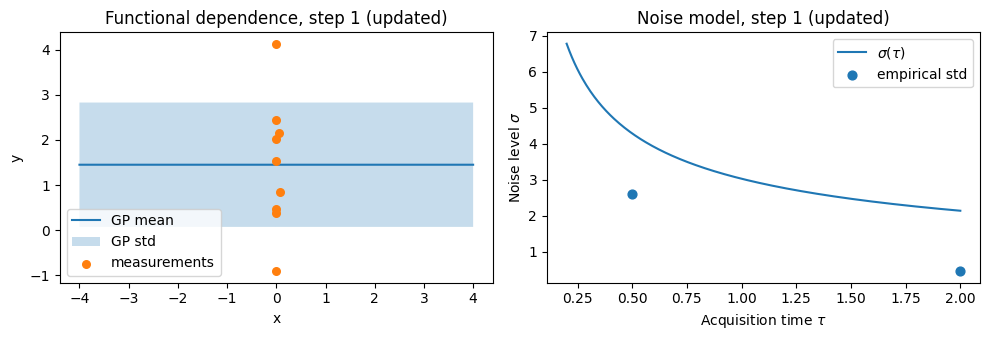


STEP 2


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified lower bound 0.001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 0.01. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


Current position      : 0.078
Remaining budget      : 87.887
Number of points      : 9
Noise estimate tau=0.5: 4.286
Noise estimate tau=2.0: 2.143


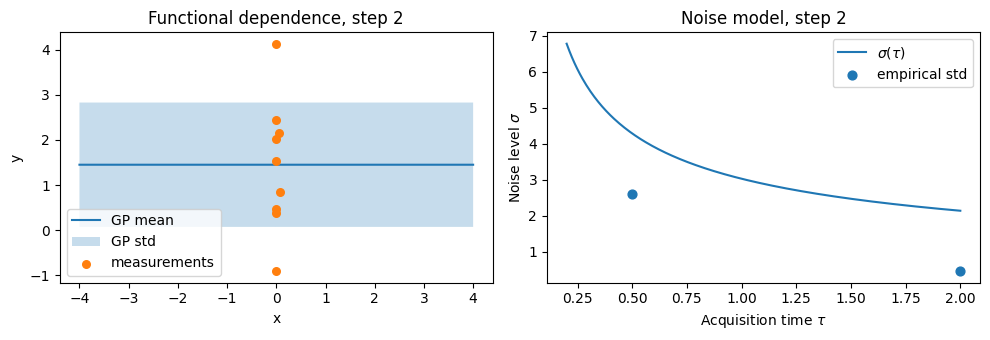


Selected action:
  x_next   = 0.079
  tau_next = 1.229
  cost     = 1.231
  score    = 0.2575

Measurement result:
  y_next = 0.7769

Updated state:
  new position     = 0.079
  remaining budget = 86.656


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified lower bound 0.001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(



Updated model after measurement:
  Noise estimate tau=0.5: 4.286
  Noise estimate tau=2.0: 2.143


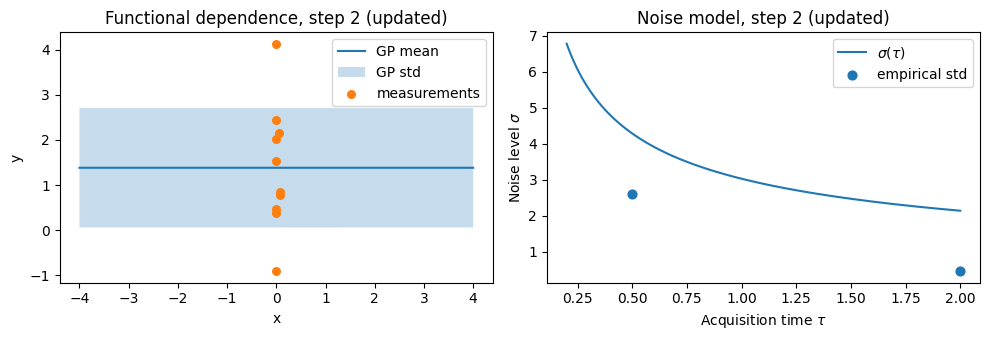


STEP 3
Current position      : 0.079
Remaining budget      : 86.656
Number of points      : 10
Noise estimate tau=0.5: 4.286
Noise estimate tau=2.0: 2.143


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified lower bound 0.001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


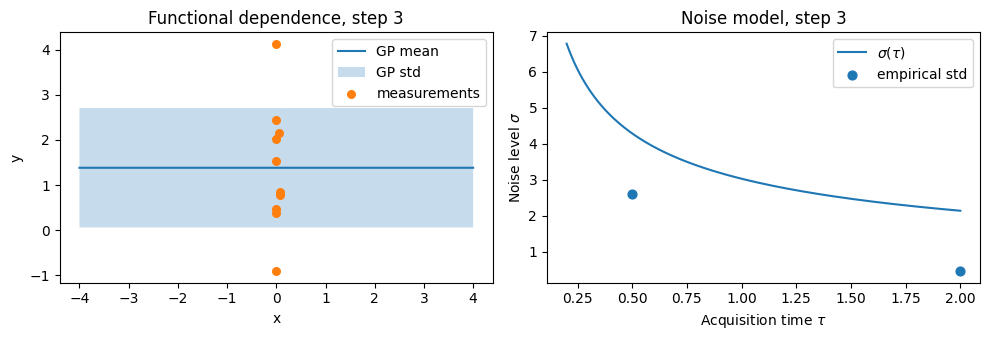


Selected action:
  x_next   = 0.029
  tau_next = 1.061
  cost     = 1.160
  score    = 0.2170

Measurement result:
  y_next = 1.4482

Updated state:
  new position     = 0.029
  remaining budget = 85.495

Updated model after measurement:
  Noise estimate tau=0.5: 4.286
  Noise estimate tau=2.0: 2.143


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified lower bound 0.001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


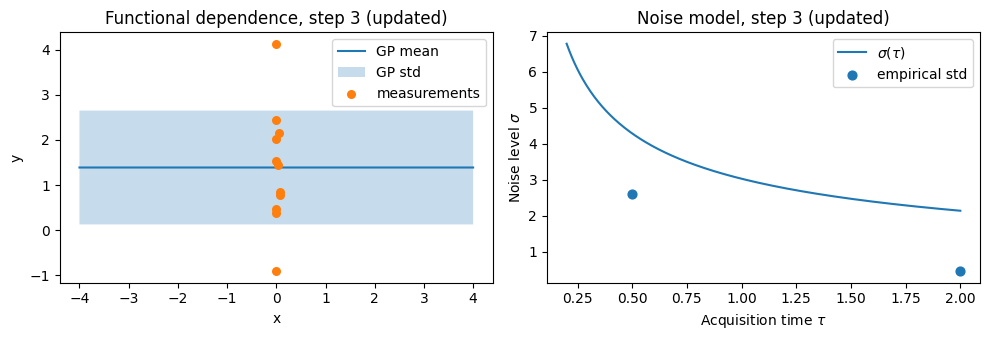


STEP 4
Current position      : 0.029
Remaining budget      : 85.495
Number of points      : 11
Noise estimate tau=0.5: 4.286
Noise estimate tau=2.0: 2.143


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified lower bound 0.001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


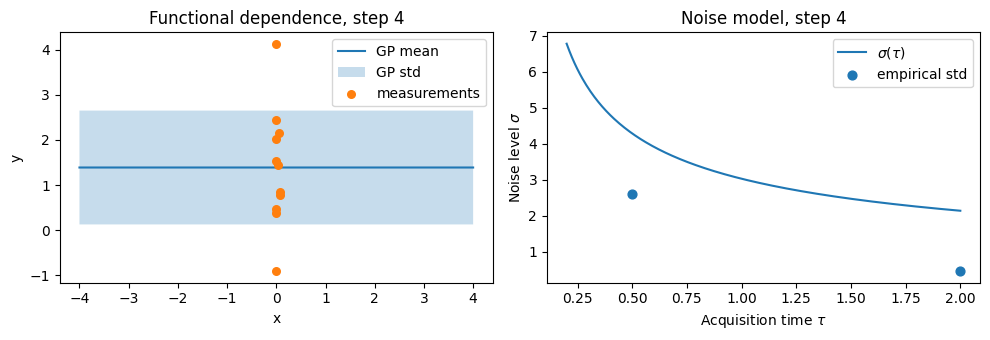


Selected action:
  x_next   = -0.044
  tau_next = 1.249
  cost     = 1.396
  score    = 0.1857

Measurement result:
  y_next = -1.1289

Updated state:
  new position     = -0.044
  remaining budget = 84.100

Updated model after measurement:
  Noise estimate tau=0.5: 4.286
  Noise estimate tau=2.0: 2.143


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified lower bound 0.001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 0.01. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


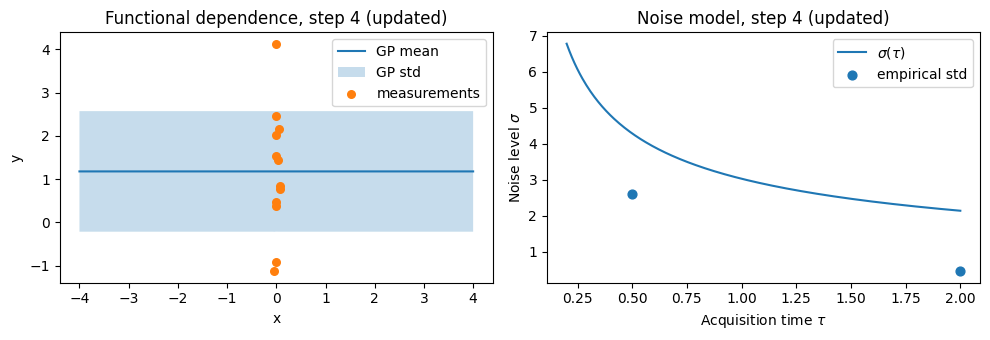


STEP 5
Current position      : -0.044
Remaining budget      : 84.100
Number of points      : 12
Noise estimate tau=0.5: 4.286
Noise estimate tau=2.0: 2.143


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified lower bound 0.001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


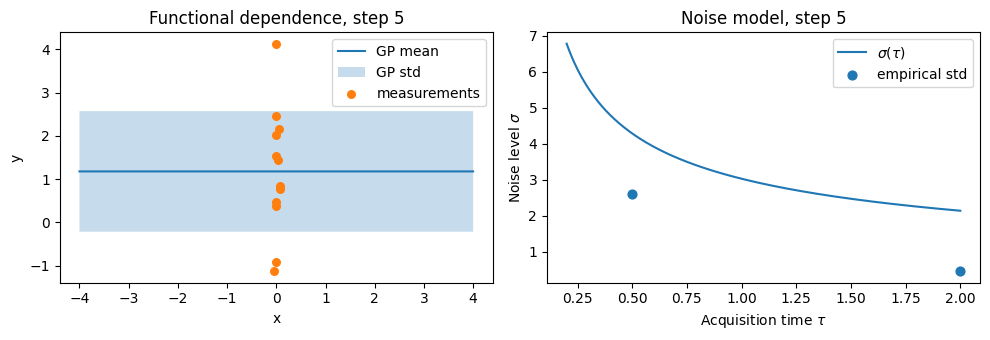


Selected action:
  x_next   = -0.059
  tau_next = 1.460
  cost     = 1.490
  score    = 0.2577

Measurement result:
  y_next = 3.0146

Updated state:
  new position     = -0.059
  remaining budget = 82.610

Updated model after measurement:
  Noise estimate tau=0.5: 4.286
  Noise estimate tau=2.0: 2.143


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified lower bound 0.001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


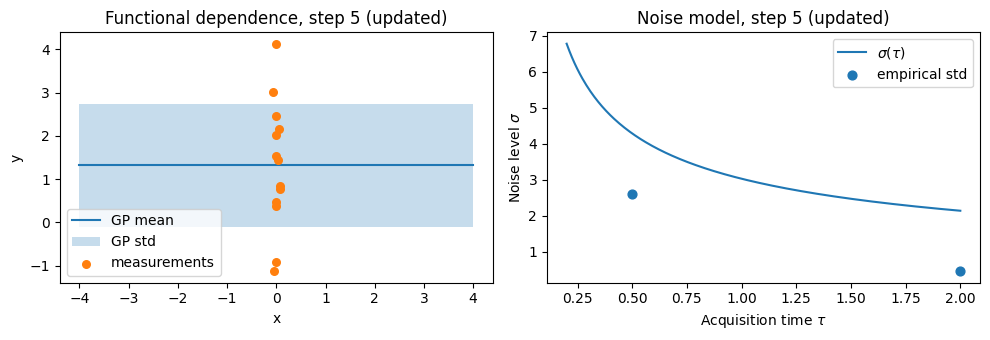


STEP 6
Current position      : -0.059
Remaining budget      : 82.610
Number of points      : 13
Noise estimate tau=0.5: 4.286
Noise estimate tau=2.0: 2.143


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified lower bound 0.001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified upper bound 100.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


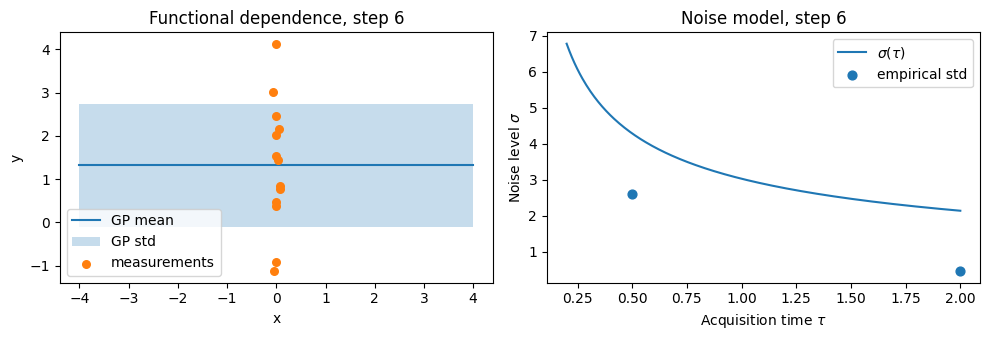


Selected action:
  x_next   = -0.057
  tau_next = 1.140
  cost     = 1.145
  score    = 0.2733

Measurement result:
  y_next = 0.1693

Updated state:
  new position     = -0.057
  remaining budget = 81.465

Updated model after measurement:
  Noise estimate tau=0.5: 4.286
  Noise estimate tau=2.0: 2.143


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:442: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified lower bound 0.001. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


KeyboardInterrupt: 

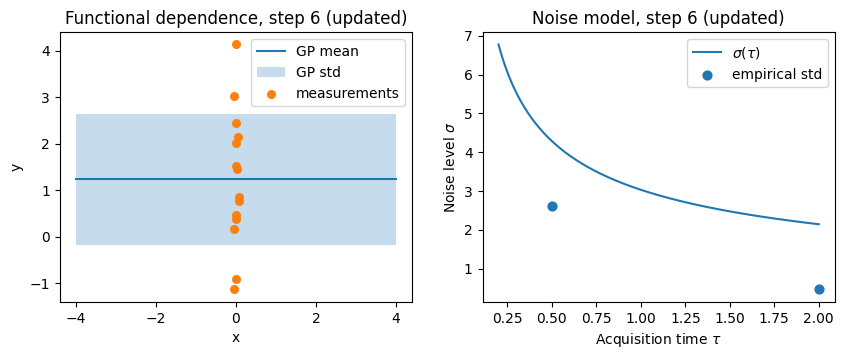

In [ ]:
# =========================================================
# verbose campaign loop with plots
# =========================================================
history = []
step_id = 0

while B_remain > tau_min:

    print("\n" + "="*50)
    print(f"STEP {step_id}")
    print("="*50)

    # -----------------------------------------------------
    # fit models
    # -----------------------------------------------------
    gp = fit_surrogate(x_data, y_data)
    sigma_fn = fit_noise_model(x_data, tau_data, y_data)

    print(f"Current position      : {x_current:.3f}")
    print(f"Remaining budget      : {B_remain:.3f}")
    print(f"Number of points      : {len(y_data)}")
    print(f"Noise estimate tau=0.5: {sigma_fn(0.5):.3f}")
    print(f"Noise estimate tau=2.0: {sigma_fn(2.0):.3f}")

    # show current models before taking the next action
    plot_models(
        gp=gp,
        sigma_fn=sigma_fn,
        x_data=x_data,
        y_data=y_data,
        tau_data=tau_data,
        x_min=x_min,
        x_max=x_max,
        tau_min=tau_min,
        tau_max=tau_max,
        step_id=step_id
    )

    # -----------------------------------------------------
    # select next action
    # -----------------------------------------------------
    best_action, best_score = select_best_action(
        gp=gp,
        sigma_fn=sigma_fn,
        x_current=x_current,
        B_remain=B_remain,
        n_mc=n_mc
    )

    if best_action is None:
        print("No feasible action found. Stopping.")
        break

    x_next, tau_next = best_action
    step_cost = action_cost(x_current, x_next, tau_next)

    print("\nSelected action:")
    print(f"  x_next   = {x_next:.3f}")
    print(f"  tau_next = {tau_next:.3f}")
    print(f"  cost     = {step_cost:.3f}")
    print(f"  score    = {best_score:.4f}")

    if step_cost > B_remain:
        print("Action exceeds remaining budget. Stopping.")
        break

    # -----------------------------------------------------
    # perform measurement
    # -----------------------------------------------------
    y_next = meas_sim.measure(np.array([[x_next, tau_next]]))[0]

    print("\nMeasurement result:")
    print(f"  y_next = {y_next:.4f}")

    # -----------------------------------------------------
    # update dataset and state
    # -----------------------------------------------------
    x_data = np.append(x_data, x_next)
    tau_data = np.append(tau_data, tau_next)
    y_data = np.append(y_data, y_next)

    B_remain -= step_cost
    x_current = x_next

    print("\nUpdated state:")
    print(f"  new position     = {x_current:.3f}")
    print(f"  remaining budget = {B_remain:.3f}")

    history.append({
        "step": step_id,
        "x": x_next,
        "tau": tau_next,
        "y": y_next,
        "cost": step_cost,
        "budget_left": B_remain,
        "score": best_score
    })

    # -----------------------------------------------------
    # refit and show updated models after the new point
    # -----------------------------------------------------
    gp_updated = fit_surrogate(x_data, y_data)
    sigma_fn_updated = fit_noise_model(x_data, tau_data, y_data)

    print("\nUpdated model after measurement:")
    print(f"  Noise estimate tau=0.5: {sigma_fn_updated(0.5):.3f}")
    print(f"  Noise estimate tau=2.0: {sigma_fn_updated(2.0):.3f}")

    plot_models(
        gp=gp_updated,
        sigma_fn=sigma_fn_updated,
        x_data=x_data,
        y_data=y_data,
        tau_data=tau_data,
        x_min=x_min,
        x_max=x_max,
        tau_min=tau_min,
        tau_max=tau_max,
        step_id=f"{step_id} (updated)"
    )

    step_id += 1


print("\n" + "="*50)
print("CAMPAIGN FINISHED")
print("="*50)
print(f"Total points collected: {len(y_data)}")
print(f"Final remaining budget: {B_remain:.3f}")

In [ ]:
import numpy as np
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, WhiteKernel

# -------------------------------------------------
# current data
# x_data   : measured positions
# y_data   : measured values
# tau_data : acquisition times used for each measurement
# -------------------------------------------------
x_data   = np.array([0.0, 0.0, 0.0, 1.2, 1.2, -0.8])
tau_data = np.array([0.3, 1.0, 2.0, 0.5, 1.5, 0.7])
y_data   = np.array([0.45, 0.52, 0.50, 1.10, 1.02, -0.20])

x_current = 0.0
B_remain = 10.0

x_min, x_max = -4.0, 4.0
tau_min, tau_max = 0.2, 2.0

n_mc = 100
lam_cost = 0.2
eps = 1e-6

# -------------------------------------------------
# cost model
# -------------------------------------------------
def action_cost(x_current, x_next, tau):
    return abs(x_next - x_current) + tau

# -------------------------------------------------
# surrogate model for signal
# -------------------------------------------------
def fit_surrogate(x_data, y_data):
    X = x_data.reshape(-1, 1)
    kernel = C(1.0) * RBF(length_scale=1.0) + WhiteKernel(noise_level=1e-3)
    gp = GaussianProcessRegressor(kernel=kernel, normalize_y=True)
    gp.fit(X, y_data)
    return gp

# -------------------------------------------------
# very simple empirical noise model sigma(tau)
# estimated from repeated measurements at same x
# -------------------------------------------------
def fit_noise_model(x_data, tau_data, y_data, tol=1e-8):
    """
    Returns a function sigma(tau).
    We estimate empirical std from repeated measurements at the same x and tau.
    Then fit a simple law: sigma(tau) = a / sqrt(tau) + b
    """
    x_data = np.asarray(x_data)
    tau_data = np.asarray(tau_data)
    y_data = np.asarray(y_data)

    tau_rep = []
    sigma_rep = []

    # group by (x, tau)
    for x0 in np.unique(x_data):
        mask_x = np.abs(x_data - x0) < tol
        taus_here = np.unique(tau_data[mask_x])

        for tau0 in taus_here:
            mask = mask_x & (np.abs(tau_data - tau0) < tol)
            yy = y_data[mask]

            if len(yy) >= 2:
                tau_rep.append(tau0)
                sigma_rep.append(np.std(yy, ddof=1))

    tau_rep = np.array(tau_rep)
    sigma_rep = np.array(sigma_rep)

    # fallback if not enough repeated data
    if len(tau_rep) < 2:
        def sigma_fn(tau):
            return 0.2 / np.sqrt(tau) + 0.05
        return sigma_fn

    # fit sigma(tau) = a / sqrt(tau) + b by least squares
    A = np.column_stack([1 / np.sqrt(tau_rep), np.ones_like(tau_rep)])
    coeff, *_ = np.linalg.lstsq(A, sigma_rep, rcond=None)
    a, b = coeff

    a = max(a, 0.0)
    b = max(b, 1e-6)

    def sigma_fn(tau):
        tau = np.asarray(tau)
        return a / np.sqrt(tau) + b

    return sigma_fn

# -------------------------------------------------
# Monte Carlo candidate actions
# -------------------------------------------------
def sample_actions(n_mc, x_min, x_max, tau_min, tau_max):
    x_cand = np.random.uniform(x_min, x_max, n_mc)
    tau_cand = np.random.uniform(tau_min, tau_max, n_mc)
    return x_cand, tau_cand

# -------------------------------------------------
# action selection
# score = surrogate uncertainty / expected noise - cost penalty
# -------------------------------------------------
def select_best_action(gp, sigma_fn, x_current, B_remain, n_mc=100):
    x_cand, tau_cand = sample_actions(n_mc, x_min, x_max, tau_min, tau_max)

    best_score = -np.inf
    best_action = None

    for x_next, tau in zip(x_cand, tau_cand):
        c = action_cost(x_current, x_next, tau)
        if c > B_remain:
            continue

        mean, std = gp.predict(np.array([[x_next]]), return_std=True)
        sigma = sigma_fn(tau)

        # high GP uncertainty is good, high expected noise is bad
        score = std[0] / (sigma + eps) - lam_cost * c

        if score > best_score:
            best_score = score
            best_action = (x_next, tau)

    return best_action, best_score

# -------------------------------------------------
# run one step
# -------------------------------------------------
gp = fit_surrogate(x_data, y_data)
sigma_fn = fit_noise_model(x_data, tau_data, y_data)

best_action, best_score = select_best_action(
    gp=gp,
    sigma_fn=sigma_fn,
    x_current=x_current,
    B_remain=B_remain,
    n_mc=n_mc
)

print("Predicted sigma at tau=0.3:", sigma_fn(0.3))
print("Predicted sigma at tau=2.0:", sigma_fn(2.0))
print("Best action:", best_action)
print("Best score:", best_score)

array([1.14647823, 1.0918608 , 0.89869057, 1.04029976, 0.97645785,
       0.97602703])